# MultiOmics RNA + ATAC for Chao dataset emphasis on OL population (MORNAATACCOL) technical documentation
## Multiomics RNAseq & ATACseq on EAE model

<hr>

**This notebook is the following of MORNAATACCOL 4 notebook**

<hr>

In [ ]:
#Memory needed for a full run : 256Gb

In [1]:
#Early1               = P21208_1003_EAE_ARC
#PeakCtrl2            = P21208_1004_EAE_ARC
#Peak2                = P21208_1005_EAE_ARC
#LateCtrl1            = MORNAATACC_1002 (P21520_1002)
#Late1                = MORNAATACC_1003 (P21520_1003)
#Early2               = P23605_1001
#EarlyCtrl2           = P23605_1002
#Peak3                = P23605_1003
#PeakCtrl3            = P23605_1004
#EarlyCtrl3           = P24115_1001
#EarlyFemale3         = P24115_1002
#EarlyMale3           = P24115_1003
#Late2                = P25316_1001
#LateCtrl2            = P25316_1002
#Late3                = P25316_1003
#LateCtrl3            = P25316_1004
#PeakMale4            = P27208_1001
#PeakFemale4          = P27208_1002
#LateMale4            = P27208_1003
#LateFemale4          = P27208_1004
#Naive1               = P26203_1003
#Naive2               = P26203_1004
#Peak5                = P29557_1001
#Late5                = P29557_1002
#Naive3               = P29557_1004
#EarlyCtrl4           = P29557_1005
#EarlyCtrlMale5       = P29557_1006
#EarlyCtrlFemale5     = P29557_1007
#Early4               = P29557_1008
#EarlyMale5           = P29557_1009
#EarlyFemale5         = P29557_1010

## 0. Environment status

In [5]:
%use

Subkernel,Kernel Name,Language,Language Module,Interpreter
Bash,bash,bash,sos_bash,/usr/bin/python3
Bash,calysto_bash,bash,sos_bash,python
Python3,python3,python,sos_python,python
R,ir,R,sos_r,/usr/lib/R/bin/R
SoS,sos,sos,,/usr/bin/python3


In [3]:
lsb_release -a

No LSB modules are available.
Distributor ID:	Ubuntu
Description:	Ubuntu 20.04 LTS
Release:	20.04
Codename:	focal


In [4]:
lscpu

Architecture:        x86_64
CPU op-mode(s):      32-bit, 64-bit
Byte Order:          Little Endian
Address sizes:       46 bits physical, 48 bits virtual
CPU(s):              20
On-line CPU(s) list: 0-19
Thread(s) per core:  1
Core(s) per socket:  10
Socket(s):           2
NUMA node(s):        2
Vendor ID:           GenuineIntel
CPU family:          6
Model:               79
Model name:          Intel(R) Xeon(R) CPU E5-2630 v4 @ 2.20GHz
Stepping:            1
CPU MHz:             2735.498
CPU max MHz:         3100.0000
CPU min MHz:         1200.0000
BogoMIPS:            4390.12
Virtualization:      VT-x
L1d cache:           640 KiB
L1i cache:           640 KiB
L2 cache:            5 MiB
L3 cache:            50 MiB
NUMA node0 CPU(s):   0-9
NUMA node1 CPU(s):   10-19
Flags:               fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cm
                     ov pat pse36 clflush dts acpi mmx fxsr sse sse2 ss ht tm pb
                     e syscall nx pdpe1gb rdtscp lm constant_t

In [5]:
grep MemTotal /proc/meminfo | awk '{print $2 / 1024}'

128374


In [ ]:
apt list --installed

In [ ]:
pip list

In [9]:
jupyter --version

Selected Jupyter core packages...
IPython          : 7.30.1
ipykernel        : 6.6.0
ipywidgets       : 7.6.5
jupyter_client   : 7.1.0
jupyter_core     : 4.9.1
jupyter_server   : 1.13.1
jupyterlab       : 3.1.17
nbclient         : 0.5.9
nbconvert        : 6.2.0
nbformat         : 5.1.3
notebook         : 6.4.6
qtconsole        : 5.2.2
traitlets        : 5.1.0


In [1]:
#conda env export -n jupyter

## 1. Loading environments

### 1.1 R Packages

In [1]:
library(Seurat)
library(Signac)
library(EnsDb.Mmusculus.v79)
library(BSgenome.Mmusculus.UCSC.mm10)
library(dplyr)
library(stringr)
library(harmony)
library(clustree)
library(data.table)
library(biomaRt)
library(cowplot)
library(randomForest)
library(ggplot2)
library(caret)
library(tidyverse)
library(pheatmap)
library(grid)
library(gridExtra)
library(biovizBase)
library(ggrepel)
library(viridis)
library(reshape2)
library(hues)
library(clusterProfiler)
library(org.Mm.eg.db)
library(ggnewscale)
library(scales)

#conda dependencies trouble
library(enrichplot)
library(ReactomePA)

library(textclean)
library(mclust)

library(muscat)
library(SingleCellExperiment)
library(magrittr)
library(plyr)
library(scater)
library(cowplot)
library(UpSetR)
library(limma)
library(Matrix.utils)
library(purrr)
library(DESeq2)
library(EnhancedVolcano)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect


Loading required package: ensembldb

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following object is masked from ‘package:SeuratObject’:

    intersect


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    Filter, Find, Map, Position, Reduce, anyDuplicated, aperm, append,
    as.data.frame, basename, cbind, colnames, dirname, do.call,
    duplicated, eval, evalq, get, grep, grepl, intersect, is.unsorted,
    lapply, mapply, match, mget, order, paste, pmax, pmax.int, pmin,
    pmin.int, rank, rbind, rownames, sapply, setdiff, sort, table,
    tapply, union, unique, unsplit, which.max, which.min


Loading required package: GenomicRanges

Loading required package: stats4

Loading require

In [2]:
sessionInfo()

R version 4.3.2 (2023-10-31)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: Ubuntu 22.04 LTS

Matrix products: default
BLAS:   /usr/lib/x86_64-linux-gnu/blas/libblas.so.3.10.0 
LAPACK: /usr/lib/x86_64-linux-gnu/lapack/liblapack.so.3.10.0

locale:
 [1] LC_CTYPE=C.UTF-8    LC_NUMERIC=C        LC_TIME=C          
 [4] LC_COLLATE=C        LC_MONETARY=C       LC_MESSAGES=C      
 [7] LC_PAPER=C          LC_NAME=C           LC_ADDRESS=C       
[10] LC_TELEPHONE=C      LC_MEASUREMENT=C    LC_IDENTIFICATION=C

time zone: Etc/UTC
tzcode source: system (glibc)

attached base packages:
[1] grid      stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] EnhancedVolcano_1.20.0             DESeq2_1.42.1                     
 [3] Matrix.utils_0.9.8                 Matrix_1.6-5                      
 [5] limma_3.58.1                       UpSetR_1.4.0                      
 [7] scater_1.30.1                      scuttle_1.12.0        

### 1.2 Functions

In [3]:
PrctCellExpringGene <- function(object, genes, group.by = "all"){
    if(group.by == "all"){
        prct = unlist(lapply(genes,calc_helper, object=object))
        result = data.frame(Markers = genes, Cell_proportion = prct)
        return(result)
    }

    else{        
        list = SplitObject(object, group.by)
        factors = names(list)

        results = lapply(list, PrctCellExpringGene, genes=genes)
        for(i in 1:length(factors)){
        results[[i]]$Feature = factors[i]
        }
        combined = do.call("rbind", results)
        return(combined)
    }
}

calc_helper <- function(object,genes){
    counts = object[['RNA']]@counts
    ncells = ncol(counts)
    if(genes %in% row.names(counts)){
    sum(counts[genes,]>0)/ncells
    }else{return(NA)}
}

NbCellExpringGene <- function(object, genes, group.by = "all"){
    if(group.by == "all"){
        nb = unlist(lapply(genes,calc_helper_nb, object=object))
        result = data.frame(Markers = genes, Cell_nb = nb)
        return(result)
    }

    else{        
        list = SplitObject(object, group.by)
        factors = names(list)

        results = lapply(list, NbCellExpringGene, genes=genes)
        for(i in 1:length(factors)){
        results[[i]]$Feature = factors[i]
        }
        combined = do.call("rbind", results)
        return(combined)
    }
}

calc_helper_nb <- function(object,genes){
    counts = object[['RNA']]@counts
    if(genes %in% row.names(counts)){
    length(counts[genes,][counts[genes,] > 0])
    }else{return(NA)}
}

DoMultiBarHeatmap <- function (object, features = NULL, cells = NULL, group.by = "ident", additional.group.by = NULL, additional.group.sort.by = NULL,  cols.use = NULL, group.bar = TRUE, disp.min = -2.5, disp.max = NULL, layer = "scale.data", assay = NULL, label = TRUE, size = 5.5, hjust = 0, angle = 45, raster = TRUE, draw.lines = TRUE, lines.width = NULL, group.bar.height = 0.02, combine = TRUE){

  cells <- cells %||% colnames(x = object)
  if (is.numeric(x = cells)) {
    cells <- colnames(x = object)[cells]
  }
  assay <- assay %||% DefaultAssay(object = object)
  DefaultAssay(object = object) <- assay
  features <- features %||% VariableFeatures(object = object)
  ## Why reverse???
  features <- rev(x = unique(x = features))
  disp.max <- disp.max %||% ifelse(test = layer == "scale.data", yes = 2.5, no = 6)
  possible.features <- rownames(x = LayerData(object = object, assay = assay, layer = layer))
  if (any(!features %in% possible.features)) {
    bad.features <- features[!features %in% possible.features]
    features <- features[features %in% possible.features]
    if (length(x = features) == 0) {
      stop("No requested features found in the ", layer,
      " slot for the ", assay, " assay.")
    }
    warning("The following features were omitted as they were not found in the ", layer, " slot for the ", assay, " assay: ", paste(bad.features, collapse = ", "))
  }

  if (!is.null(additional.group.sort.by)) {
    if (any(!additional.group.sort.by %in% additional.group.by)) {
      bad.sorts <- additional.group.sort.by[!additional.group.sort.by %in% additional.group.by]
      additional.group.sort.by <- additional.group.sort.by[additional.group.sort.by %in% additional.group.by]
      if (length(x = bad.sorts) > 0) {
        warning("The following additional sorts were omitted as they were not a subset of additional.group.by : ",
        paste(bad.sorts, collapse = ", "))
      }
    }
  }

  data <- as.data.frame(x = as.matrix(x = t(x = LayerData(object = object, assay = assay, layer = layer)[features, cells, drop = FALSE])))

  object <- suppressMessages(expr = StashIdent(object = object, save.name = "ident"))
  group.by <- group.by %||% "ident"
  groups.use <- object[[c(group.by, additional.group.by[!additional.group.by %in% group.by])]][cells, , drop = FALSE]
  plots <- list()
  for (i in group.by) {
    data.group <- data
    if (!is.null(additional.group.by)) {
      additional.group.use <- additional.group.by[additional.group.by!=i]
      if (!is.null(additional.group.sort.by)){
        additional.sort.use = additional.group.sort.by[additional.group.sort.by != i]
      } else {
        additional.sort.use = NULL
      }
    } else {
      additional.group.use = NULL
      additional.sort.use = NULL
    }

    group.use <- groups.use[, c(i, additional.group.use), drop = FALSE]

    for(colname in colnames(group.use)){
      if (!is.factor(x = group.use[[colname]])) {
        group.use[[colname]] <- factor(x = group.use[[colname]])
      }
    }

    if (draw.lines) {
      lines.width <- lines.width %||% ceiling(x = nrow(x = data.group) * 0.0025)
      placeholder.cells <- sapply(X = 1:(length(x = levels(x = group.use[[i]])) * lines.width), FUN = function(x) {
        return(Seurat:::RandomName(length = 20))
      })
      placeholder.groups <- data.frame(rep(x = levels(x = group.use[[i]]), times = lines.width))
      group.levels <- list()
      group.levels[[i]] = levels(x = group.use[[i]])
      for (j in additional.group.use) {
        group.levels[[j]] <- levels(x = group.use[[j]])
        placeholder.groups[[j]] = NA
      }

      colnames(placeholder.groups) <- colnames(group.use)
      rownames(placeholder.groups) <- placeholder.cells

      group.use <- sapply(group.use, as.vector)
      rownames(x = group.use) <- cells

      group.use <- rbind(group.use, placeholder.groups)

      for (j in names(group.levels)) {
        group.use[[j]] <- factor(x = group.use[[j]], levels = group.levels[[j]])
      }

      na.data.group <- matrix(data = NA, nrow = length(x = placeholder.cells), ncol = ncol(x = data.group), dimnames = list(placeholder.cells, colnames(x = data.group)))
      data.group <- rbind(data.group, na.data.group)
    }

    order_expr <- paste0('order(', paste(c(i, additional.sort.use), collapse=','), ')')
    group.use = with(group.use, group.use[eval(parse(text=order_expr)), , drop=F])

    plot <- Seurat:::SingleRasterMap(data = data.group, raster = raster, disp.min = disp.min, disp.max = disp.max, feature.order = features, cell.order = rownames(x = group.use), group.by = group.use[[i]])

    if (group.bar) {
      pbuild <- ggplot_build(plot = plot)
      group.use2 <- group.use
      cols <- list()
      na.group <- Seurat:::RandomName(length = 20)
      for (colname in rev(x = colnames(group.use2))) {
        if (colname == i) {
          colid = paste0('Identity (', colname, ')')
        } else {
          colid = colname
        }

        # Default
        cols[[colname]] <- c(scales::hue_pal()(length(x = levels(x = group.use[[colname]]))))

        #Overwrite if better value is provided
        if (!is.null(cols.use[[colname]])) {
          req_length = length(x = levels(group.use))
          if (length(cols.use[[colname]]) < req_length){
            warning("Cannot use provided colors for ", colname, " since there aren't enough colors.")
          } else {
            if (!is.null(names(cols.use[[colname]]))) {
              if (all(levels(group.use[[colname]]) %in% names(cols.use[[colname]]))) {
                cols[[colname]] <- as.vector(cols.use[[colname]][levels(group.use[[colname]])])
              } else {
                warning("Cannot use provided colors for ", colname, " since all levels (", paste(levels(group.use[[colname]]), collapse=","), ") are not represented.")
              }
            } else {
              cols[[colname]] <- as.vector(cols.use[[colname]])[c(1:length(x = levels(x = group.use[[colname]])))]
            }
          }
        }

        # Add white if there's lines
        if (draw.lines) {
          levels(x = group.use2[[colname]]) <- c(levels(x = group.use2[[colname]]), na.group)
          group.use2[placeholder.cells, colname] <- na.group
          cols[[colname]] <- c(cols[[colname]], "#FFFFFF")
        }
        names(x = cols[[colname]]) <- levels(x = group.use2[[colname]])

        y.range <- diff(x = pbuild$layout$panel_params[[1]]$y.range)
        y.pos <- max(pbuild$layout$panel_params[[1]]$y.range) + y.range * 0.015
        y.max <- y.pos + group.bar.height * y.range
        pbuild$layout$panel_params[[1]]$y.range <- c(pbuild$layout$panel_params[[1]]$y.range[1], y.max)

        plot <- suppressMessages(plot +
          annotation_raster(raster = t(x = cols[[colname]][group.use2[[colname]]]),  xmin = -Inf, xmax = Inf, ymin = y.pos, ymax = y.max) +
          annotation_custom(grob = grid::textGrob(label = colid, hjust = 0, gp = gpar(cex = 0.75)), ymin = mean(c(y.pos, y.max)), ymax = mean(c(y.pos, y.max)), xmin = Inf, xmax = Inf) +
          coord_cartesian(ylim = c(0, y.max), clip = "off")
        )


        if ((colname == i) && label) {
          x.max <- max(pbuild$layout$panel_params[[1]]$x.range)
          x.divs <- pbuild$layout$panel_params[[1]]$x.major %||% pbuild$layout$panel_params[[1]]$x$break_positions()
          group.use$x <- x.divs

          label.x.pos <- tapply(X = group.use$x, INDEX = group.use[[colname]], FUN = median) * x.max
          label.x.pos <- data.frame(group = names(x = label.x.pos), label.x.pos)
          plot <- plot + geom_text(stat = "identity", data = label.x.pos, aes_string(label = "group", x = "label.x.pos"), y = y.max + y.max *  0.03 * 0.5, angle = angle, hjust = hjust, size = size)
          plot <- suppressMessages(plot + coord_cartesian(ylim = c(0, y.max + y.max * 0.002 * max(nchar(x = levels(x = group.use[[colname]]))) * size), clip = "off"))
        }
      }
    }
    plot <- plot + theme(line = element_blank())
    plots[[i]] <- plot
  }
  if (combine) {
    plots <- CombinePlots(plots = plots)
  }
  return(plots)
}


#####################################################
# Function for getting the marker peaks from the Seurat
# object, based on the current ident
#####################################################
getMarkerPeaks <- function(obj, doublets, n_peaks = 100, min_cells = 200){

  n_clusters = length(unique(as.vector(Idents(obj))))
  
  cells <- Cells(obj)
  
  # remove the doublet cells for better marker peaks
  obj <- subset(obj, cells = cells[!cells %in% doublets])
  
  obj@assays$ATAC@data@x <- obj@assays$ATAC@counts@x
  
  # default preporcessing o Signac applied
  obj <- RunTFIDF(obj, verbose = F)
  obj <- FindTopFeatures(obj, min.cutoff = NULL, verbose = F)
  obj <- RunSVD(
    object = obj,
    reduction.key = 'SVD_',
    reduction.name = 'svd',
    seed.use = 1,
    verbose = F
  )
  
  # get the marker peaks between all clusters
  da_peaks <- FindAllMarkers(
    object = obj,
    slot = "data",
    min.pct = 0.1,
    only.pos = TRUE,
    test.use = 'LR',
    min.cells.group = min_cells,
    verbose = F
  )
  
  # only keep the significant peaks
  metadata = lapply(unique(da_peaks$cluster), function(x){
    return(data.frame(da_peaks[da_peaks$p_val_adj < 0.05 & da_peaks$cluster == x,]))
  })
  
  names(metadata) <- paste0("Cluster_", unique(da_peaks$cluster))
  
  rm(da_peaks)
  
  meta_peaks = data.frame()
  
  for (i in names(metadata)) {
    
    cur_meta = data.frame(metadata[[i]])
    cur_meta$peaks = row.names(metadata[[i]])
    cur_meta$cluster = i
    row.names(cur_meta) = c()
    
    meta_peaks = rbind(meta_peaks, cur_meta)
    
    rm(cur_meta)
    
  }
  
  # sort the peaks based on the fold changes and signifigance, choose ones with high FC first
  meta_peaks = meta_peaks[order(meta_peaks$avg_logFC, -meta_peaks$p_val_adj, decreasing = T),]
  
  marker_peaks_set = data.frame(matrix(ncol=2,nrow=0, dimnames=list(NULL, c("gene", "cluster"))))
  
  # extract 100 marker peaks for each cluster
  while(nrow(marker_peaks_set) < n_peaks*n_clusters) {
    
    temp = meta_peaks[1, c("gene", "cluster")]
    
    marker_peaks_set = rbind(marker_peaks_set, temp)
    
    meta_peaks = meta_peaks[which(meta_peaks$gene != temp$gene),]
    
    if(length(which(marker_peaks_set$cluster == temp$cluster)) == n_peaks){
      meta_peaks = meta_peaks[which(meta_peaks$cluster != temp$cluster),]
    }
    
    rm(temp)
  }
  
  marker_peaks_set = marker_peaks_set[!is.na(marker_peaks_set$gene),]
  
  marker_peaks_set$cluster= factor(marker_peaks_set$cluster, levels = str_sort(unique(marker_peaks_set$cluster), numeric = T))
  marker_peaks_set = marker_peaks_set[order(marker_peaks_set$cluster),]
  
  rm(meta_peaks)
  
  colnames(marker_peaks_set)[1]<- "peaks"
  
  return(marker_peaks_set)
}

############################################
# get the readcount distribution profile for
# the singlet cells of every cluster
############################################
annotateDoublets <- function(obj, marker_peaks, doublets, k = 15){

  # get the read count distributions on the cluster specific marker peaks for all of the cells
  cell.values <- getCellValues(obj, cells = Cells(obj), marker_peaks_set = marker_peaks, doublets = doublets, k = k)
  
  #get the profile for the singlet cells of each cluster
  singlet.profile <- getProfiles(cell.values)
 
  # just annotate the doublets
  doublets <- cell.values %>% 
    subset(doublet == "doublet")
  
  clusters <- doublets %>% dplyr::select(starts_with("Cluster_")) %>% colnames()
  
  # look at every cluster in the data
  a.class <- lapply(clusters, function(clus){
    
    # just select the doublets that have the current cluster
    # as its most dominant cluster
    t.doublets <- doublets %>%
      subset(a.homotypic == clus, select = clusters)
    
    # get the profile of the current cluster
    t.profile <- singlet.profile[,clus]
    
    # calculate the distance of doublet cell distributions to
    # the profile of the current cluster
    t.dist <- apply(t.doublets, 1, function(cell){
      return(dist(rbind(cell, t.profile)))
    })
    
    # fit a GMM using the mclust package with no class limitations
    fit <- Mclust(t.dist, verbose = F)
    t.class <- fit$classification
    
    t.doublets$dist <- t.dist[rownames(t.doublets)]
    t.doublets$class <- t.class[rownames(t.doublets)]
    t.doublets$max.class <- names(which.max(fit[["parameters"]][["mean"]]))
    t.doublets$num.class <- length(unique(fit$classification))
    return(t.doublets[,c("dist", "class", "max.class", "num.class")])
  }) %>% bind_rows()
  
  doublets$class <- a.class[rownames(doublets),"class"]
  doublets$max.class <- a.class[rownames(doublets),"max.class"]
  doublets$num.class <- a.class[rownames(doublets),"num.class"]
  
  doublets <- lapply(rownames(doublets), function(cell){
    probs <- doublets[cell, clusters]
    
    # only classify the doublets that belong to the final class 
    # doublets[cell,"type"] <- ifelse(doublets[cell,"class"]== doublets[cell,"max.class"], "heterotypic", "homotypic")
    doublets[cell,"d.type"] <- ifelse(doublets[cell,"class"]== doublets[cell,"max.class"] & doublets[cell,"num.class"] > 1,
                                    "heterotypic", "homotypic")
    
    # report the top clusters based on type of the doublet; if homotypic just one, if heterotypic top 2 clusters
    doublets[cell, "d.annotation"] <- ifelse(doublets[cell,"d.type"] == "homotypic",
                                             names(probs)[order(probs, decreasing = T)[1]],
                                             paste(sort(names(probs)[order(probs, decreasing = T)[1:2]]), collapse = ".")) 
    
    return(doublets[cell,!(colnames(doublets) %in% c("a.heterotypic", "a.homotypic", "ident", "class", "max.class","num.class")), drop = FALSE])
  }) %>% bind_rows()

  return(doublets)
}

#####################################################
# Function to get the ditsribution of read counts on
# the marker peaks of clusters
#####################################################
getReadCountDistributions <- function(marker_peaks, read_counts){
  
  t_read_counts = data.frame(merge(marker_peaks, 100*read_counts, by.x = "peaks", by.y = 0, sort = F))
  names(t_read_counts) <- sub("^X", "", names(t_read_counts))
  t_read_counts$ids = unclass(t_read_counts$cluster)
  
  probs = matrix(nrow = ncol(read_counts), ncol = length(unique(t_read_counts$cluster)))
  
  row.names(probs) <- colnames(read_counts)
  colnames(probs) <- unique(t_read_counts$cluster)
  
  for (i in 1:nrow(probs)) {
    density_data = vector()
    
    for(j in 1:nrow(t_read_counts))
      density_data = c(density_data, rep(t_read_counts$ids[j], t_read_counts[j,row.names(probs)[i]]))
    
    for(j in 1:ncol(probs)){
      if(j==1)
        probs[i,j] = ecdf(density_data)(j)
      else
        probs[i,j] = (ecdf(density_data)(j) - ecdf(density_data)((j-1)))
    }
    
  }
  
  return(data.frame(probs))
}

#####################################################
# Function to plot the read count distributions of
# the given cells
#####################################################
plotReadCountDistributions <- function(probs, folder_path){
  
  if(!dir.exists(folder_path))
    dir.create(folder_path)
  
  sapply(rownames(probs), function(x){long_probs = gather(as.data.frame(bind_rows(probs[x,])), cell_type, probability, factor_key = TRUE)
  ggplot(data=long_probs, aes(x=cell_type, y=probability)) +
    geom_col() +
    theme(axis.text.x = element_text(angle = 90)) +
    ggtitle(x) + xlab("Cluster") + ylab("Score") + ylim(0,1) +
    ggsave(filename = paste0(folder_path, "/Probs_", x, ".pdf"))})
  
}

#####################################################
# Function to add read count distributions for the 
# cells in the provided in te Seurat object with the
# provided marker peaks
#####################################################
getCellValues <- function(obj, cells, marker_peaks_set, doublets, k = 15){
  
  obj@assays$ATAC@data@x <- obj@assays$ATAC@counts@x
  
  obj <- RunTFIDF(obj, verbose = F)
  obj <- FindTopFeatures(obj, min.cutoff = NULL, verbose = F)
  obj <- RunSVD(
    object = obj,
    reduction.key = 'SVD_',
    reduction.name = 'svd',
    seed.use = 1,
    verbose = F
  )
  
  # get the neighbor graph of the cells for aggregation
  obj <- FindNeighbors(obj, reduction = "svd", dims = 1:50, k.param = k+1, verbose = F)
  
  cell_annotations <- lapply(cells, function(cell){
    
    # extract the k neighbors of the current cell
    neighbors <- names(obj@graphs$ATAC_nn[cell, obj@graphs$ATAC_nn[cell,] > 0])
    
    # extract the reads for the cell and its k-nearest neighbors
    reads <- Matrix::as.matrix(subset(obj, cells = neighbors, features = marker_peaks_set$peaks)@assays[["ATAC"]]@counts)
    
    no_clusters <- length(unique(marker_peaks_set$cluster))
    
    results = data.frame(matrix(nrow = 0, ncol = no_clusters+1)) %>%
      `colnames<-`(value = c("cell_id", as.character(unique(marker_peaks_set$cluster))))
    
    results[cell,"cell_id"] = cell
    
    # aggregate the reads for the cell by taking the mean with k-nn
    reads <- data.frame(apply(reads, 1, mean)) %>%
      `colnames<-`(value = cell)
    
    if(colSums(reads) == 0){
      results[,-1] <- 0
      
      results[cell, "a.heterotypic"] <- NA
      results[cell, "a.homotypic"] <- NA
        
      return(results)
    }
    
    # calculate the read count distribution of the cell on the marker peaks
    doublet_probs <- reads %>%
      getReadCountDistributions(marker_peaks_set,.) %>% data.frame()
    
    results[cell, colnames(doublet_probs)] <- doublet_probs
    
    # report the 2 clusters that have the highest score
    results[cell, "a.heterotypic"] <- paste(names(doublet_probs)[order(doublet_probs, decreasing = T)[1:2]], collapse = ".")
    
    #report the cluster with highest score
    results[cell, "a.homotypic"] <- names(which.max(doublet_probs))
    
    return(results)
  }) %>% do.call(rbind, .)
  
  # append the type of the cells
  cell_annotations <- mutate(cell_annotations, doublet = ifelse(cell_id %in% doublets, "doublet", "singlet"))
  row.names(cell_annotations) <- cell_annotations$cell_id
  
  cell_annotations[, "ident"] <- Idents(obj)[rownames(cell_annotations)]
  
  return(cell_annotations)
}

#####################################################
# get the read count distribution profile for the
# singlet cells of every cluster
#####################################################
getProfiles <- function(cell.values){

  # get the singlet cells
  singlets <- cell.values %>%
    subset(doublet == "singlet")
  
  clusters <- singlets %>% dplyr::select(starts_with("Cluster_")) %>% colnames()
  
  # for each cluster in the data find the average profile from singlets
  t.profile <- sapply(clusters, function(clus){
    t.singlets <- singlets %>%
      subset(a.homotypic == clus & paste0("Cluster_", ident) == clus, select = clusters)
    
    t.profile <- apply(t.singlets,2,mean)
    return(t.profile)
  })
  
  return(t.profile)
  
}

save_pheatmap_pdf <- function(x, filename, width=7, height=7) {
    stopifnot(!missing(x))
    stopifnot(!missing(filename))
    pdf(filename, width=width, height=height)
    grid::grid.newpage()
    grid::grid.draw(x$gtable)
    dev.off()
}

### 1.3 Set up R parameters

In [4]:
#Set up global parameters
OS_path <- "/sing_data/"
macs2_path = "/usr/local/bin/macs2"
amulet_path = "/AMULET"
#Conda Monod
#OS_path <- "/datb/gcb/gcb_bh/"
#macs2_path = "/home/bastien/miniconda3/envs/jupyter_MORNAATACC/bin/macs2"
#amulet_path = "/home/bastien/AMULET"

OS_path_datasets <- paste0(OS_path, "Data/MORNAATACC/Alignment/")
OS_path_outputs <- paste0(OS_path, "Data/MORNAATACC/Outputs/")
OS_path_inputs <- paste0(OS_path, "Data/MORNAATACC/Inputs/")
datasets_path <- paste0(OS_path,"Data/Others/Datasets/")

seed <- 424242
options(repr.plot.width=16, repr.plot.height=12)
options(future.globals.maxSize = 8000 * 1024^2)

options(repr.matrix.max.rows=100, repr.matrix.max.cols=100)

In [5]:
#Blue
#DDEAF8
#BBD4F1
#88B4E7
#5695DC
#2A75CB
#1F5898
#153B66

#Green
#E9EDE9
#D2DAD2
#BCC8BC
#A5B6A5
#8FA38F
#789178
#657B65
#536553
#404F40
#2E382E

#Gold
#FFF3D6
#FFE7AD
#FFD470
#FFC233
#F5AB00
#B88100
#7A5600

#Orange
#FDDDD8
#FBBAB1
#F88877
#F5563D
#E92A0C
#AE1F09
#741506

#Brown
#EFE7E6
#E0CECD
#C8A9A7
#B08482
#97615E
#714947
#4B312F

#Purple
#F6EEFC
#ECDCF9
#E2CBF6
#D8B9F3
#CEA8F0
#C596ED
#BB85EA
#B173E7
#A862E4
#9E51E1
#943FDE
#8A2EDC
#8023D1
#7621C0
#6B1EAE
#601B9D
#55188C
#4B157A
#401269
#350F57
#2A0C45
#1F0934
#150623
#0B0312

#Honey
#FFF9EB
#FFF3D6
#FFEDC2
#FFE7AD
#FFE099
#FFDA85
#FFD470
#FFCE5C
#FFC847
#FFC233
#FFBC1F
#FFB60A
#F5AB00
#E09D00
#CC8F00
#B88100
#A37200
#8F6400
#7A5600
#664700
#523900
#3D2B00
#291D00
#140E00

In [6]:
names_Ctrl <- c("EarlyCtrl2", "EarlyCtrl3", "EarlyCtrl4", "EarlyCtrlMale5", "EarlyCtrlFemale5", "PeakCtrl2", "PeakCtrl3", "LateCtrl2", "LateCtrl3")
names_Early <- c("Early1", "EarlyFemale3", "EarlyMale3", "Early4", "EarlyMale5", "EarlyFemale5")
names_Peak <- c("Peak2", "Peak3", "PeakMale4", "PeakFemale4", "Peak5")
names_Late <- c("Late1", "Late2","Late3", "LateMale4", "LateFemale4", "Late5")

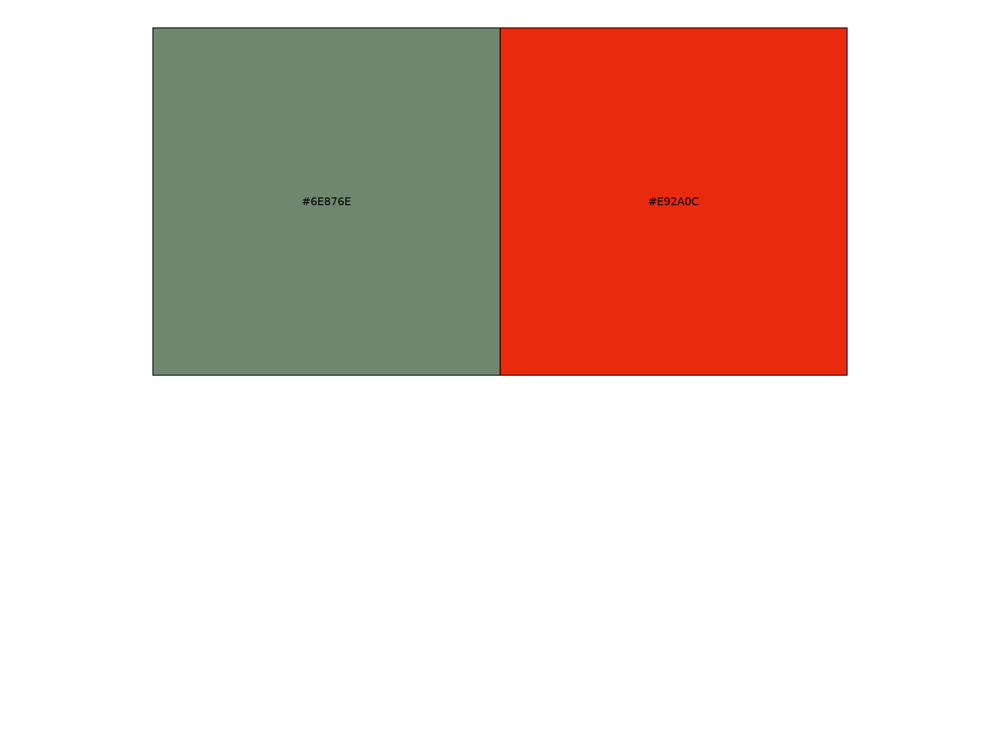

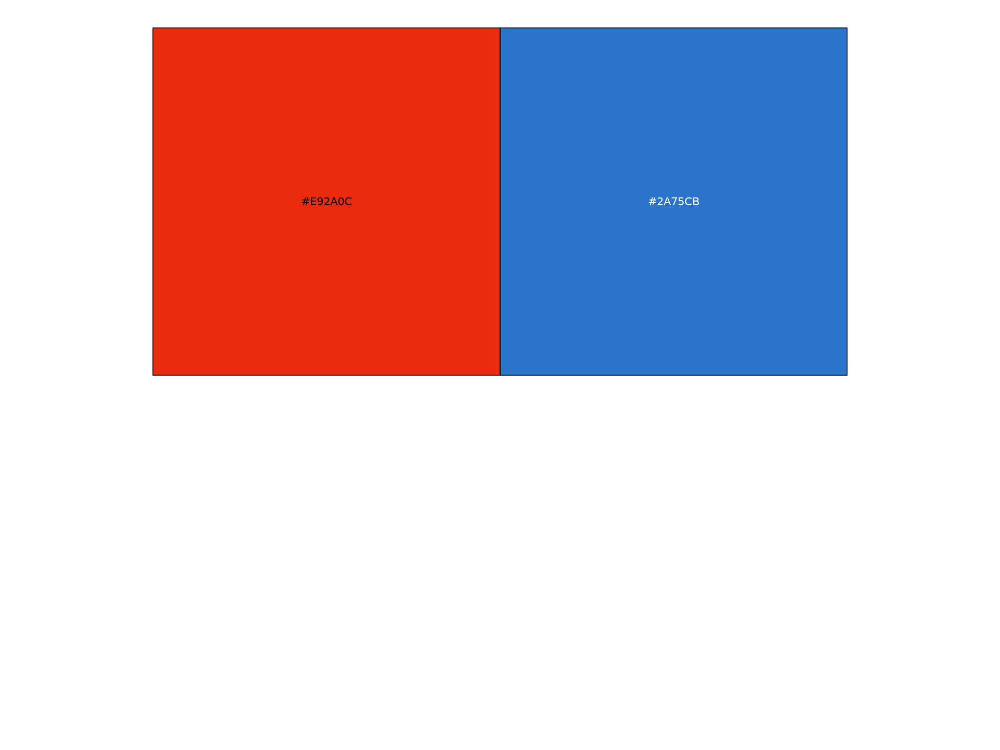

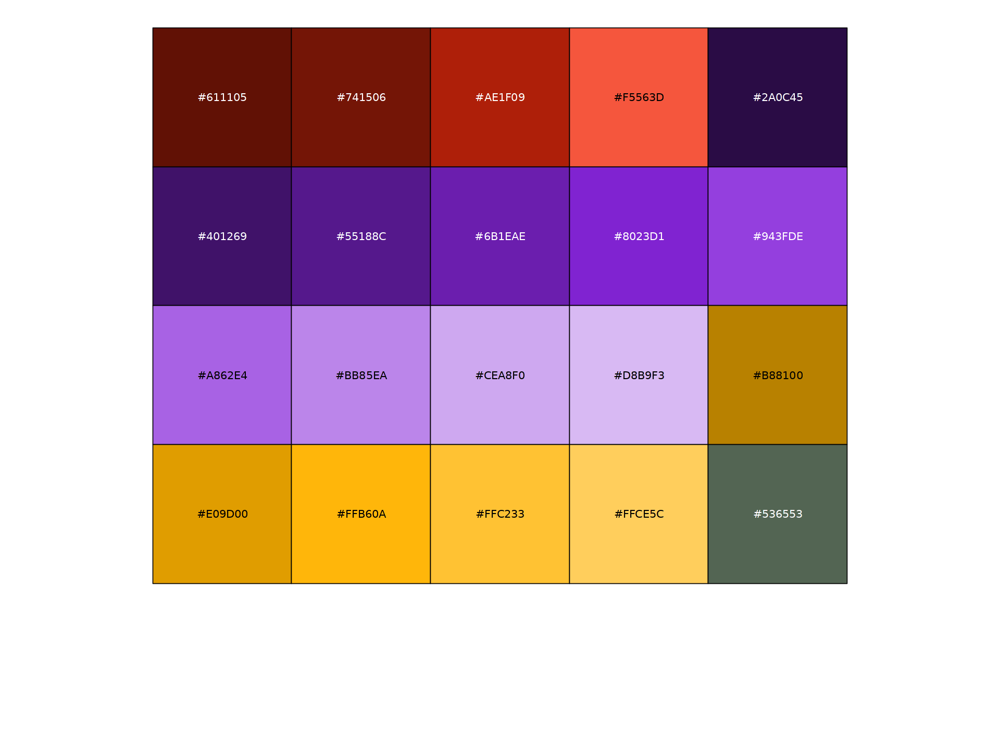

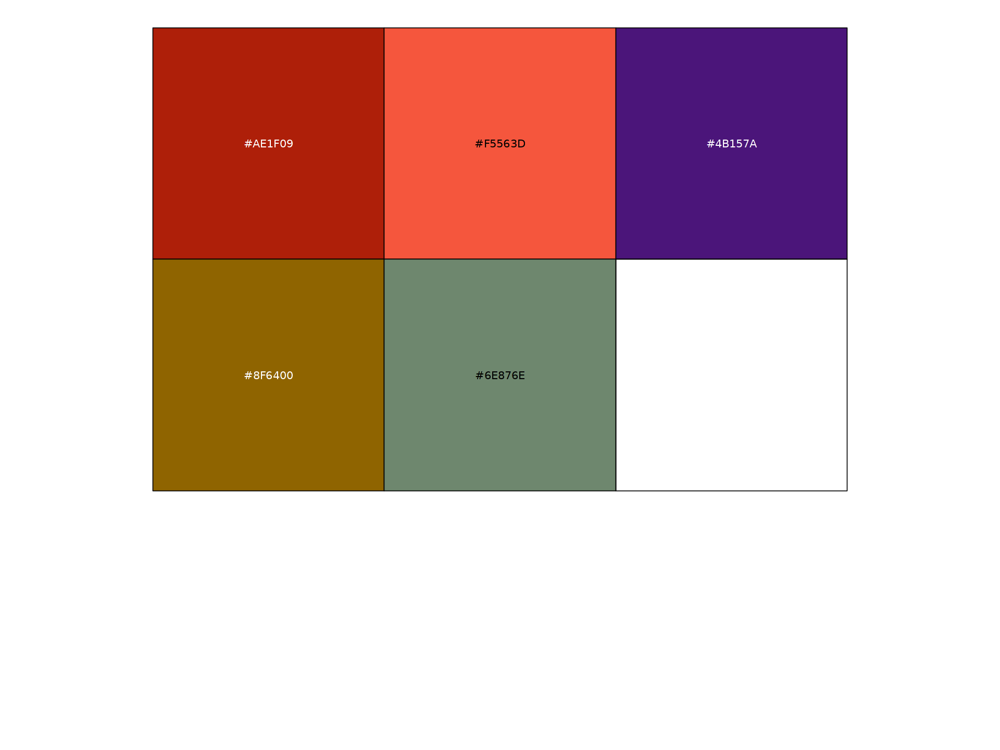

In [7]:
orig.ident_colors <- c("#2E382E", "#404F40", "#536553", "#657B65", "#789178", "#8FA38F", "#A5B6A5", "#D2DAD2", "#E9EDE9", 
                       "#7A5600", "#F5AB00", "#FFC233", "#FFD470", "#FFE7AD", "#FFF3D6",
                       "#AE1F09", "#E92A0C", "#F5563D", "#F88877", "#FDDDD8",
                       "#714947", "#97615E", "#B08482", "#C8A9A7", "#E0CECD", "#EFE7E6")
names(orig.ident_colors) <- c("EarlyCtrl2", "EarlyCtrl3", "EarlyCtrl4", "EarlyCtrlMale5", "EarlyCtrlFemale5", "PeakCtrl2", "PeakCtrl3", "LateCtrl2", "LateCtrl3",
                              "Early1", "EarlyFemale3", "EarlyMale3", "Early4", "EarlyMale5", "EarlyFemale5",
                              "Peak2", "Peak3", "PeakMale4", "PeakFemale4", "Peak5",
                              "Late1", "Late2", "Late3", "LateMale4", "LateFemale4", "Late5")

orig.ident_colors_contrast <- c("#97615E", "#E92A0C", "#F5AB00", "#6E876E", "#26C485", "#C16200", "#2A75CB", "#5B1865", "#E54F6D",
                                "#97615E", "#F5AB00", "#6E876E", "#26C485", "#C16200", "#2A75CB",
                                "#97615E", "#E92A0C", "#F5AB00", "#6E876E", "#26C485",
                                "#97615E", "#E92A0C", "#F5AB00", "#6E876E", "#26C485", "#C16200")
names(orig.ident_colors_contrast) <- c("EarlyCtrl2", "EarlyCtrl3", "EarlyCtrl4", "EarlyCtrlMale5", "EarlyCtrlFemale5", "PeakCtrl2", "PeakCtrl3", "LateCtrl2", "LateCtrl3",
                              "Early1", "EarlyFemale3", "EarlyMale3", "Early4", "EarlyMale5", "EarlyFemale5",
                              "Peak2", "Peak3", "PeakMale4", "PeakFemale4", "Peak5",
                              "Late1", "Late2", "Late3", "LateMale4", "LateFemale4", "Late5")

orig.ident_merge_colors <- c("#6E876E", "#F5AB00", "#E92A0C", "#97615E")
names(orig.ident_merge_colors) <- c("Ctrl", "Early", "Peak", "Late")

batch_colors <- c("#2A75CB", "#6E876E", "#F5AB00", "#E92A0C", "#97615E", "#98CE00", "#E54F6D")
names(batch_colors) <- c("B1", "B2", "B3", "B4", "B5", "B6", "B8")

model_colors <- c("#6E876E", "#E92A0C")
names(model_colors) <- c("Ctrl", "EAE")
show_col(model_colors)

duo_colors <- c("#E92A0C", "#2A75CB")
show_col(duo_colors)

sex_colors <- duo_colors
names(sex_colors) <- c("F", "M")

immune_colors <- c("#A9DFBF", "#FF000080")
names(immune_colors) <- c("NonImmune", "Immune")
#show_col(immune_colors)

immuneAll_colors <- c("lightgrey", "blue", "orange", "red")
names(immuneAll_colors) <- c("None", "RNA", "GenePromAcc", "Both")
#show_col(immuneAll_colors)

doublets_colors <- c("#A9DFBF", "#FF000080")
names(doublets_colors) <- c("Singlet", "Doublet")
#show_col(doublets_colors)

debris_colors <- duo_colors
names(debris_colors) <- c("Percoll", "Debris")

date_tissue_coll_colors <- scales::viridis_pal()(17)
names(date_tissue_coll_colors) <- c('2021_04_30','2021_05_03','2021_05_31','2021_09_30','2021_10_06','2021_11_26','2022_03_09','2022_03_10','2022_08_03','2022_08_24','2023_01_23','2023_02_15','2023_03_22','2023_06_15','2023_06_14','2022_05_12','2022_05_16')
#show_col(date_tissue_coll_colors)

date_exp_colors <- scales::viridis_pal()(7)
names(date_exp_colors) <- c('2021_04_20','2021_09_22','2021_11_17','2022_01_31','2022_07_18','2023_01_09','2023_06_05')
#show_col(date_exp_colors)

EAE_score_mean_colors <- scales::viridis_pal()(7)
names(EAE_score_mean_colors) <- c(0,0.5,2,2.25,2.33,2.5,3)
#show_col(EAE_score_mean_colors)

cellType_OL_colors <- c("#611105", "#741506", "#AE1F09", "#F5563D", "#2A0C45","#401269","#55188C","#6B1EAE","#8023D1","#943FDE","#A862E4","#BB85EA","#CEA8F0","#D8B9F3","#B88100","#E09D00","#FFB60A","#FFC233","#FFCE5C","#536553")
names(cellType_OL_colors) <- c("OPC-α", "OPC-β", "OPC-γ", "COP", "MOL56-α","MOL56-β","MOL56-γ","MOL56-δ","MOL56-ε","MOL56-ζ","MOL56-η","MOL56-θ","MOL56-ι","MOL56-κ","MOL2-α","MOL2-β","MOL2-γ","MOL2-δ","MOL2-ε","MOL1")
show_col(cellType_OL_colors)

cellType_OL_merge_colors <- c("#AE1F09","#F5563D","#4B157A","#8F6400", "#6E876E")
names(cellType_OL_merge_colors) <- c("OPC", "COP", "MOL56", "MOL2", "MOL1")
show_col(cellType_OL_merge_colors)

In [8]:
#Set up ATAC annotation
annotations <- GetGRangesFromEnsDb(ensdb = EnsDb.Mmusculus.v79, verbose =FALSE)
ucsc.levels <- str_replace(string=paste("chr",seqlevels(annotations),sep=""), pattern="chrMT", replacement="chrM")
seqlevels(annotations) <- ucsc.levels
genome(annotations) <- "mm10"

Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warn

## 2. Loading datasets

In [9]:
MORNAATACCOL <- readRDS(paste0(OS_path_outputs, "MORNAATACCOL.rds"))

## 3. Gene activity analysis

https://hbctraining.github.io/DGE_workshop/lessons/04_DGE_DESeq2_analysis.html#:~:text=The%20DESeq2%20dispersion%20estimates%20are,only%20based%20on%20their%20variance

https://support.bioconductor.org/p/9143599/

### 3.1 Differential Genes Activity at cellType level (DGA)

In [10]:
MORNAATACCOL_sce <- as.SingleCellExperiment(MORNAATACCOL, assay="GenePromAcc")

In [11]:
MORNAATACCOL_sce

class: SingleCellExperiment 
dim: 25910 120183 
metadata(0):
assays(2): counts logcounts
rownames(25910): Hnf4g n-R5s194 ... Csf2ra Gm21060
rowData names(0):
colnames(120183): AAACAGCCAAATATCC-14 AAACAGCCAAATTGCT-16 ...
  TTTGTTGGTTTGAGCA-28 TTTGTTGGTTTGGTTC-28
colData names(216): orig.ident nCount_RAW ... cellType_OL_merge ident
reducedDimNames(10): PCA UMAP_RNA ... UMAP_PEAKS_OL UMAP_BIMOD_OL
mainExpName: GenePromAcc
altExpNames(0):

In [12]:
MORNAATACCOL_sce <- prepSCE(MORNAATACCOL_sce, kid = "cellType_OL_merge", gid = "orig.ident_merge", sid = "orig.ident", drop = FALSE)

In [13]:
kids <- purrr::set_names(levels(MORNAATACCOL_sce$cluster_id))

# Total number of clusters
nk <- length(kids)

# Named vector of sample names
sids <- purrr::set_names(levels(MORNAATACCOL_sce$sample_id))

# Total number of samples 
ns <- length(sids)

In [14]:
kids
sids

OPC     COP   MOL56    MOL2    MOL1 
  "OPC"   "COP" "MOL56"  "MOL2"  "MOL1"

EarlyCtrl2         EarlyCtrl3         EarlyCtrl4     EarlyCtrlMale5 
      "EarlyCtrl2"       "EarlyCtrl3"       "EarlyCtrl4"   "EarlyCtrlMale5" 
  EarlyCtrlFemale5          PeakCtrl2          PeakCtrl3          LateCtrl2 
"EarlyCtrlFemale5"        "PeakCtrl2"        "PeakCtrl3"        "LateCtrl2" 
         LateCtrl3             Early1       EarlyFemale3         EarlyMale3 
       "LateCtrl3"           "Early1"     "EarlyFemale3"       "EarlyMale3" 
            Early4         EarlyMale5       EarlyFemale5              Peak2 
          "Early4"       "EarlyMale5"     "EarlyFemale5"            "Peak2" 
             Peak3          PeakMale4        PeakFemale4              Peak5 
           "Peak3"        "PeakMale4"      "PeakFemale4"            "Peak5" 
             Late1              Late2              Late3          LateMale4 
           "Late1"            "Late2"            "Late3"        "LateMale4" 
       LateFemale4              Late5 
     "LateFemale4"            "Late5"

In [15]:
## Determine the number of cells per sample
table(MORNAATACCOL_sce$sample_id)

## Turn named vector into a numeric vector of number of cells per sample
n_cells <- as.numeric(table(MORNAATACCOL_sce$sample_id))

## Determine how to reoder the samples (rows) of the metadata to match the order of sample names in sids vector
m <- match(sids, MORNAATACCOL_sce$sample_id)

## Create the sample level metadata by combining the reordered metadata with the number of cells corresponding to each sample.
ei <- data.frame(colData(MORNAATACCOL_sce)[m, ], n_cells, row.names = NULL) %>% select(-"cluster_id")
ei


      EarlyCtrl2       EarlyCtrl3       EarlyCtrl4   EarlyCtrlMale5 
             338             3109             6655             7965 
EarlyCtrlFemale5        PeakCtrl2        PeakCtrl3        LateCtrl2 
            7904             2703             1812             7390 
       LateCtrl3           Early1     EarlyFemale3       EarlyMale3 
            5417             3609             3168             3398 
          Early4       EarlyMale5     EarlyFemale5            Peak2 
            1243            10205             9314             1473 
           Peak3        PeakMale4      PeakFemale4            Peak5 
            3083             3261             3730             3701 
           Late1            Late2            Late3        LateMale4 
            4445             1467             3928             4855 
     LateFemale4            Late5 
            9849             6161 

sample_id,group_id,nCount_RAW,nFeature_RAW,nCount_RNA,nFeature_RNA,nCount_ATAC,nFeature_ATAC,batch,model,debrisRemoval,date_tissue_collection,date_experiment,nbMouse,EAE_score_mean,frequency_count,mononucleosomal,nucleosome_free,reads_count,percent.mt,log10GenesUMI,mitoRatio,S.Score,G2M.Score,Phase,CC.Difference,nucleosome_signal,nucleosome_percentile,TSS.enrichment,TSS.percentile,nCount_peaks,nFeature_peaks,FRiP,nCount_GenePromAcc,nFeature_GenePromAcc,pANN,DF.classifications,pct_chrY,pct_chrX,Xist_score,Sex_predictions,Sex_predictions_F,Sex_predictions_M,Sex,snn_RNA_res.1,seurat_clusters_RNA,snn_peaks_res.0.4,seurat_clusters_peaks,RNA.weight,peaks.weight,⋯,zscore_NaiveGenePromAcc.reg_cyto_prod,pvalue_NaiveGenePromAcc.reg_cyto_prod,ImmuneGenePromAcc.reg_cyto_prod,ImmuneScoreGenePromAcc.Tcell_cd4,ImmuneScoreScaledGenePromAcc.Tcell_cd4,zscore_NaiveGenePromAcc.Tcell_cd4,pvalue_NaiveGenePromAcc.Tcell_cd4,ImmuneGenePromAcc.Tcell_cd4,ImmuneScoreGenePromAcc.Tcell_cd8,ImmuneScoreScaledGenePromAcc.Tcell_cd8,zscore_NaiveGenePromAcc.Tcell_cd8,pvalue_NaiveGenePromAcc.Tcell_cd8,ImmuneGenePromAcc.Tcell_cd8,ImmuneAll,snn_RNA_OL_res.2.2,seurat_clusters_RNA_OL,snn_peaks_OL_res.0.8,seurat_clusters_peaks_OL,RNA_OL.weight,peaks_OL.weight,wsnn_OL_res.3.6,seurat_clusters_BiMod_OL,cellTypeOLFalcao2018,cellTypeOLFalcao2018_prediction.score.COP,cellTypeOLFalcao2018_prediction.score.OPC1,cellTypeOLFalcao2018_prediction.score.MOL5_6_Cntrl_A,cellTypeOLFalcao2018_prediction.score.MOL5_6_Cntrl_B,cellTypeOLFalcao2018_prediction.score.OPC2,cellTypeOLFalcao2018_prediction.score.OPC_Cycling,cellTypeOLFalcao2018_prediction.score.MOL5_6_EAE_B,cellTypeOLFalcao2018_prediction.score.NFOL,cellTypeOLFalcao2018_prediction.score.MOL2_Cntrl_A,cellTypeOLFalcao2018_prediction.score.MOL3_EAE,cellTypeOLFalcao2018_prediction.score.MOL5_6_EAE_A,cellTypeOLFalcao2018_prediction.score.OPC3,cellTypeOLFalcao2018_prediction.score.MOL5_6_EAE_C,cellTypeOLFalcao2018_prediction.score.MOL1_2_EAE,cellTypeOL_mergeFalcao2018,cellTypeOL_mergeFalcao2018_prediction.score.COP,cellTypeOL_mergeFalcao2018_prediction.score.OPC,cellTypeOL_mergeFalcao2018_prediction.score.MOL5_6,cellTypeOL_mergeFalcao2018_prediction.score.OPC_Cycling,cellTypeOL_mergeFalcao2018_prediction.score.NFOL,cellTypeOL_mergeFalcao2018_prediction.score.MOL2,cellTypeOL_mergeFalcao2018_prediction.score.MOL3,cellTypeOL_mergeFalcao2018_prediction.score.MOL1_2,seurat_clusters_BiMod_OL_aggr,cellType_OL,ident,n_cells
<fct>,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<fct>,<fct>,<fct>,<fct>,<fct>,<chr>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<fct>,<fct>,<fct>,<fct>,<dbl>,<dbl>,<fct>,<fct>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<dbl>
EarlyCtrl2,Ctrl,2824,1526,2823,1526,7136,3360,B3,Ctrl,Percoll,2021_09_30,2021_09_22,2,0,5050,1599,2793,19296,2.798441,0.9225793,0.02798441,-0.041399417,-0.0768564026,G1,0.035456986,0.6206483,0.38,7.873026,0.75,3851,3291,0.7625743,4386,3083,0.00000000,Singlet,0.0003542331,0.05348920,-1.075,M,0.0004,0.9996,M,2,2,7,7,2.183693e-01,0.7816307,⋯,-1.2925110,0.90190987,NonImmune,-0.012424600,0.3062385,-0.21218539,0.58401880,NonImmune,0.112898601,0.5195749,1.8409386,0.03281528,Immune,None,4,4,10,10,3.224484e-03,0.9967755,14,14,MOL5_6_Cntrl_A,0.0000000000,0.0000000,0.909744325,0.055530913,0.0000000,0.00000000,0.000000000,0.0000000,0.00000000,0.03472476,0.000000000,0.00000000,0.000000000,0.00000000,MOL5_6,0.0000000000,0.00000000,0.9652752,0.00000000,0.0000000,0.00000000,0.03472476,0.00000000,7,MOL56-ζ,14,338
EarlyCtrl3,Ctrl,2460,1337,2456,1337,2535,1295,B4,Ctrl,Percoll,2021_11_26,2021_11_17,2,0,1831,590,1002,9182,3.949511,0.9221005,0.03949511

In [16]:
## Remove lowly accessible features which have less than 10 cells with any counts
MORNAATACCOL_sce <- MORNAATACCOL_sce[rowSums(counts(MORNAATACCOL_sce) > 1) >= 10, ]

In [17]:
# Aggregate the counts per sample_id and cluster_id

# Subset metadata to only include the cluster and sample IDs to aggregate across
groups <- colData(MORNAATACCOL_sce)[, c("cluster_id", "sample_id")]

# Aggregate across cluster-sample groups
pb <- aggregate.Matrix(t(counts(MORNAATACCOL_sce)), groupings = groups, fun = "sum") 

In [18]:
splitf <- sapply(stringr::str_split(rownames(pb), pattern = "_", n = 2), `[`, 1)

In [19]:
pb <- split.data.frame(pb, factor(splitf)) %>% lapply(function(u) set_colnames(t(u), stringr::str_extract(rownames(u), "(?<=_)[:alnum:]+")))

class(pb)

# Explore the different components of list
str(pb)

[1] "list"

List of 5
 $ COP  :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. ..@ i       : int [1:303317] 0 3 5 6 7 8 10 11 12 13 ...
  .. ..@ p       : int [1:22] 0 16877 21290 40604 57368 74393 94555 112727 117053 133674 ...
  .. ..@ Dim     : int [1:2] 21788 21
  .. ..@ Dimnames:List of 2
  .. .. ..$ : chr [1:21788] "Hnf4g" "1110015O18Rik" "Gm17308" "Zfhx4" ...
  .. .. ..$ : chr [1:21] "Early4" "EarlyCtrl3" "EarlyCtrl4" "EarlyCtrlFemale5" ...
  .. ..@ x       : num [1:303317] 1 15 16 8 5 2 1 4 23 2 ...
  .. ..@ factors : list()
 $ MOL1 :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. ..@ i       : int [1:234739] 2 3 5 7 12 14 15 17 19 20 ...
  .. ..@ p       : int [1:20] 0 9639 28498 38519 51399 68736 77874 80411 83526 96027 ...
  .. ..@ Dim     : int [1:2] 21788 19
  .. ..@ Dimnames:List of 2
  .. .. ..$ : chr [1:21788] "Hnf4g" "1110015O18Rik" "Gm17308" "Zfhx4" ...
  .. .. ..$ : chr [1:19] "Early4" "EarlyCtrl3" "EarlyCtrl4" "EarlyCtrlFemale5" ...
  .. ..@ x       

In [20]:
options(width = 100)
table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$group_id)

       
         Ctrl Early  Peak  Late
  OPC     642   771   694  1388
  COP      92   158   111   641
  MOL56 33222 26638  5644 13317
  MOL2   9234  3362  8792 14935
  MOL1    103     8     7   424

In [21]:
options(width = 100)
table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$sample_id)

       
        EarlyCtrl2 EarlyCtrl3 EarlyCtrl4 EarlyCtrlMale5 EarlyCtrlFemale5 PeakCtrl2 PeakCtrl3
  OPC            1          2        325            135              119        10         4
  COP            0          1         49             13               22         2         0
  MOL56        277       2792       4360           5665             5207      2329      1614
  MOL2          60        239       1919           2130             2553       362       194
  MOL1           0         75          2             22                3         0         0
       
        LateCtrl2 LateCtrl3 Early1 EarlyFemale3 EarlyMale3 Early4 EarlyMale5 EarlyFemale5 Peak2
  OPC          19        27     19            1          6     89        229          427    21
  COP           2         3      0            0          0     14         29          115     1
  MOL56      6330      4648   3250         2891       3228    977       9135         7157   800
  MOL2       1038       739    340        

In [22]:
# Get sample names for each of the cell type clusters

# prep. data.frame for plotting
get_sample_ids <- function(x){pb[[x]] %>% colnames()}

de_samples <- purrr::map(1:length(kids), get_sample_ids) %>% unlist()

In [23]:
samples_list <- purrr::map(1:length(kids), get_sample_ids)

get_cluster_ids <- function(x){rep(names(pb)[x],each = length(samples_list[[x]]))}

de_cluster_ids <- purrr::map(1:length(kids), get_cluster_ids) %>% unlist()

In [24]:
combinaison_debris_sample <- unique(paste(colData(MORNAATACCOL_sce)$sample_id, colData(MORNAATACCOL_sce)$debrisRemoval, sep="_"))

In [25]:
de_debris_ids <- mapvalues(de_samples, 
from=unlist(lapply(strsplit(combinaison_debris_sample, "_"), function(x){x[1]})),
to=unlist(lapply(strsplit(combinaison_debris_sample, "_"), function(x){x[2]})))

In [26]:
gg_df <- data.frame(cluster_id = de_cluster_ids, sample_id = de_samples, debris_id=de_debris_ids)

gg_df <- left_join(gg_df, ei[, c("sample_id", "group_id")]) 

metadata <- gg_df %>% dplyr::select(cluster_id, sample_id, group_id, debris_id) 

Joining with `by = join_by(sample_id)`


In [27]:
levels(metadata$cluster_id) <- unique(metadata$cluster_id)

In [28]:
# Generate vector of cluster IDs
clusters <- levels(metadata$cluster_id)
clusters

[1] "COP"   "MOL1"  "MOL2"  "MOL56" "OPC"

In [29]:
HVGs.list <- list()

#### 3.1.1 MOL56

In [30]:
cluster_choice <- "MOL56"

In [31]:
HVGs.list[[cluster_choice]] <- list()

In [32]:
table_sample_low <- table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$sample_id)[cluster_choice,][table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$sample_id)[cluster_choice,] <= 5]
table_sample_low

sample_keep <- names(orig.ident_colors)[!names(orig.ident_colors) %in% names(table_sample_low)]

named integer(0)

In [33]:
table_group_low <-table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$group_id)[cluster_choice,][table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$group_id)[cluster_choice,] <= 30]
table_group_low

group_keep <- names(orig.ident_merge_colors)[!names(orig.ident_merge_colors) %in% names(table_group_low)]

named integer(0)

In [34]:
cluster_metadata <- metadata[which(metadata$cluster_id == cluster_choice), ]

# Assign the rownames of the metadata to be the sample IDs
rownames(cluster_metadata) <- cluster_metadata$sample_id

In [36]:
#Remove sample and timepoint with low counts (sample<=5, timepoint<=30)
cluster_metadata <- cluster_metadata[(cluster_metadata$sample_id %in% sample_keep & cluster_metadata$group_id %in% group_keep),]

new_group_levels <- levels(cluster_metadata$group_id)[levels(cluster_metadata$group_id) %in% group_keep]
cluster_metadata$group_id <- droplevels(cluster_metadata$group_id)
levels(cluster_metadata$group_id) <- new_group_levels

In [37]:
# Subset the counts to only this cluster
counts <- pb[[cluster_choice]]

cluster_counts <- data.frame(counts[, which(colnames(counts) %in% rownames(cluster_metadata))])

# Check that all of the row names of the metadata are the same and in the same order as the column names of the counts in order to use as input to DESeq2
all(rownames(cluster_metadata) == colnames(cluster_counts))

[1] TRUE

In [38]:
dds <- DESeqDataSetFromMatrix(cluster_counts, colData = cluster_metadata, design = ~ group_id + debris_id)

converting counts to integer mode

Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


In [39]:
# Transform counts for data visualization
rld <- rlog(dds, blind=TRUE)

using ntop=500 top features by variance



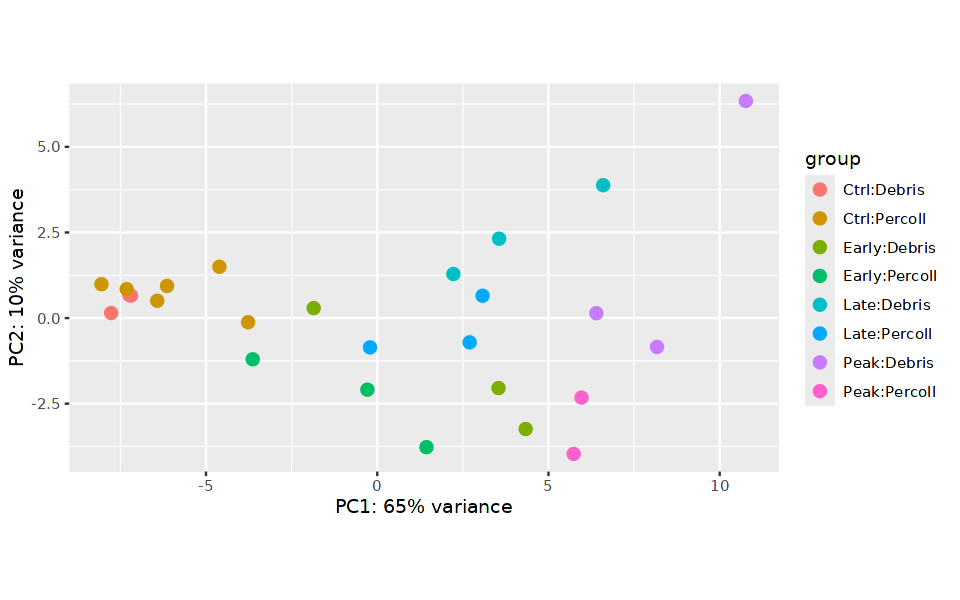

In [40]:
# Plot PCA
options(repr.plot.width=8, repr.plot.height=5)
DESeq2::plotPCA(rld, intgroup = c("group_id", "debris_id"))

In [41]:
# Extract the rlog matrix from the object and compute pairwise correlation values
rld_mat <- assay(rld)
rld_cor <- cor(rld_mat)

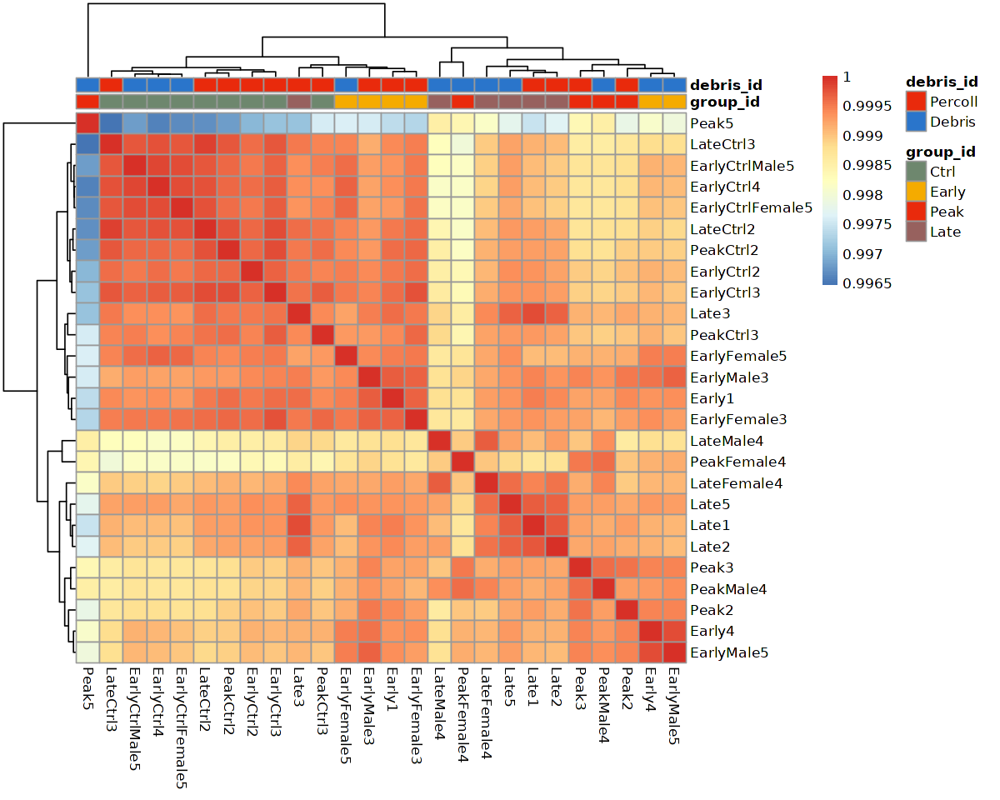

In [42]:
# Plot heatmap
options(repr.plot.width=10, repr.plot.height=8)
pheatmap(rld_cor, annotation = cluster_metadata[, c("group_id","debris_id"), drop=F], annotation_colors = list(group_id=orig.ident_merge_colors, debris_id=debris_colors))

In [43]:
# Run DESeq2 differential expression analysis
dds <- DESeq(dds)

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



In [44]:
libsize = data.frame(x=sizeFactors(dds), y=colSums(assay(dds)))

`geom_smooth()` using formula = 'y ~ x'


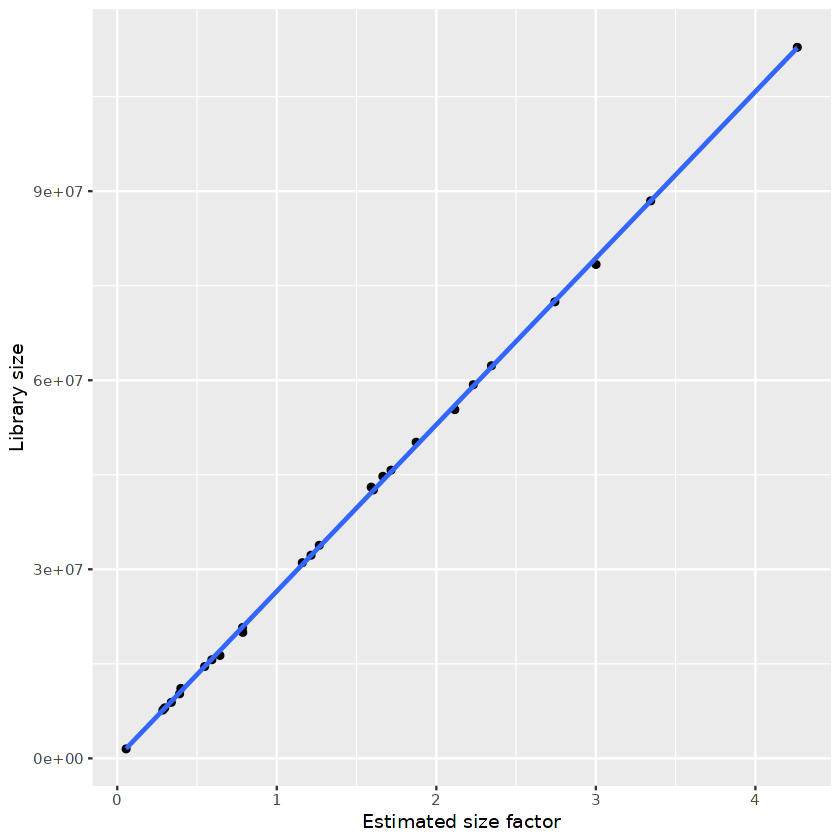

In [45]:
options(repr.plot.width=7, repr.plot.height=7)
ggplot(data=libsize, aes(x=x, y=y)) + geom_point() + geom_smooth(method="lm") + xlab("Estimated size factor") + ylab("Library size")

In [46]:
data.frame(colData(dds))

,cluster_id,sample_id,group_id,debris_id,sizeFactor
,<chr>,<chr>,<fct>,<fct>,<dbl>
Early1,MOL56,Early1,Early,Percoll,1.26633062
Early4,MOL56,Early4,Early,Debris,0.54799115
EarlyCtrl2,MOL56,EarlyCtrl2,Ctrl,Percoll,0.05572153
EarlyCtrl3,MOL56,EarlyCtrl3,Ctrl,Percoll,1.21451725
EarlyCtrl4,MOL56,EarlyCtrl4,Ctrl,Debris,2.23179374
EarlyCtrlFemale5,MOL56,EarlyCtrlFemale5,Ctrl,Debris,2.11578450
EarlyCtrlMale5,MOL56,EarlyCtrlMale5,Ctrl,Debris,2.74305430
EarlyFemale3,MOL56,EarlyFemale3,Early,Percoll,1.71598192
EarlyFemale5,MOL56,EarlyFemale5,Early,Debris,3.00101114


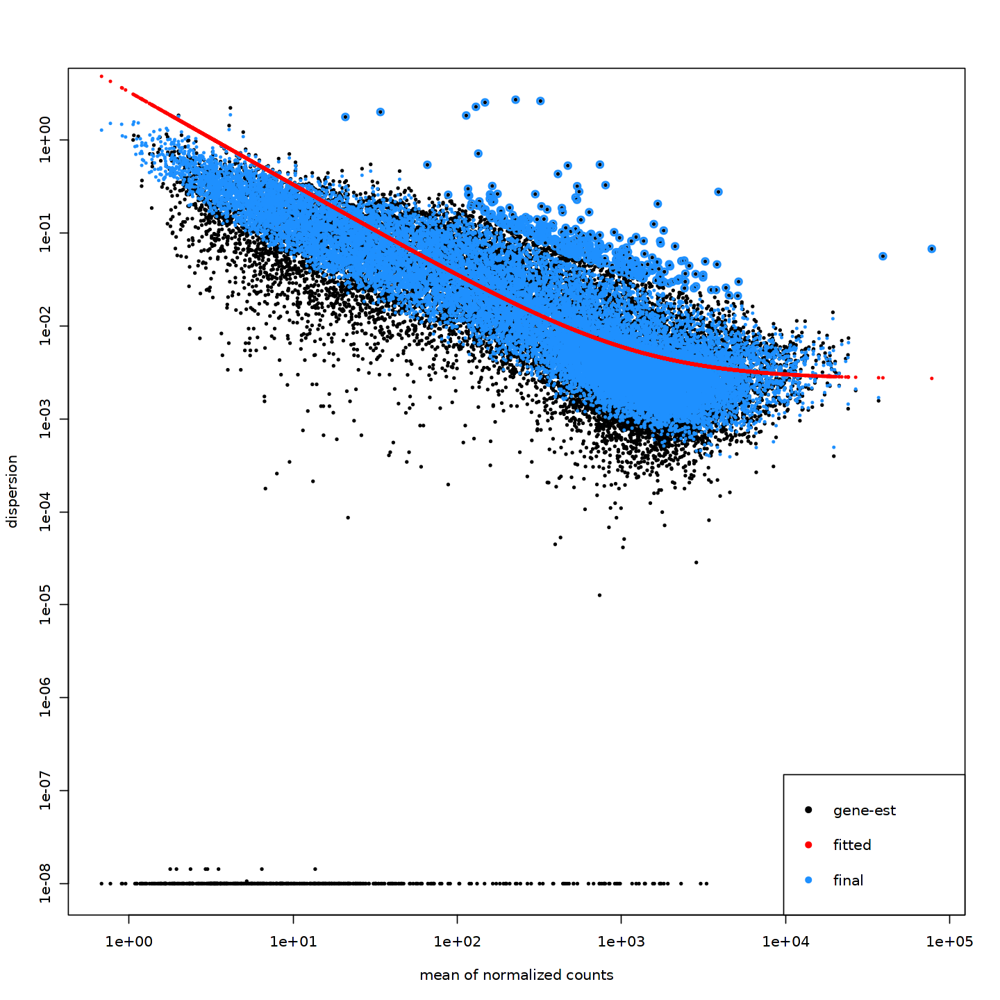

In [47]:
# Plot dispersion estimates
options(repr.plot.width=12, repr.plot.height=12)
plotDispEsts(dds)

##### 3.1.1.1 Early/Ctrl

In [48]:
condition1 = "Early"
condition2 = "Ctrl"

In [49]:
contrast <- c("group_id", condition1, condition2)

# resultsNames(dds)
res <- results(dds, contrast = contrast, alpha = 0.05)

In [50]:
summary(res)


out of 21788 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 1818, 8.3%
LFC < 0 (down)     : 1251, 5.7%
outliers [1]       : 8, 0.037%
low counts [2]     : 2112, 9.7%
(mean count < 11)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



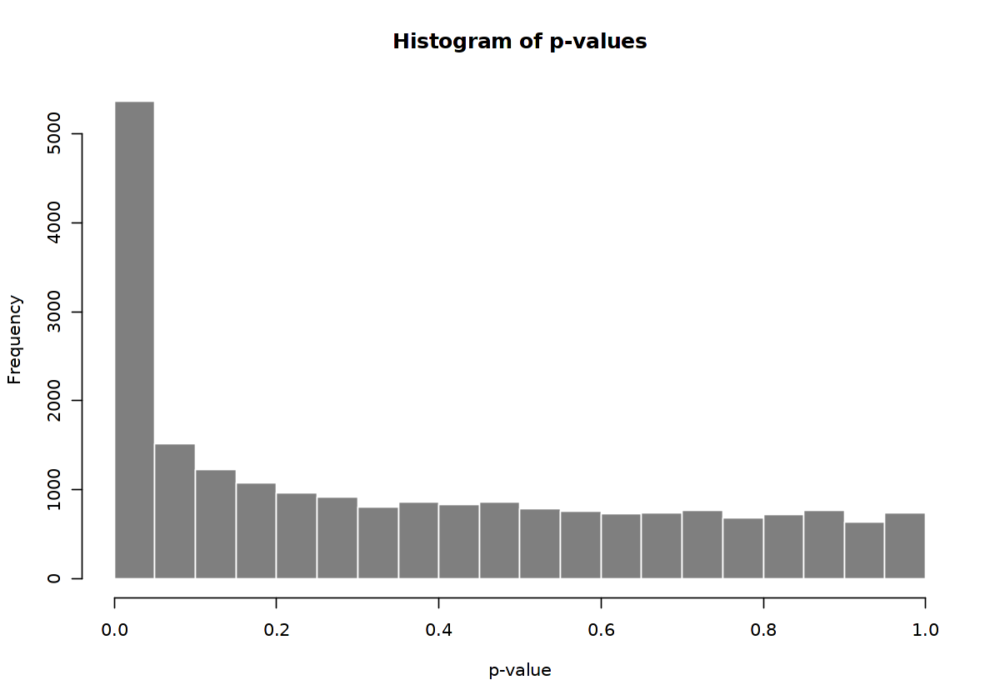

In [51]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$pvalue, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of p-values", xlab="p-value")

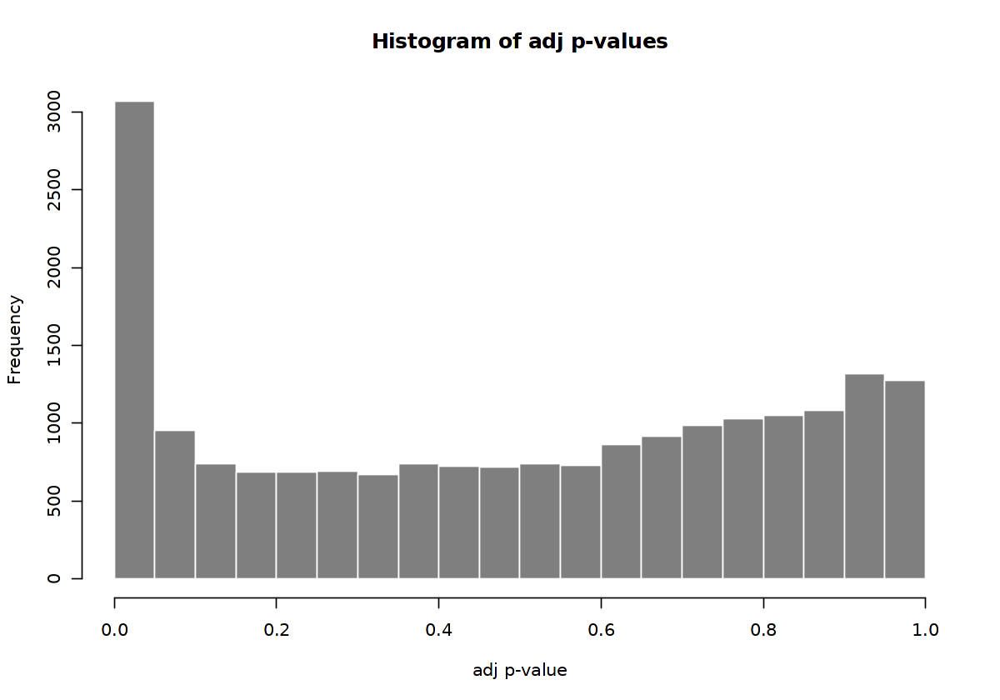

In [52]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$padj, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of adj p-values", xlab="adj p-value")

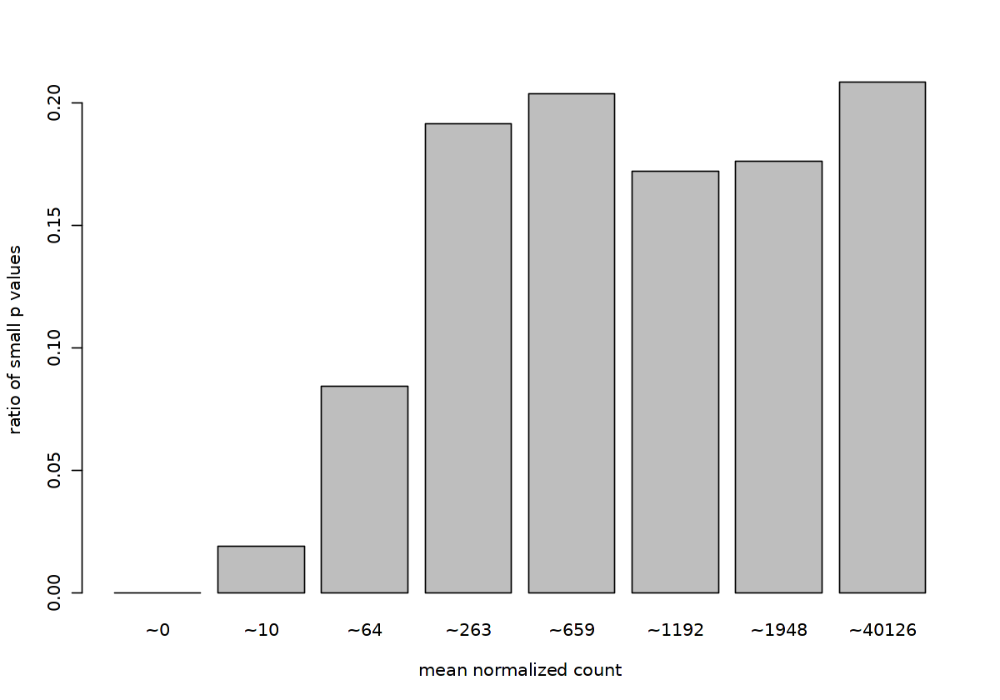

In [53]:
options(repr.plot.width=10, repr.plot.height=7)
qs <- c(0, quantile(res$baseMean[res$baseMean > 0], 0:7/7))
# cut the genes into the bins
bins <- cut(res$baseMean, qs)
# rename the levels of the bins using the middle point
levels(bins) <- paste0("~",round(.5*qs[-1] + .5*qs[-length(qs)]))
# calculate the ratio of $p$ values less than .01 for each bin
ratios <- tapply(res$pvalue, bins, function(p) mean(p < .01, na.rm=TRUE))
# plot these ratios
barplot(ratios, xlab="mean normalized count", ylab="ratio of small p values")

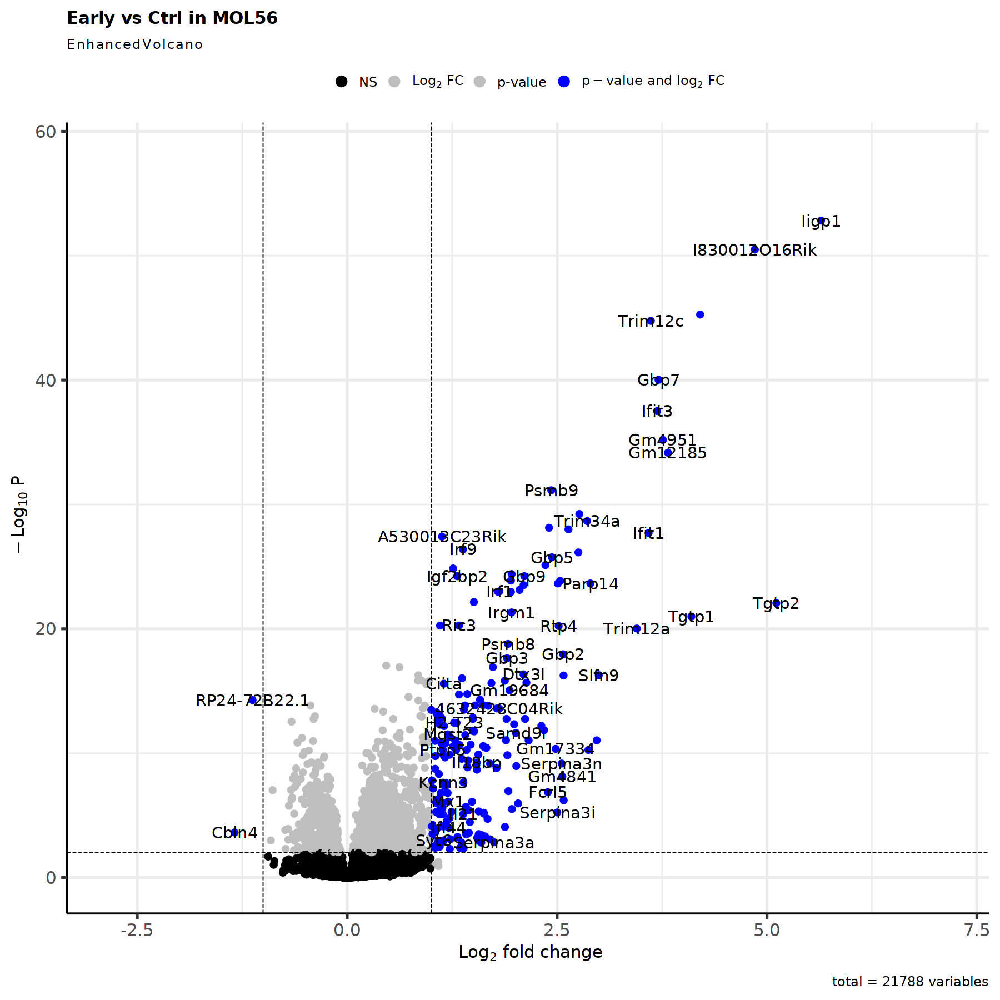

In [54]:
options(repr.plot.width=15, repr.plot.height=15)
#padj<0.001
EnhancedVolcano(res,
    lab = rownames(res),
    x = 'log2FoldChange',
    y = 'padj',
    title = paste0(condition1,' vs ',condition2,' in ', cluster_choice),
    pCutoff = 0.01,
    FCcutoff = 1,
    pointSize = 3.0,
    labSize = 6.0,
    col=c('black', 'grey', 'grey', 'blue'),
    colAlpha = 1)

In [55]:
res <- res[complete.cases(res$padj),]

In [56]:
res_filtered <- res[(res$padj < 0.01 & abs(res$log2FoldChange) > 1 & res$baseMean > 1),]

In [57]:
res_filtered[order(abs(res_filtered$log2FoldChange), decreasing=TRUE),]

log2 fold change (MLE): group_id Early vs Ctrl 
Wald test p-value: group id Early vs Ctrl 
DataFrame with 197 rows and 6 columns
               baseMean log2FoldChange     lfcSE      stat      pvalue        padj
              <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
Iigp1          320.4834        5.64409  0.352054   16.0319 7.65337e-58 1.50527e-53
Tgtp2           81.6742        5.11107  0.489128   10.4493 1.47546e-25 8.53510e-23
I830012O16Rik  238.5980        4.85498  0.310193   15.6515 3.24565e-55 3.19178e-51
Ifi47          324.5664        4.20366  0.283285   14.8390 8.19897e-50 5.37525e-46
Tgtp1           60.3681        4.09949  0.401743   10.2043 1.89772e-24 1.03679e-21
...                 ...            ...       ...       ...         ...         ...
B530045E10Rik  117.4878        1.01630  0.233275   4.35668 1.32051e-05 3.01647e-04
Magee2          28.4687        1.01406  0.212900   4.76307 1.90669e-06 5.63921e-05
St8sia5        330.0139        1.01096  0

In [58]:
nrow(res_filtered)

[1] 197

In [59]:
HVGs.list[[cluster_choice]][[paste0(condition1,"_",condition2)]] <- rownames(res_filtered)

##### 3.1.1.2 Peak/Early

In [60]:
condition1 = "Peak"
condition2 = "Early"

In [61]:
contrast <- c("group_id", condition1, condition2)

# resultsNames(dds)
res <- results(dds, contrast = contrast, alpha = 0.05)

In [62]:
summary(res)


out of 21788 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 3468, 16%
LFC < 0 (down)     : 2396, 11%
outliers [1]       : 8, 0.037%
low counts [2]     : 423, 1.9%
(mean count < 3)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



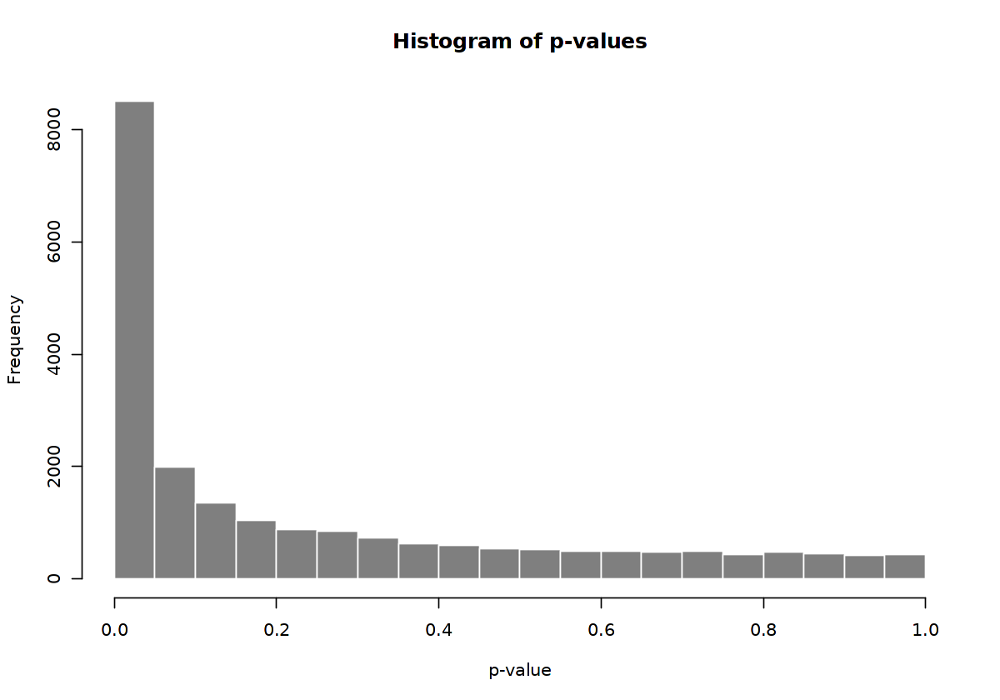

In [63]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$pvalue, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of p-values", xlab="p-value")

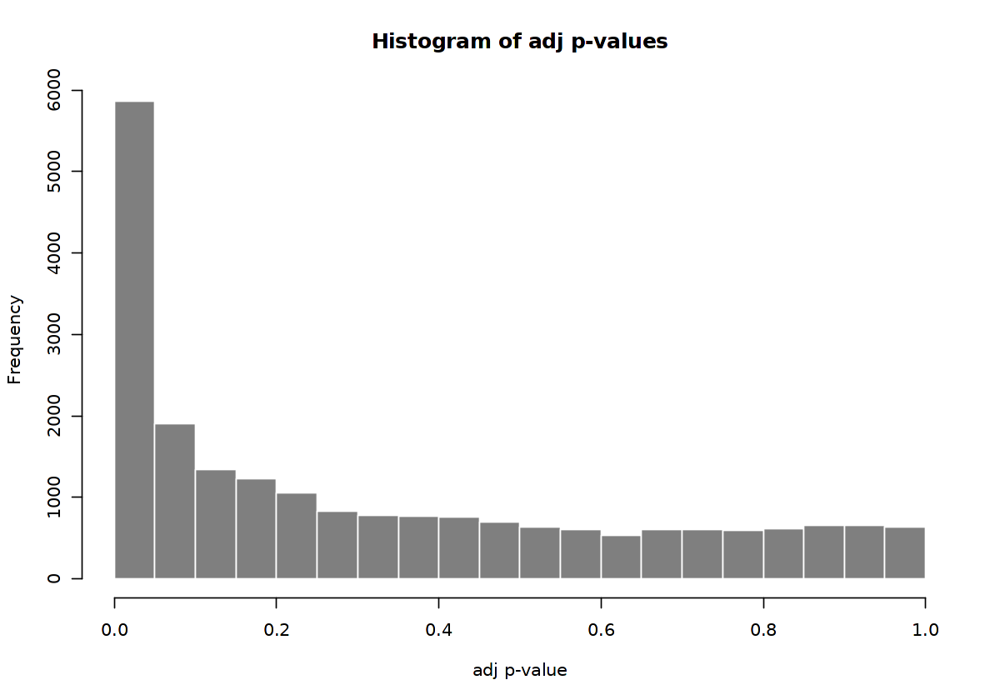

In [64]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$padj, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of adj p-values", xlab="adj p-value")

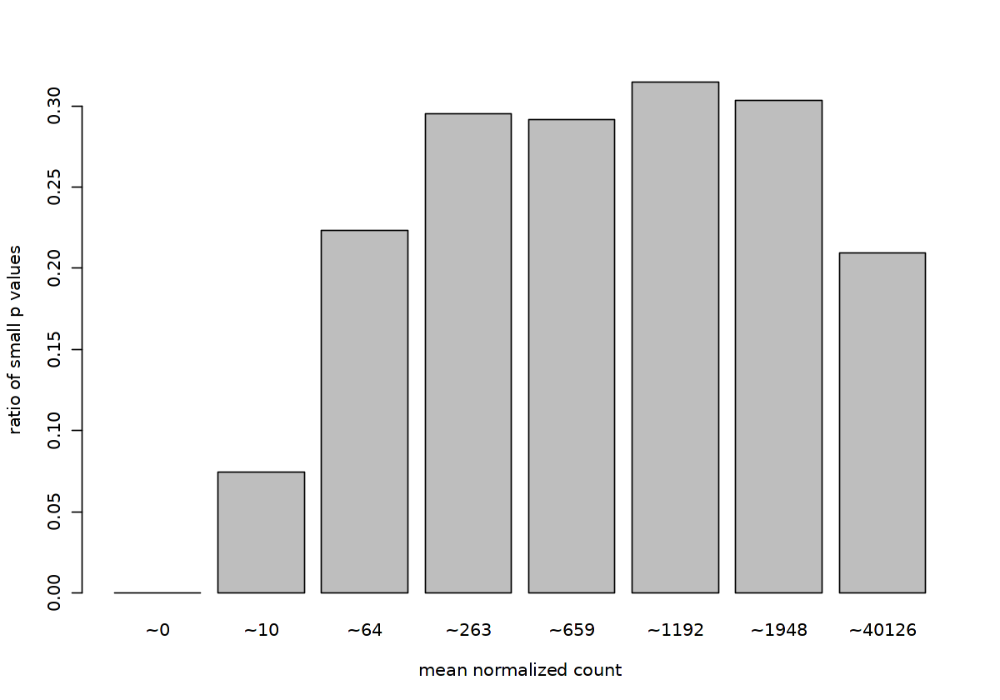

In [65]:
options(repr.plot.width=10, repr.plot.height=7)
qs <- c(0, quantile(res$baseMean[res$baseMean > 0], 0:7/7))
# cut the genes into the bins
bins <- cut(res$baseMean, qs)
# rename the levels of the bins using the middle point
levels(bins) <- paste0("~",round(.5*qs[-1] + .5*qs[-length(qs)]))
# calculate the ratio of $p$ values less than .01 for each bin
ratios <- tapply(res$pvalue, bins, function(p) mean(p < .01, na.rm=TRUE))
# plot these ratios
barplot(ratios, xlab="mean normalized count", ylab="ratio of small p values")

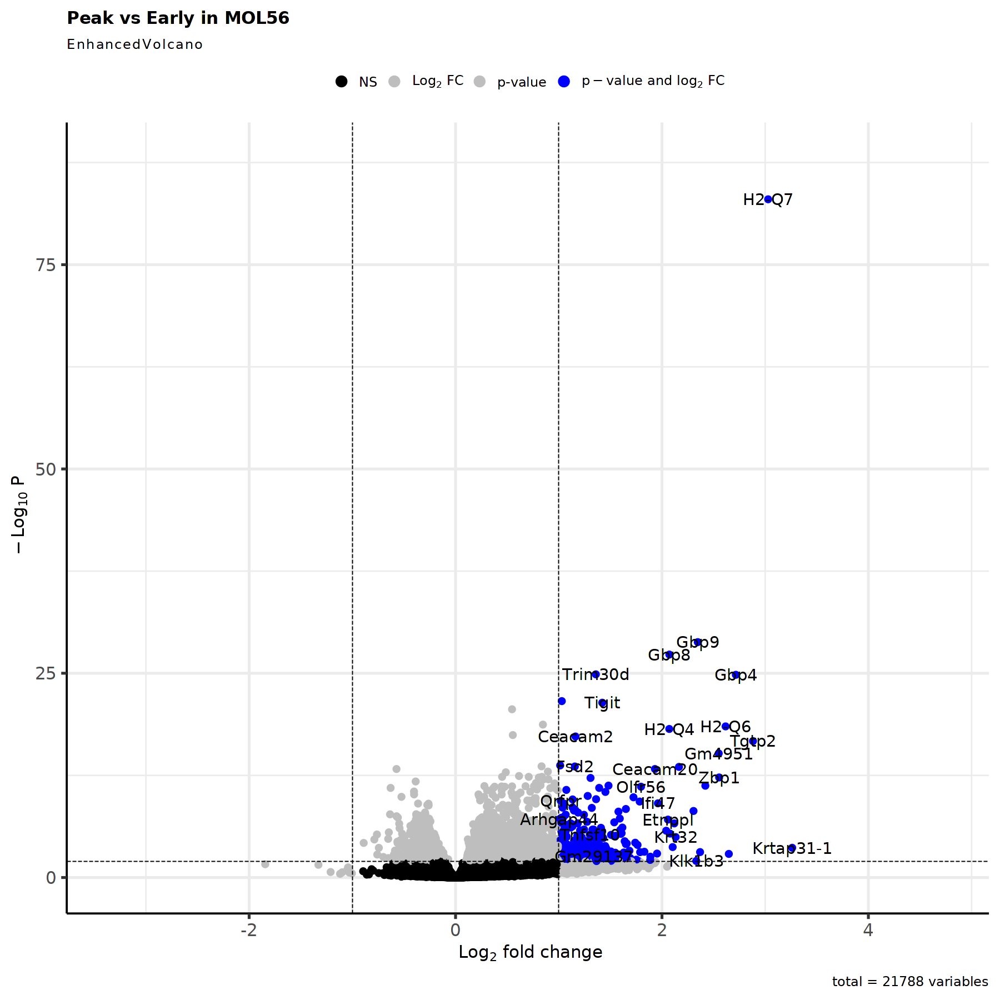

In [66]:
options(repr.plot.width=15, repr.plot.height=15)
#padj<0.001
EnhancedVolcano(res,
    lab = rownames(res),
    x = 'log2FoldChange',
    y = 'padj',
    title = paste0(condition1,' vs ',condition2,' in ', cluster_choice),
    pCutoff = 0.01,
    FCcutoff = 1,
    pointSize = 3.0,
    labSize = 6.0,
    col=c('black', 'grey', 'grey', 'blue'),
    colAlpha = 1)

In [67]:
res <- res[complete.cases(res$padj),]

In [68]:
res_filtered <- res[(res$padj < 0.01 & abs(res$log2FoldChange) > 1 & res$baseMean > 1),]

In [69]:
res_filtered[order(abs(res_filtered$log2FoldChange), decreasing=TRUE),]

log2 fold change (MLE): group_id Peak vs Early 
Wald test p-value: group_id Peak vs Early 
DataFrame with 293 rows and 6 columns
               baseMean log2FoldChange     lfcSE      stat      pvalue        padj
              <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
Krtap31-1       3.80386        3.26199  0.742096   4.39565 1.10440e-05 2.29890e-04
H2-Q7         215.96039        3.02877  0.152251  19.89328 4.65341e-88 9.93829e-84
Tgtp2          81.67416        2.88202  0.309685   9.30631 1.32345e-20 2.01892e-17
Gbp4           76.83045        2.71601  0.242283  11.21007 3.63905e-29 1.55438e-25
Gm17182         5.77050        2.64788  0.678864   3.90046 9.60088e-05 1.28879e-03
...                 ...            ...       ...       ...         ...         ...
Psmb9          924.7469        1.01051  0.219901   4.59530 4.32125e-06 1.09868e-04
Tnfrsf26        38.9338        1.01029  0.245698   4.11193 3.92367e-05 6.30532e-04
Sgcg            41.3888        1.00983  0

In [70]:
nrow(res_filtered)

[1] 293

In [71]:
HVGs.list[[cluster_choice]][[paste0(condition1,"_",condition2)]] <- rownames(res_filtered)

##### 3.1.1.3 Late/Early

In [72]:
condition1 = "Late"
condition2 = "Early"

In [73]:
contrast <- c("group_id", condition1, condition2)

# resultsNames(dds)
res <- results(dds, contrast = contrast, alpha = 0.05)

In [74]:
summary(res)


out of 21788 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 2459, 11%
LFC < 0 (down)     : 1956, 9%
outliers [1]       : 8, 0.037%
low counts [2]     : 1267, 5.8%
(mean count < 7)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



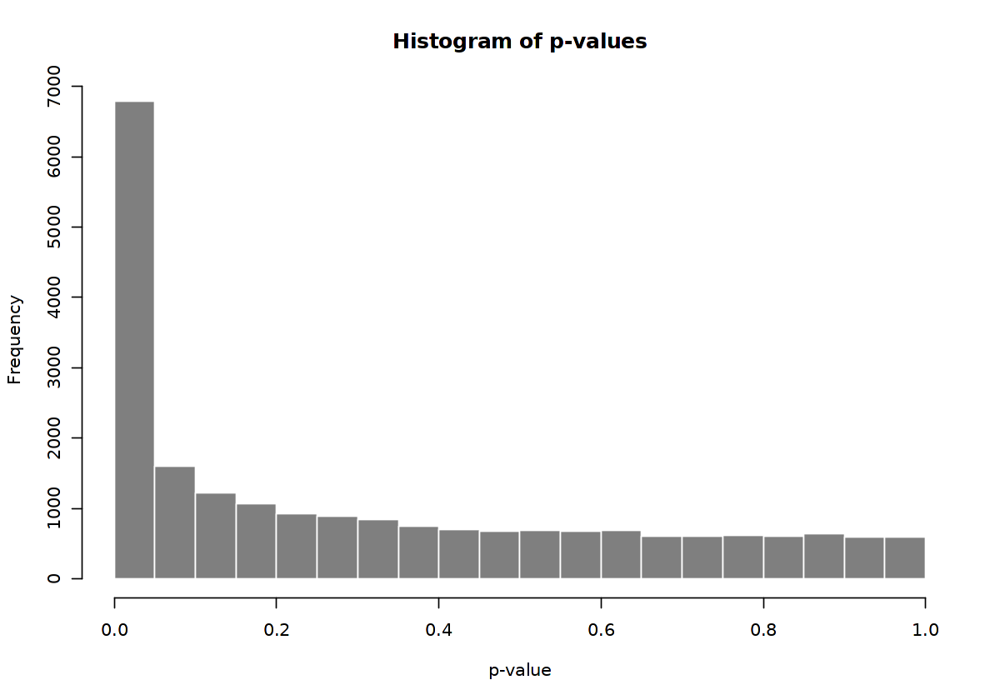

In [75]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$pvalue, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of p-values", xlab="p-value")

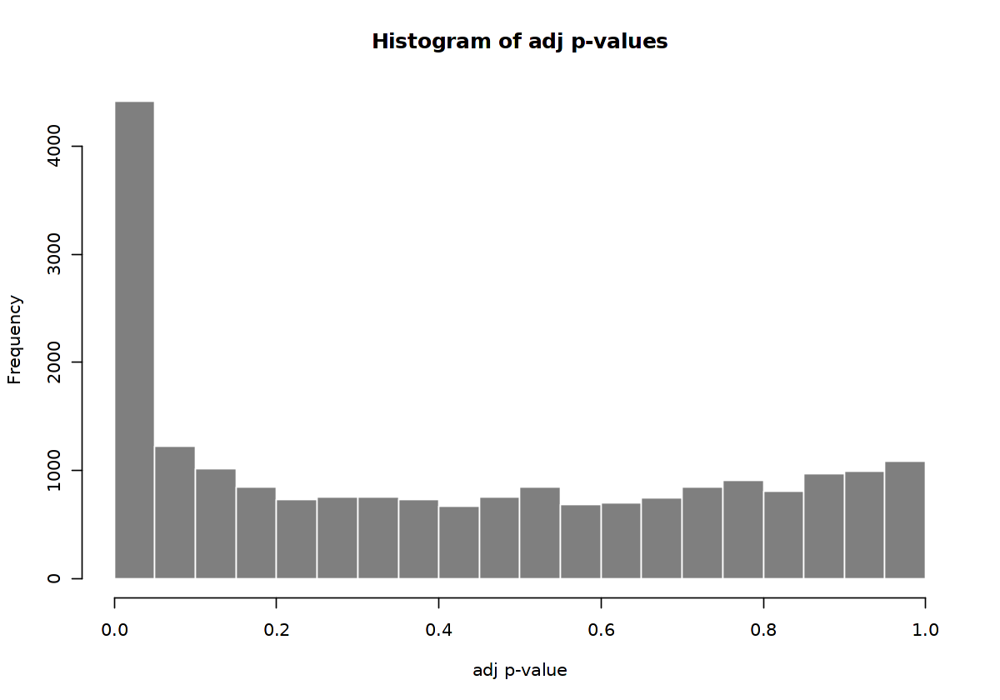

In [76]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$padj, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of adj p-values", xlab="adj p-value")

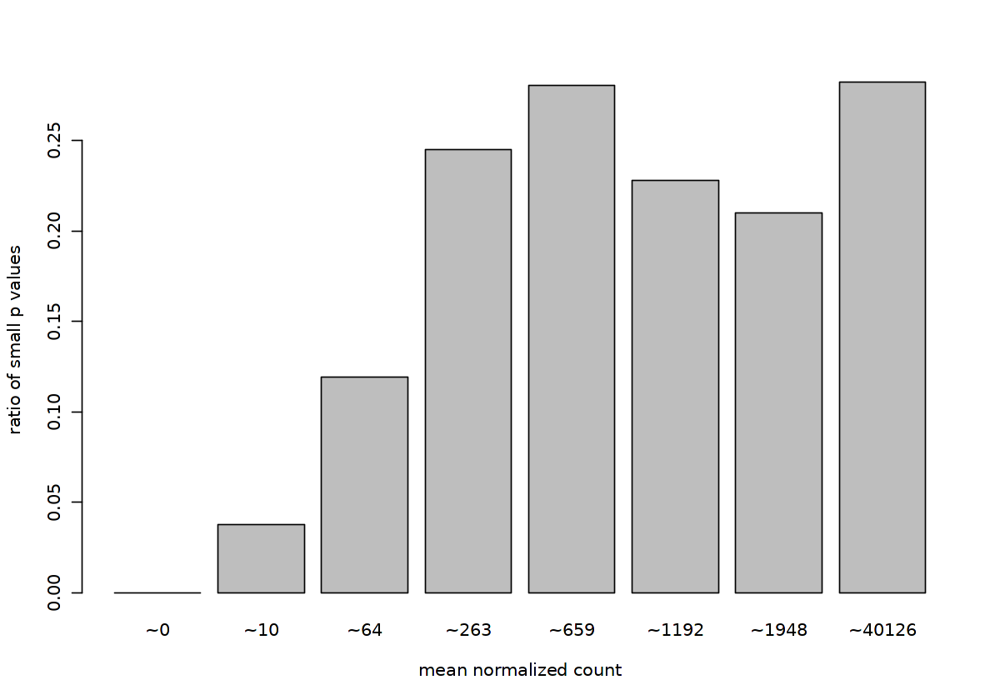

In [77]:
options(repr.plot.width=10, repr.plot.height=7)
qs <- c(0, quantile(res$baseMean[res$baseMean > 0], 0:7/7))
# cut the genes into the bins
bins <- cut(res$baseMean, qs)
# rename the levels of the bins using the middle point
levels(bins) <- paste0("~",round(.5*qs[-1] + .5*qs[-length(qs)]))
# calculate the ratio of $p$ values less than .01 for each bin
ratios <- tapply(res$pvalue, bins, function(p) mean(p < .01, na.rm=TRUE))
# plot these ratios
barplot(ratios, xlab="mean normalized count", ylab="ratio of small p values")

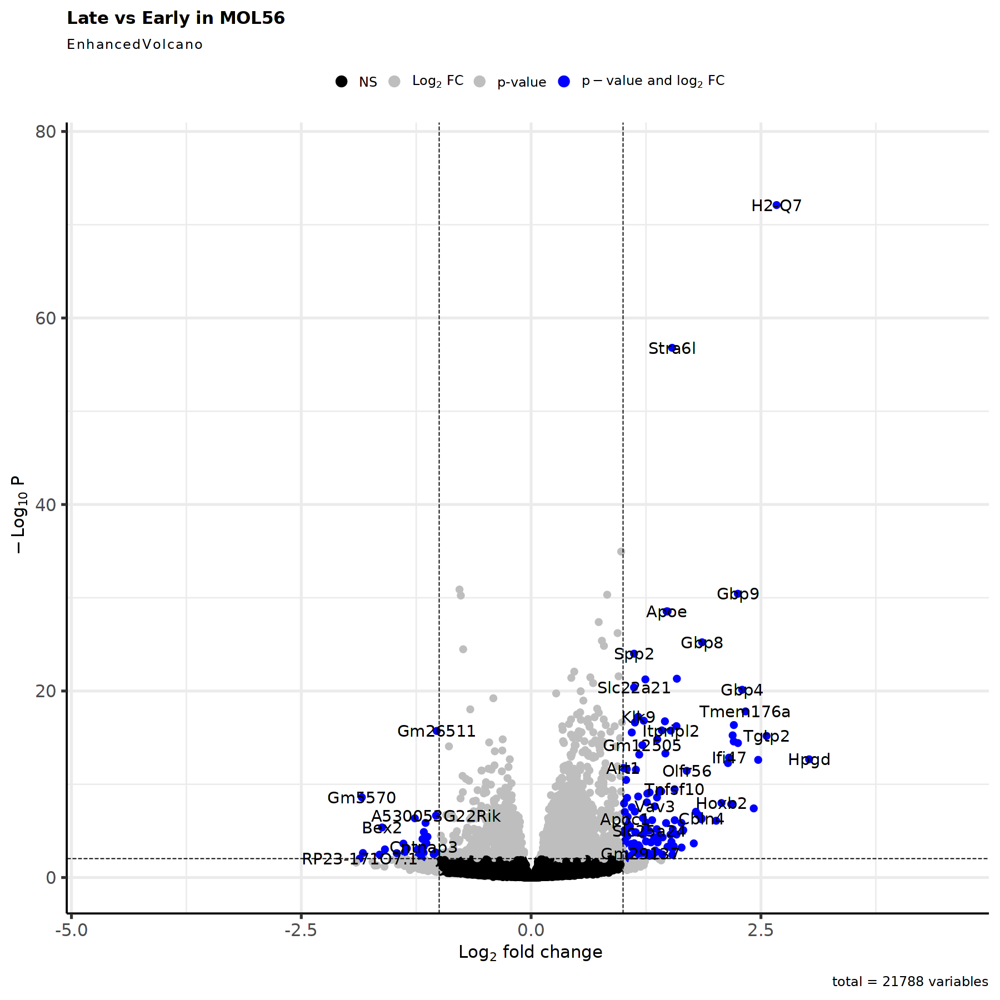

In [78]:
options(repr.plot.width=15, repr.plot.height=15)
#padj<0.001
EnhancedVolcano(res,
    lab = rownames(res),
    x = 'log2FoldChange',
    y = 'padj',
    title = paste0(condition1,' vs ',condition2,' in ', cluster_choice),
    pCutoff = 0.01,
    FCcutoff = 1,
    pointSize = 3.0,
    labSize = 6.0,
    col=c('black', 'grey', 'grey', 'blue'),
    colAlpha = 1)

In [79]:
res <- res[complete.cases(res$padj),]

In [80]:
res_filtered <- res[(res$padj < 0.01 & abs(res$log2FoldChange) > 1 & res$baseMean > 1),]

In [81]:
res_filtered[order(abs(res_filtered$log2FoldChange), decreasing=TRUE),]

log2 fold change (MLE): group_id Late vs Early 
Wald test p-value: group_id Late vs Early 
DataFrame with 154 rows and 6 columns
               baseMean log2FoldChange     lfcSE      stat      pvalue        padj
              <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
Hpgd            24.4708        3.02402  0.377550   8.00960 1.15083e-15 2.10214e-13
H2-Q7          215.9604        2.67015  0.143626  18.59097 3.80225e-77 7.79955e-73
Tgtp2           81.6742        2.56125  0.292862   8.74557 2.21896e-18 6.59676e-16
Gm4841          23.2997        2.47002  0.309126   7.99033 1.34581e-15 2.42164e-13
Bpifa5          29.0476        2.42182  0.392119   6.17623 6.56512e-10 3.85875e-08
...                 ...            ...       ...       ...         ...         ...
Ddit4l          33.4915        1.01055  0.198518   5.09046 3.57192e-07 1.00097e-05
Cd200r1         68.1139        1.00651  0.229087   4.39358 1.11497e-05 1.91120e-04
Gbp2           128.1773        1.00363  0

In [82]:
nrow(res_filtered)

[1] 154

In [83]:
HVGs.list[[cluster_choice]][[paste0(condition1,"_",condition2)]] <- rownames(res_filtered)

##### 3.1.1.4 Peak/Late

In [84]:
condition1 = "Peak"
condition2 = "Late"

In [85]:
contrast <- c("group_id", condition1, condition2)

# resultsNames(dds)
res <- results(dds, contrast = contrast, alpha = 0.05)

In [86]:
summary(res)


out of 21788 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 3798, 17%
LFC < 0 (down)     : 2772, 13%
outliers [1]       : 8, 0.037%
low counts [2]     : 0, 0%
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



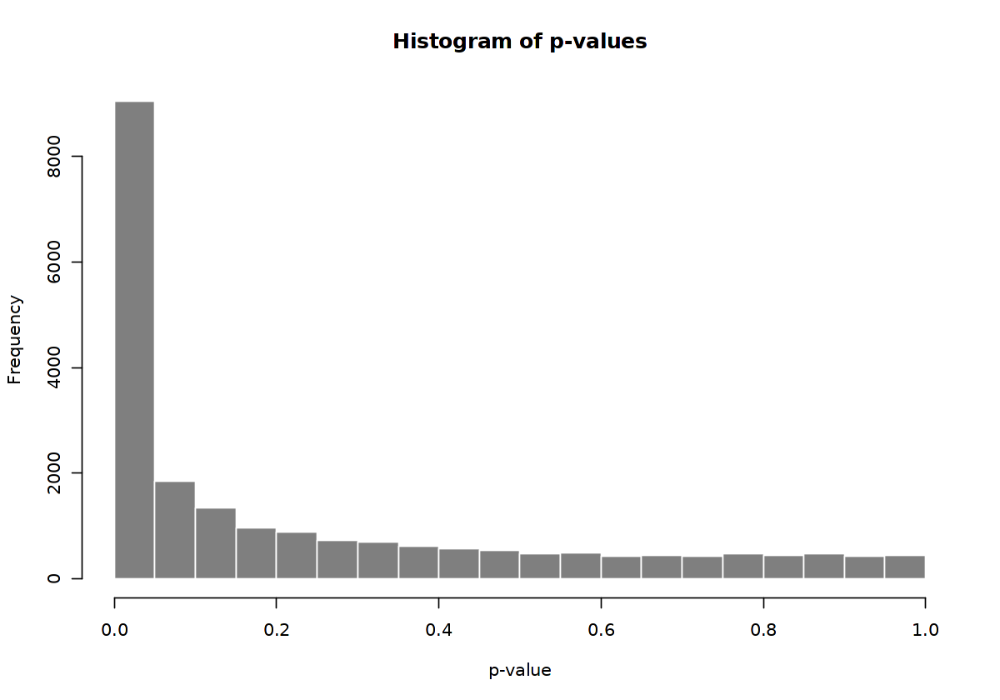

In [87]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$pvalue, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of p-values", xlab="p-value")

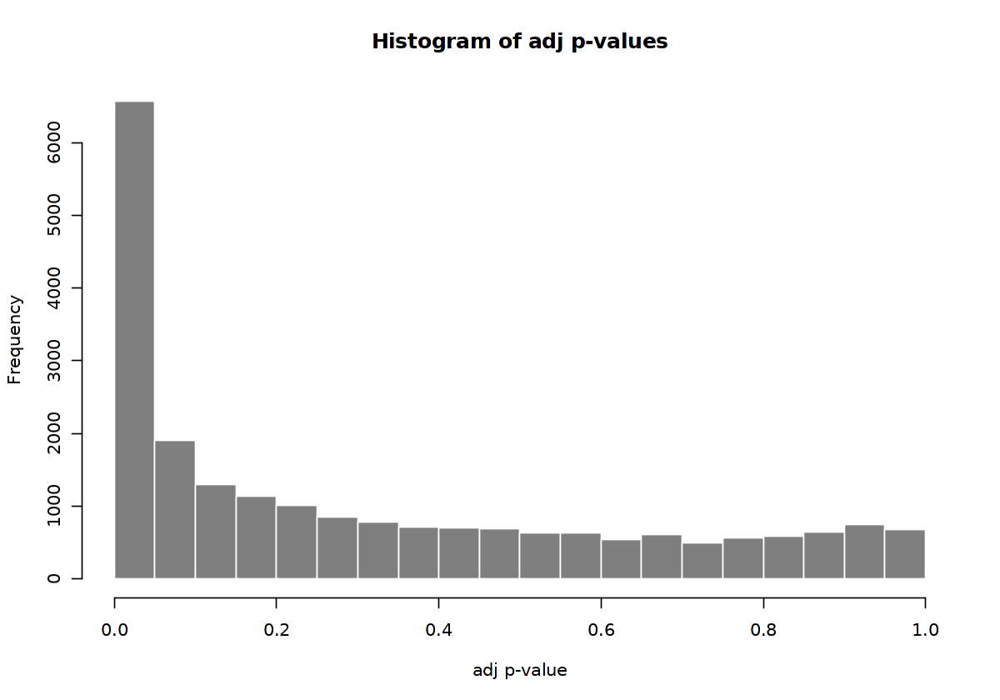

In [88]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$padj, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of adj p-values", xlab="adj p-value")

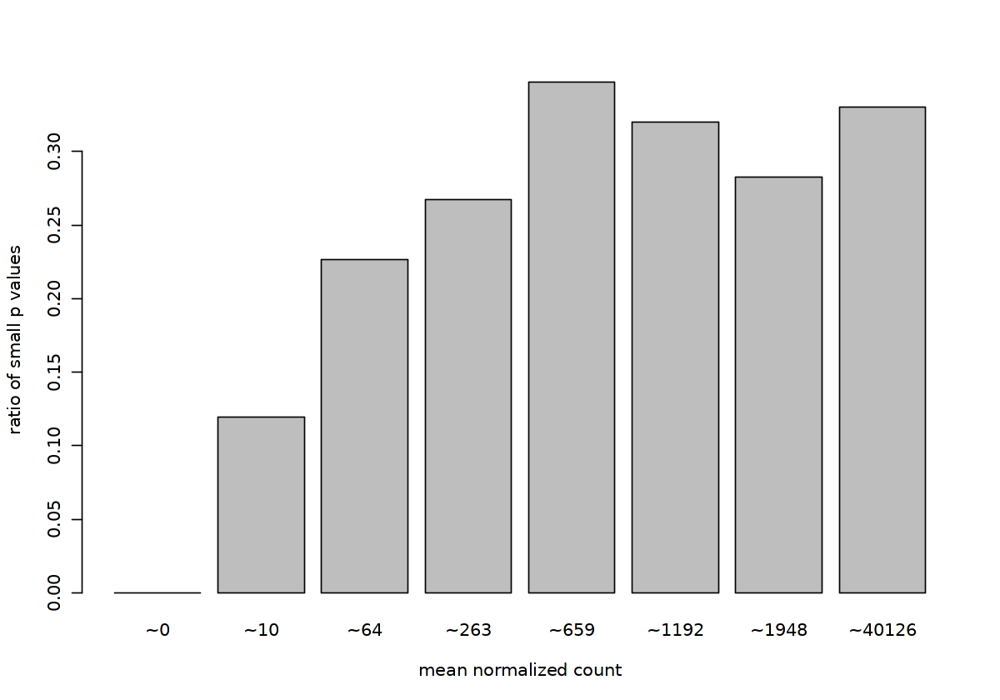

In [89]:
options(repr.plot.width=10, repr.plot.height=7)
qs <- c(0, quantile(res$baseMean[res$baseMean > 0], 0:7/7))
# cut the genes into the bins
bins <- cut(res$baseMean, qs)
# rename the levels of the bins using the middle point
levels(bins) <- paste0("~",round(.5*qs[-1] + .5*qs[-length(qs)]))
# calculate the ratio of $p$ values less than .01 for each bin
ratios <- tapply(res$pvalue, bins, function(p) mean(p < .01, na.rm=TRUE))
# plot these ratios
barplot(ratios, xlab="mean normalized count", ylab="ratio of small p values")

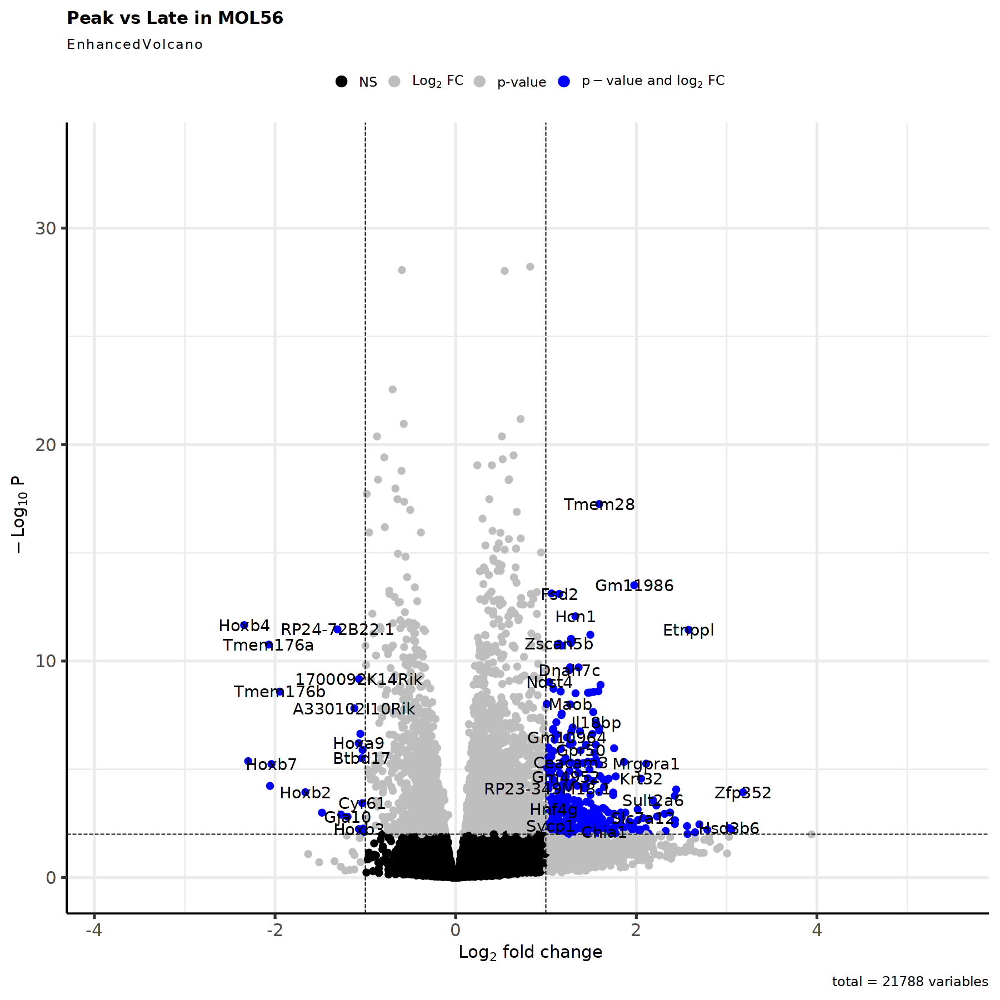

In [90]:
options(repr.plot.width=15, repr.plot.height=15)
#padj<0.001
EnhancedVolcano(res,
    lab = rownames(res),
    x = 'log2FoldChange',
    y = 'padj',
    title = paste0(condition1,' vs ',condition2,' in ', cluster_choice),
    pCutoff = 0.01,
    FCcutoff = 1,
    pointSize = 3.0,
    labSize = 6.0,
    col=c('black', 'grey', 'grey', 'blue'),
    colAlpha = 1)

In [91]:
res <- res[complete.cases(res$padj),]

In [92]:
res_filtered <- res[(res$padj < 0.01 & abs(res$log2FoldChange) > 1 & res$baseMean > 1),]

In [93]:
res_filtered[order(abs(res_filtered$log2FoldChange), decreasing=TRUE),]

log2 fold change (MLE): group_id Peak vs Late 
Wald test p-value: group_id Peak vs Late 
DataFrame with 396 rows and 6 columns
               baseMean log2FoldChange     lfcSE      stat      pvalue        padj
              <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
Zfp352          6.11858        3.18160  0.710987   4.47491 7.64426e-06 0.000115219
Klk1b22         3.86731        3.05388  0.923427   3.30712 9.42618e-04 0.005995975
Hsd3b6          3.27714        3.02792  0.902077   3.35661 7.89049e-04 0.005209300
Cd209c          3.56876        2.78664  0.846610   3.29153 9.96435e-04 0.006238099
9530002B09Rik   4.67762        2.69817  0.772081   3.49467 4.74653e-04 0.003492547
...                 ...            ...       ...       ...         ...         ...
Isg15           61.4929        1.00805  0.296988   3.39426 6.88142e-04 4.69247e-03
Dnah7b         656.1423        1.00790  0.157098   6.41576 1.40124e-10 9.59714e-09
Ogn             23.4783        1.00644  0.3

In [94]:
nrow(res_filtered)

[1] 396

In [95]:
HVGs.list[[cluster_choice]][[paste0(condition1,"_",condition2)]] <- rownames(res_filtered)

##### 3.1.1.5 Summary

In [96]:
listInput_upset <- HVGs.list[[cluster_choice]]
listInput_upset[sapply(listInput_upset, is.null)] <- NULL

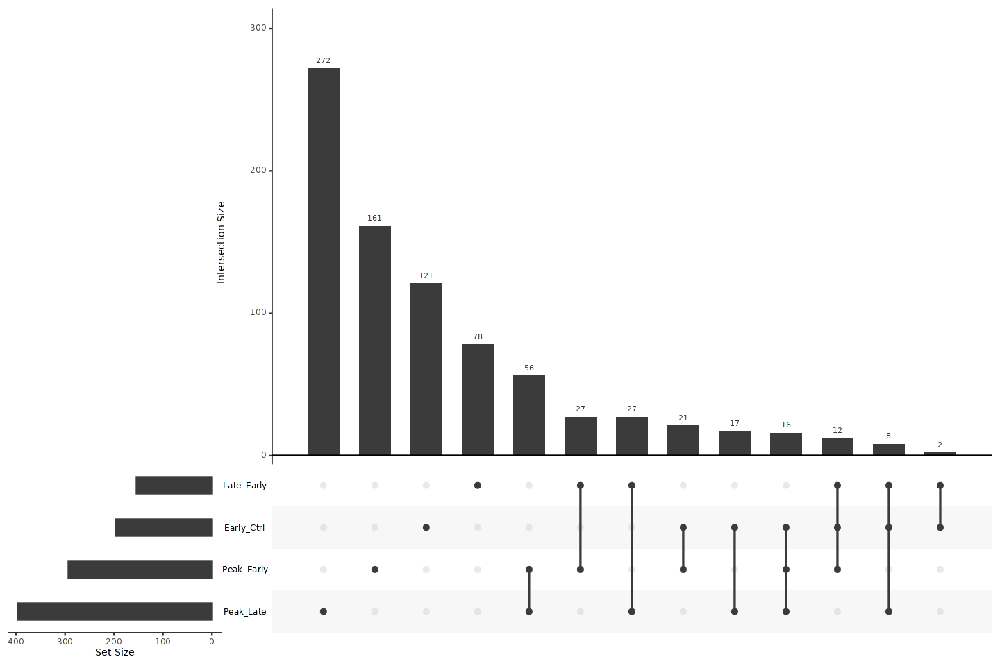

In [97]:
options(repr.plot.width=12, repr.plot.height=8)
upset(fromList(listInput_upset), order.by = "freq")

In [98]:
HVG <- unique(unlist(HVGs.list[[cluster_choice]]))

In [99]:
tmp <- subset(MORNAATACCOL, subset = cellType_OL_merge == cluster_choice)

In [100]:
#Remove sample with low number of cells
keepcells <- rownames(tmp@meta.data[!tmp$orig.ident %in% (names(table_sample_low)),])
tmp <- subset(tmp, cells=keepcells)

In [101]:
#Remove timepoint with low number of cells
keepcells <- rownames(tmp@meta.data[!tmp$orig.ident_merge %in% (names(table_group_low)),])
tmp <- subset(tmp, cells=keepcells)

In [102]:
DefaultAssay(tmp) <- "GenePromAcc"

In [103]:
tmp <- NormalizeData(tmp, normalization.method = "LogNormalize", scale.factor = 10000, margin = 1, verbose = TRUE)

Performing log-normalization
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|


In [104]:
tmp <- ScaleData(tmp, features=rownames(tmp))

Centering and scaling data matrix

  |==========================================================================================| 100%


In [105]:
DefaultAssay(tmp) <- "RNA"

In [106]:
tmp <- NormalizeData(tmp, normalization.method = "LogNormalize", scale.factor = 10000, margin = 1, verbose = TRUE)

Performing log-normalization
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|


In [107]:
DefaultAssay(tmp) <- "GenePromAcc"

In [108]:
tmp$orig.ident <- factor(x = tmp$orig.ident, levels = names(orig.ident_colors)[!names(orig.ident_colors) %in% names(table_sample_low)])
tmp$orig.ident_merge <- factor(x = tmp$orig.ident_merge, levels = names(orig.ident_merge_colors)[!names(orig.ident_merge_colors) %in% names(table_group_low)])

In [109]:
Idents(object = tmp) <- "orig.ident_merge"

Warning message:
"`StashIdent()` was deprecated in SeuratObject 3.0.0.
ℹ Please use object[["ident"]] <- Idents(object)"
Warning message:
"`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information."
Warning message:
"CombinePlots is being deprecated. Plots should now be combined using the patchwork system."


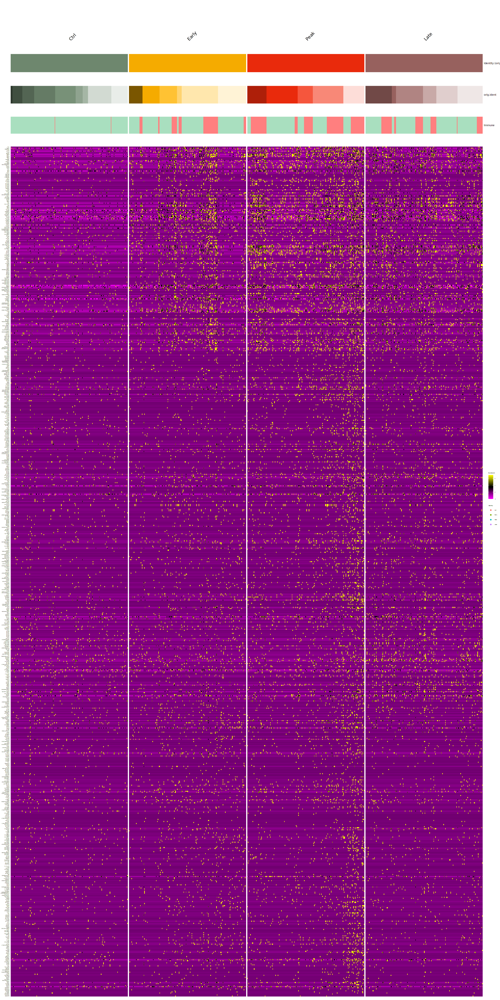

In [110]:
options(repr.plot.width=25, repr.plot.height=50)
DoMultiBarHeatmap(
    subset(tmp, downsample = 200),
    features = HVG,
    cells = NULL,
    group.by = "orig.ident_merge",
    additional.group.by = c("orig.ident", "Immune"),
    additional.group.sort.by = c("orig.ident", "Immune"),
    cols.use = list(orig.ident_merge=orig.ident_merge_colors, orig.ident=orig.ident_colors, Immune=immune_colors),
    group.bar = TRUE,
    disp.min = -2.5,
    disp.max = NULL,
    layer = "scale.data",
    assay = "GenePromAcc",
    label = TRUE,
    size = 5.5,
    hjust = 0,
    angle = 45,
    raster = TRUE,
    draw.lines = TRUE,
    lines.width = NULL,
    group.bar.height = 0.02,
    combine = TRUE
    ) + theme(text = element_text(size = 4))

In [111]:
gene_list <- HVG

In [112]:
Idents(object = tmp) <- "orig.ident_merge"

In [113]:
sample_names <- levels(tmp$orig.ident)

In [114]:
tmp_sample_markers <- as.data.frame(AggregateExpression(tmp, assays = "GenePromAcc", group.by = "orig.ident", normalization.method = "LogNormalize", scale.factor = 10000, return.seurat = TRUE)[["GenePromAcc"]]$data[gene_list,])

Centering and scaling data matrix

  |==========================================================================================| 100%
  |==========================================================================================| 100%


In [115]:
tmp_sample_markers_RNA <- data.frame(matrix(0L, ncol=length(sample_names), nrow=length(gene_list), dimnames=list(gene_list, sample_names)))

In [116]:
gene_list_RNA <- gene_list[gene_list %in% rownames(tmp[['RNA']])]

In [117]:
genes0 <- names(rowSums(tmp[['RNA']]@counts[gene_list_RNA,])[rowSums(tmp[['RNA']]@counts[gene_list_RNA,]) == 0])

In [118]:
gene_list_RNA <- gene_list_RNA[!gene_list_RNA %in% genes0]

In [119]:
tmp_sample_markers_RNA_sub <- as.data.frame(AggregateExpression(tmp, assays = "RNA", group.by = "orig.ident", normalization.method = "LogNormalize", scale.factor = 10000, return.seurat = TRUE)[["RNA"]]$data[gene_list_RNA,])

  |==========================================================================================| 100%


In [120]:
matrix <- tmp_sample_markers/do.call(pmax, tmp_sample_markers)

In [121]:
paletteLength <- 50
myColor <- colorRampPalette(c("#FFBCB5", "#432371"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

In [122]:
plot_height <- ifelse(as.integer(nrow(matrix)/20)<=5, 5, as.integer(nrow(matrix)/20))

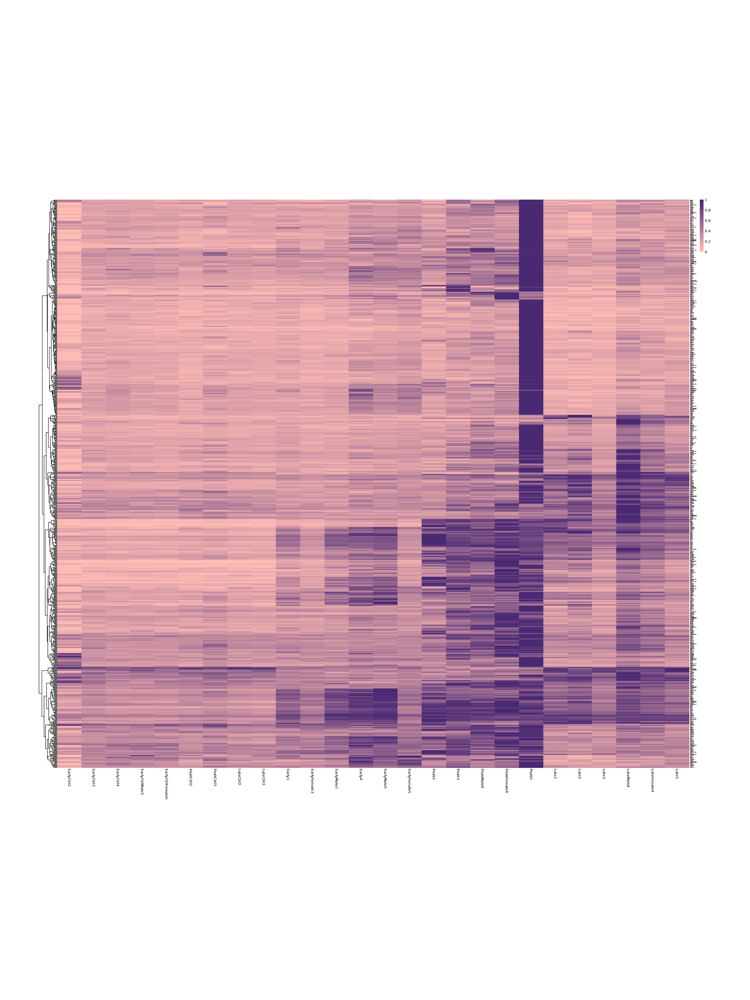

In [123]:
options(repr.plot.width=30, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=TRUE)
ph

In [124]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_",cluster_choice,"_sep_pseudobulk.pdf"), width=30, height=plot_height)

png 
  2

In [125]:
gene_list <- gene_list[ph$tree_row$order]

In [126]:
tmp_sample_markers_mean <- data.frame(matrix(0L, ncol=1, nrow=length(gene_list), dimnames=list(gene_list, "Mean_Log2Acc")))

In [127]:
tmp_sample_markers_mean[rownames(tmp_sample_markers),"Mean_Log2Acc"] <- rowMeans(tmp_sample_markers)

In [128]:
matrix <- tmp_sample_markers_mean

In [129]:
paletteLength <- 50
myColor <- colorRampPalette(c("white", "black"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

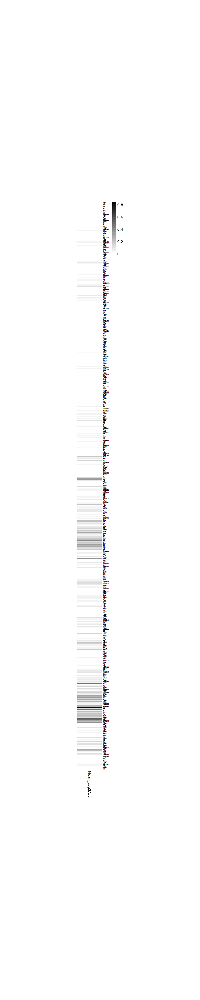

In [130]:
options(repr.plot.width=8, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [131]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_",cluster_choice,"_sep_pseudobulk_mean.pdf"), width=7, height=plot_height)

png 
  2

In [132]:
tmp_sample_markers_zscore <- t(apply(tmp_sample_markers[gene_list,], 1, scale))
colnames(tmp_sample_markers_zscore) <- paste0("zscore_", sample_names)
matrix <- tmp_sample_markers_zscore

In [133]:
paletteLength <- 100
myColor <- colorRampPalette(c("blue", "white", "red"))(paletteLength/2)
myBreaks <- c(seq(-max(abs(matrix)), max(abs(matrix)), length.out=floor(paletteLength/2)))
myColor[(paletteLength/4):((paletteLength/4)+1)] <- c("#FFFFFF", "#FFFFFF")

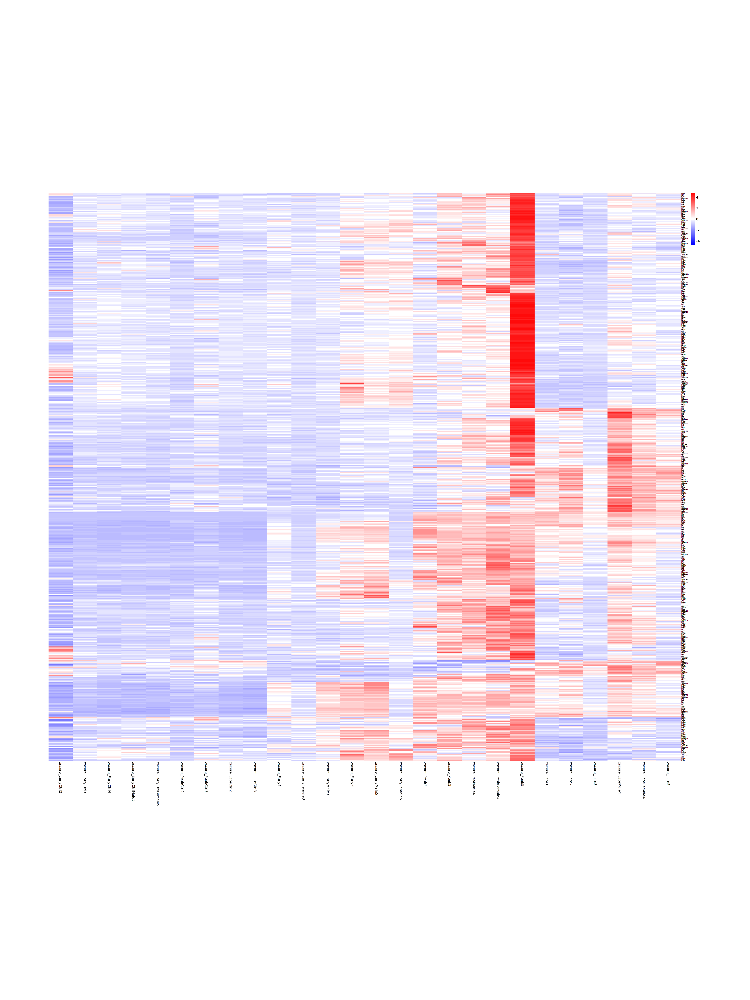

In [134]:
options(repr.plot.width=30, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [135]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_",cluster_choice,"_sep_pseudobulk_zscore.pdf"), width=30, height=plot_height)

png 
  2

In [136]:
matrix <- tmp_sample_markers_RNA
matrix_sub <- tmp_sample_markers_RNA_sub

In [137]:
matrix_sub <- matrix_sub/do.call(pmax, matrix_sub)

In [138]:
is.nan.data.frame <- function(x)
do.call(cbind, lapply(x, is.nan))

matrix_sub[is.nan.data.frame(matrix_sub)] <- 0

In [139]:
matrix[rownames(matrix_sub),] <- matrix_sub
matrix <- matrix[gene_list,]

In [140]:
paletteLength <- 50
myColor <- colorRampPalette(c("#FFFFB3", "#5E3719"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

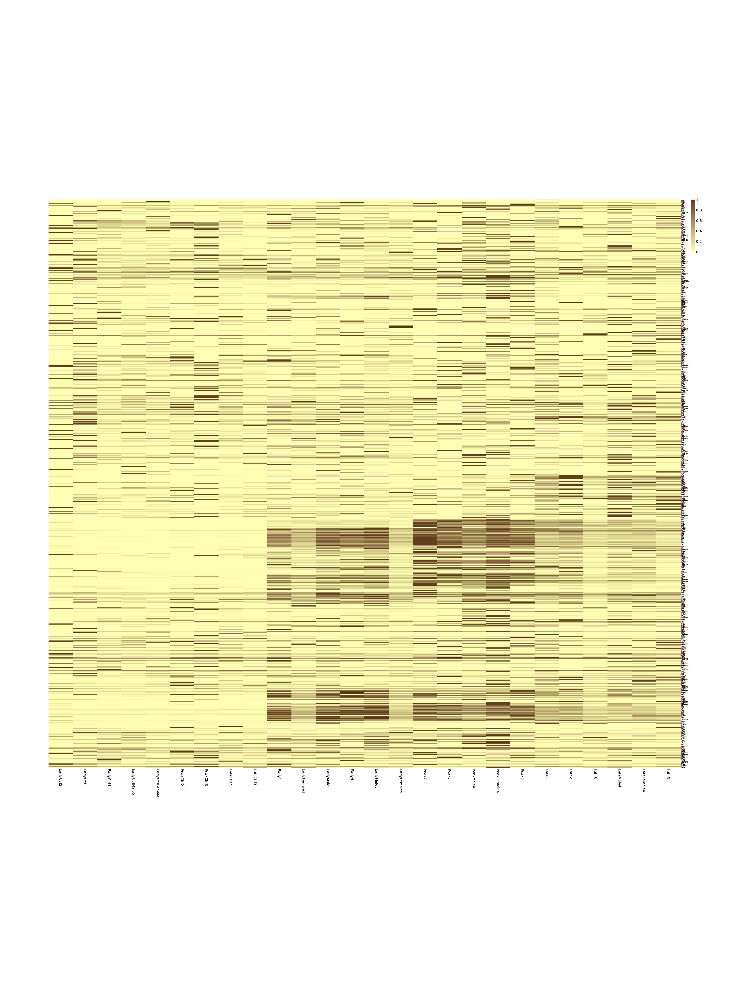

In [141]:
options(repr.plot.width=30, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [142]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_Exp_",cluster_choice,"_sep_pseudobulk.pdf"), width=30, height=plot_height)

png 
  2

In [143]:
tmp_sample_markers_RNA_mean <- data.frame(matrix(0L, ncol=1, nrow=length(gene_list), dimnames=list(gene_list, "Mean_Log2Exp")))

In [144]:
tmp_sample_markers_RNA_mean[rownames(tmp_sample_markers_RNA_sub),"Mean_Log2Exp"] <- rowMeans(tmp_sample_markers_RNA_sub)

In [145]:
matrix <- tmp_sample_markers_RNA_mean

In [146]:
is.nan.data.frame <- function(x)
do.call(cbind, lapply(x, is.na))

matrix[is.na.data.frame(matrix)] <- 0

In [147]:
paletteLength <- 50
myColor <- colorRampPalette(c("white", "black"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

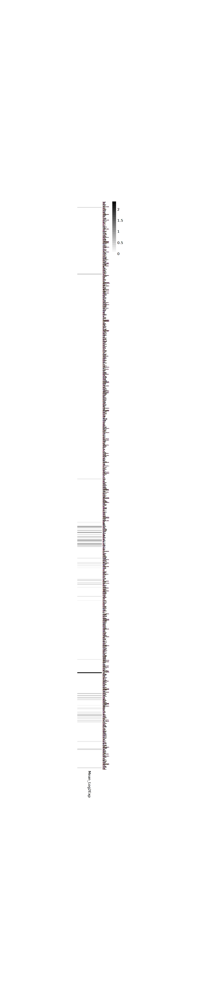

In [148]:
options(repr.plot.width=8, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [149]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_Exp_",cluster_choice,"_sep_pseudobulk_mean.pdf"), width=7, height=plot_height)

png 
  2

In [150]:
tmp_sample_markers_RNA[rownames(tmp_sample_markers_RNA_sub),] <- tmp_sample_markers_RNA_sub

In [151]:
tmp_sample_markers_RNA_zscore <- t(apply(tmp_sample_markers_RNA[gene_list,], 1, scale))
colnames(tmp_sample_markers_RNA_zscore) <- paste0("zscore_", sample_names)
matrix <- tmp_sample_markers_RNA_zscore

In [152]:
is.nan.data.frame <- function(x)
do.call(cbind, lapply(x, is.na))

matrix[is.na.data.frame(matrix)] <- 0

In [153]:
paletteLength <- 100
myColor <- colorRampPalette(c("blue", "white", "red"))(paletteLength/2)
myBreaks <- c(seq(-max(abs(matrix)), max(abs(matrix)), length.out=floor(paletteLength/2)))
myColor[(paletteLength/4):((paletteLength/4)+1)] <- c("#FFFFFF", "#FFFFFF")

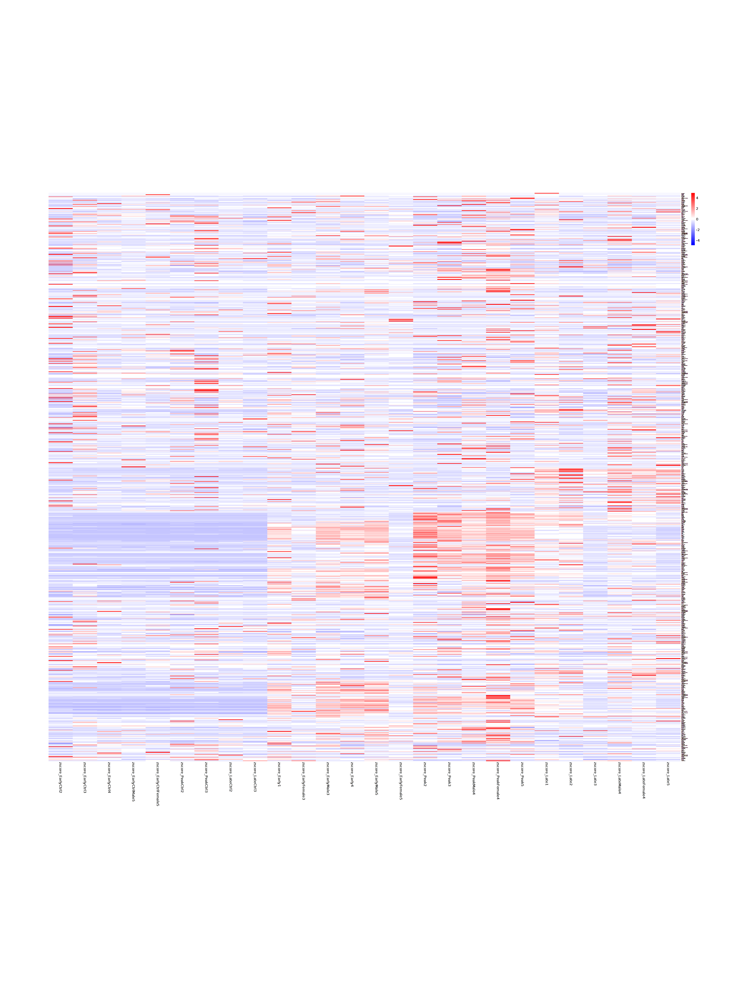

In [154]:
options(repr.plot.width=30, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [155]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_Exp_",cluster_choice,"_sep_pseudobulk_zscore.pdf"), width=30, height=plot_height)

png 
  2

In [156]:
gene_list <- HVG

In [157]:
sample_names <- levels(tmp$orig.ident_merge)

In [158]:
tmp_sample_markers <- as.data.frame(AggregateExpression(tmp, assays = "GenePromAcc", group.by = "orig.ident_merge", normalization.method = "LogNormalize", scale.factor = 10000, return.seurat = TRUE)[["GenePromAcc"]]$data[gene_list,])

Centering and scaling data matrix

  |==========================================================================================| 100%
  |==========================================================================================| 100%


In [159]:
tmp_sample_markers_RNA <- data.frame(matrix(0L, ncol=length(sample_names), nrow=length(gene_list), dimnames=list(gene_list, sample_names)))

In [160]:
gene_list_RNA <- gene_list[gene_list %in% rownames(tmp[['RNA']])]

In [161]:
genes0 <- names(rowSums(tmp[['RNA']]@counts[gene_list_RNA,])[rowSums(tmp[['RNA']]@counts[gene_list_RNA,]) == 0])

In [162]:
gene_list_RNA <- gene_list_RNA[!gene_list_RNA %in% genes0]

In [163]:
tmp_sample_markers_RNA_sub <- as.data.frame(AggregateExpression(tmp, assays = "RNA", group.by = "orig.ident_merge", normalization.method = "LogNormalize", scale.factor = 10000, return.seurat = TRUE)[["RNA"]]$data[gene_list_RNA,])

  |==========================================================================================| 100%


In [164]:
matrix <- tmp_sample_markers/do.call(pmax, tmp_sample_markers)

In [165]:
paletteLength <- 50
myColor <- colorRampPalette(c("#FFBCB5", "#432371"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

In [166]:
plot_height <- ifelse(as.integer(nrow(matrix)/20)<=5, 5, as.integer(nrow(matrix)/20))

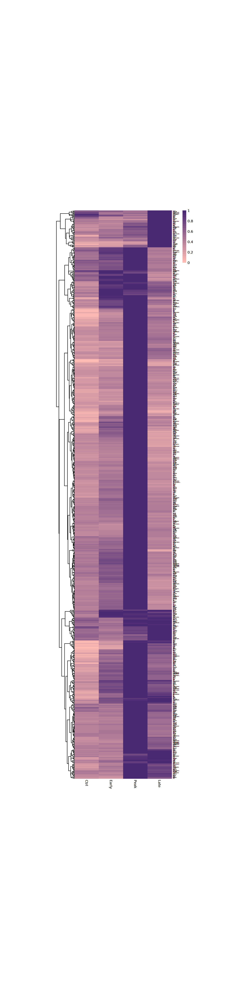

In [167]:
options(repr.plot.width=10, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=TRUE)
ph

In [168]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_",cluster_choice,"_pseudobulk.pdf"), width=10, height=plot_height)

png 
  2

In [169]:
gene_list <- gene_list[ph$tree_row$order]

In [170]:
tmp_sample_markers_mean <- data.frame(matrix(0L, ncol=1, nrow=length(gene_list), dimnames=list(gene_list, "Mean_Log2Acc")))

In [171]:
tmp_sample_markers_mean[rownames(tmp_sample_markers),"Mean_Log2Acc"] <- rowMeans(tmp_sample_markers)

In [172]:
matrix <- tmp_sample_markers_mean

In [173]:
paletteLength <- 50
myColor <- colorRampPalette(c("white", "black"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

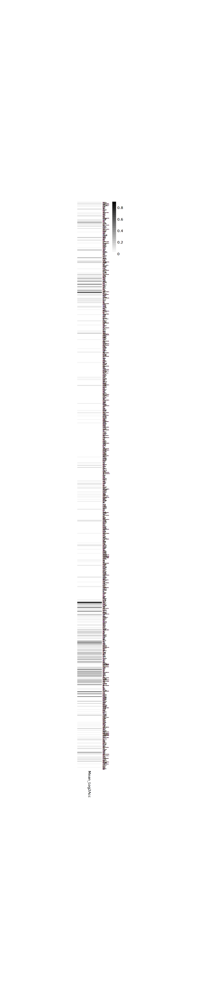

In [174]:
options(repr.plot.width=8, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [175]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_",cluster_choice,"_pseudobulk_mean.pdf"), width=8, height=plot_height)

png 
  2

In [176]:
tmp_sample_markers_zscore <- t(apply(tmp_sample_markers[gene_list,], 1, scale))
colnames(tmp_sample_markers_zscore) <- paste0("zscore_", sample_names)
matrix <- tmp_sample_markers_zscore

In [177]:
paletteLength <- 100
myColor <- colorRampPalette(c("blue", "white", "red"))(paletteLength/2)
myBreaks <- c(seq(-max(abs(matrix)), max(abs(matrix)), length.out=floor(paletteLength/2)))
myColor[(paletteLength/4):((paletteLength/4)+1)] <- c("#FFFFFF", "#FFFFFF")

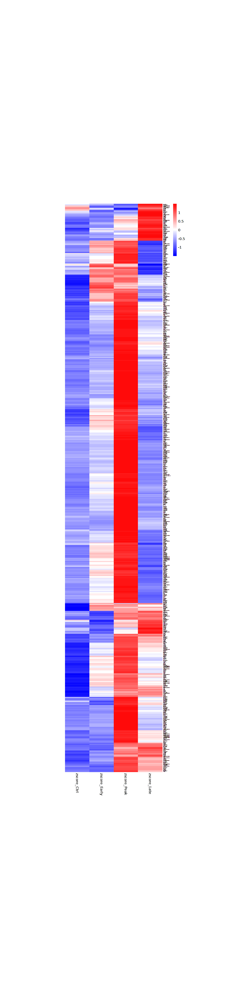

In [178]:
options(repr.plot.width=10, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [179]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_",cluster_choice,"_pseudobulk_zscore.pdf"), width=10, height=plot_height)

png 
  2

In [180]:
matrix <- tmp_sample_markers_RNA
matrix_sub <- tmp_sample_markers_RNA_sub

In [181]:
matrix_sub <- matrix_sub/do.call(pmax, matrix_sub)

In [182]:
is.nan.data.frame <- function(x)
do.call(cbind, lapply(x, is.nan))

matrix_sub[is.nan.data.frame(matrix_sub)] <- 0

In [183]:
matrix[rownames(matrix_sub),] <- matrix_sub
matrix <- matrix[gene_list,]

In [184]:
paletteLength <- 50
myColor <- colorRampPalette(c("#FFFFB3", "#5E3719"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

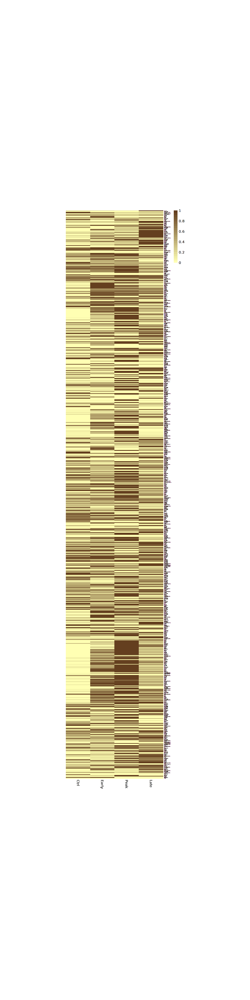

In [185]:
options(repr.plot.width=10, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [186]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_Exp_",cluster_choice,"_pseudobulk.pdf"), width=10, height=plot_height)

png 
  2

In [187]:
tmp_sample_markers_RNA_mean <- data.frame(matrix(0L, ncol=1, nrow=length(gene_list), dimnames=list(gene_list, "Mean_Log2Exp")))

In [188]:
tmp_sample_markers_RNA_mean[rownames(tmp_sample_markers_RNA_sub),"Mean_Log2Exp"] <- rowMeans(tmp_sample_markers_RNA_sub)

In [189]:
matrix <- tmp_sample_markers_RNA_mean

In [190]:
is.nan.data.frame <- function(x)
do.call(cbind, lapply(x, is.na))

matrix[is.na.data.frame(matrix)] <- 0

In [191]:
paletteLength <- 50
myColor <- colorRampPalette(c("white", "black"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

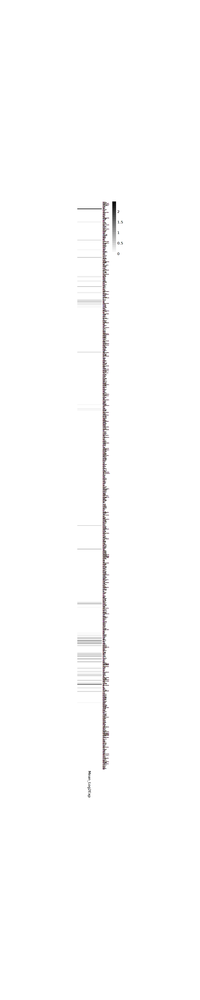

In [192]:
options(repr.plot.width=8, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [193]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_Exp_",cluster_choice,"_pseudobulk_mean.pdf"), width=7, height=plot_height)

png 
  2

In [194]:
tmp_sample_markers_RNA[rownames(tmp_sample_markers_RNA_sub),] <- tmp_sample_markers_RNA_sub

In [195]:
tmp_sample_markers_RNA_zscore <- t(apply(tmp_sample_markers_RNA[gene_list,], 1, scale))
colnames(tmp_sample_markers_RNA_zscore) <- paste0("zscore_", sample_names)
matrix <- tmp_sample_markers_RNA_zscore

In [196]:
is.nan.data.frame <- function(x)
do.call(cbind, lapply(x, is.na))

matrix[is.na.data.frame(matrix)] <- 0

In [197]:
paletteLength <- 100
myColor <- colorRampPalette(c("blue", "white", "red"))(paletteLength/2)
myBreaks <- c(seq(-max(abs(matrix)), max(abs(matrix)), length.out=floor(paletteLength/2)))
myColor[(paletteLength/4):((paletteLength/4)+1)] <- c("#FFFFFF", "#FFFFFF")

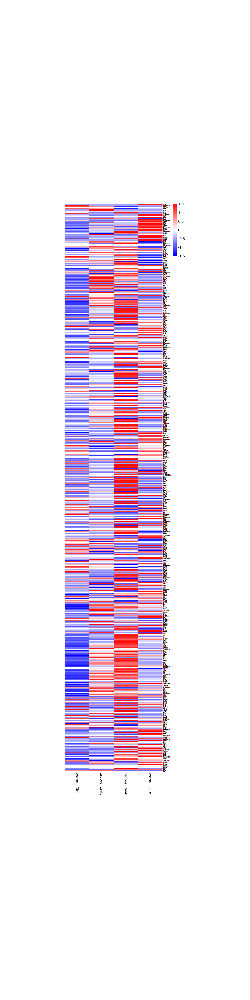

In [198]:
options(repr.plot.width=10, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [199]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_Exp_",cluster_choice,"_pseudobulk_zscore.pdf"), width=10, height=plot_height)

png 
  2

#### 3.1.2 MOL2

In [200]:
cluster_choice <- "MOL2"

In [201]:
HVGs.list[[cluster_choice]] <- list()

In [202]:
table_sample_low <- table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$sample_id)[cluster_choice,][table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$sample_id)[cluster_choice,] <= 5]
table_sample_low

sample_keep <- names(orig.ident_colors)[!names(orig.ident_colors) %in% names(table_sample_low)]

named integer(0)

In [203]:
table_group_low <-table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$group_id)[cluster_choice,][table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$group_id)[cluster_choice,] <= 30]
table_group_low

group_keep <- names(orig.ident_merge_colors)[!names(orig.ident_merge_colors) %in% names(table_group_low)]

named integer(0)

In [204]:
cluster_metadata <- metadata[which(metadata$cluster_id == cluster_choice), ]

# Assign the rownames of the metadata to be the sample IDs
rownames(cluster_metadata) <- cluster_metadata$sample_id

In [206]:
#Remove sample and timepoint with low counts (sample<=5, timepoint<=30)
cluster_metadata <- cluster_metadata[(cluster_metadata$sample_id %in% sample_keep & cluster_metadata$group_id %in% group_keep),]

new_group_levels <- levels(cluster_metadata$group_id)[levels(cluster_metadata$group_id) %in% group_keep]
cluster_metadata$group_id <- droplevels(cluster_metadata$group_id)
levels(cluster_metadata$group_id) <- new_group_levels

In [207]:
# Subset the counts to only this cluster
counts <- pb[[cluster_choice]]

cluster_counts <- data.frame(counts[, which(colnames(counts) %in% rownames(cluster_metadata))])

# Check that all of the row names of the metadata are the same and in the same order as the column names of the counts in order to use as input to DESeq2
all(rownames(cluster_metadata) == colnames(cluster_counts))

[1] TRUE

In [208]:
dds <- DESeqDataSetFromMatrix(cluster_counts, colData = cluster_metadata, design = ~ group_id + debris_id)

converting counts to integer mode

Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


In [209]:
# Transform counts for data visualization
rld <- rlog(dds, blind=TRUE)

using ntop=500 top features by variance



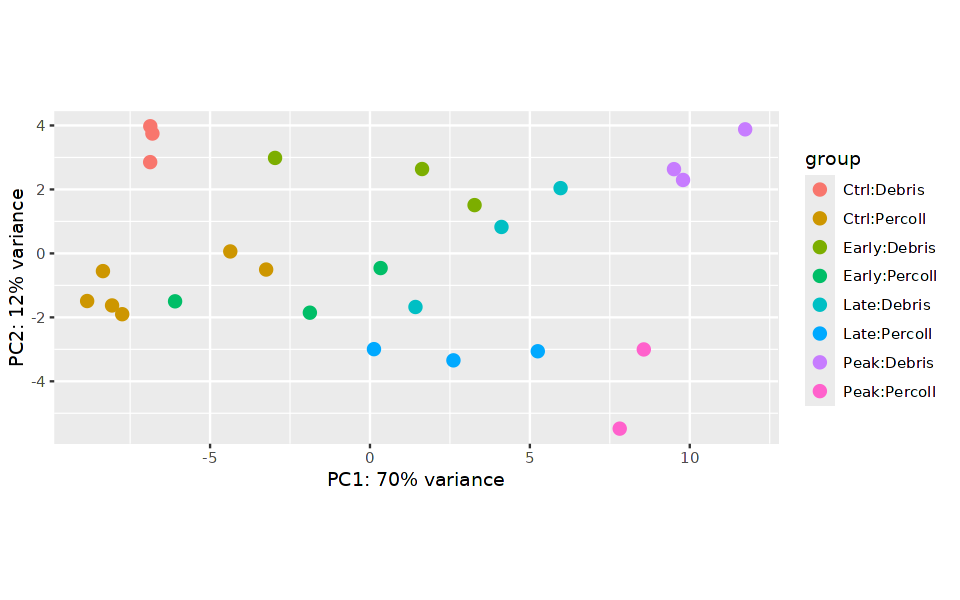

In [210]:
# Plot PCA
options(repr.plot.width=8, repr.plot.height=5)
DESeq2::plotPCA(rld, intgroup = c("group_id", "debris_id"))

In [211]:
# Extract the rlog matrix from the object and compute pairwise correlation values
rld_mat <- assay(rld)
rld_cor <- cor(rld_mat)

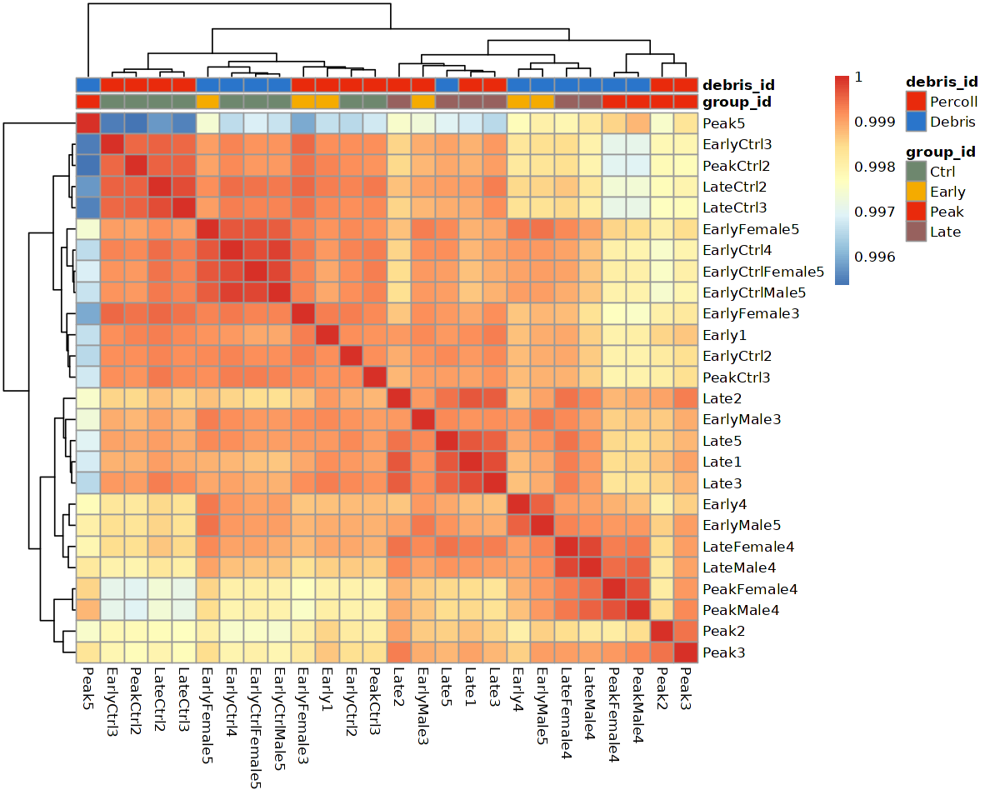

In [212]:
# Plot heatmap
options(repr.plot.width=10, repr.plot.height=8)
pheatmap(rld_cor, annotation = cluster_metadata[, c("group_id","debris_id"), drop=F], annotation_colors = list(group_id=orig.ident_merge_colors, debris_id=debris_colors))

In [213]:
# Run DESeq2 differential expression analysis
dds <- DESeq(dds)

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



In [214]:
libsize = data.frame(x=sizeFactors(dds), y=colSums(assay(dds)))

`geom_smooth()` using formula = 'y ~ x'


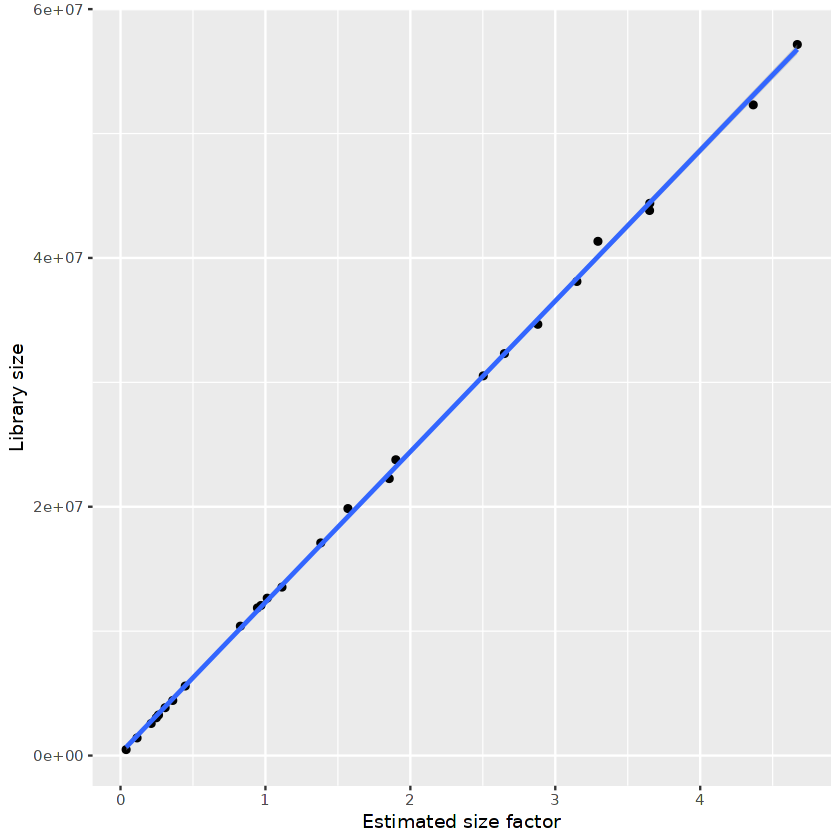

In [215]:
options(repr.plot.width=7, repr.plot.height=7)
ggplot(data=libsize, aes(x=x, y=y)) + geom_point() + geom_smooth(method="lm") + xlab("Estimated size factor") + ylab("Library size")

In [216]:
data.frame(colData(dds))

,cluster_id,sample_id,group_id,debris_id,sizeFactor
,<chr>,<chr>,<fct>,<fct>,<dbl>
Early1,MOL2,Early1,Early,Percoll,0.30801265
Early4,MOL2,Early4,Early,Debris,0.24741234
EarlyCtrl2,MOL2,EarlyCtrl2,Ctrl,Percoll,0.03888192
EarlyCtrl3,MOL2,EarlyCtrl3,Ctrl,Percoll,0.26233565
EarlyCtrl4,MOL2,EarlyCtrl4,Ctrl,Debris,2.87952489
EarlyCtrlFemale5,MOL2,EarlyCtrlFemale5,Ctrl,Debris,3.65068976
EarlyCtrlMale5,MOL2,EarlyCtrlMale5,Ctrl,Debris,3.14921860
EarlyFemale3,MOL2,EarlyFemale3,Early,Percoll,0.36066501
EarlyFemale5,MOL2,EarlyFemale5,Early,Debris,1.85436332


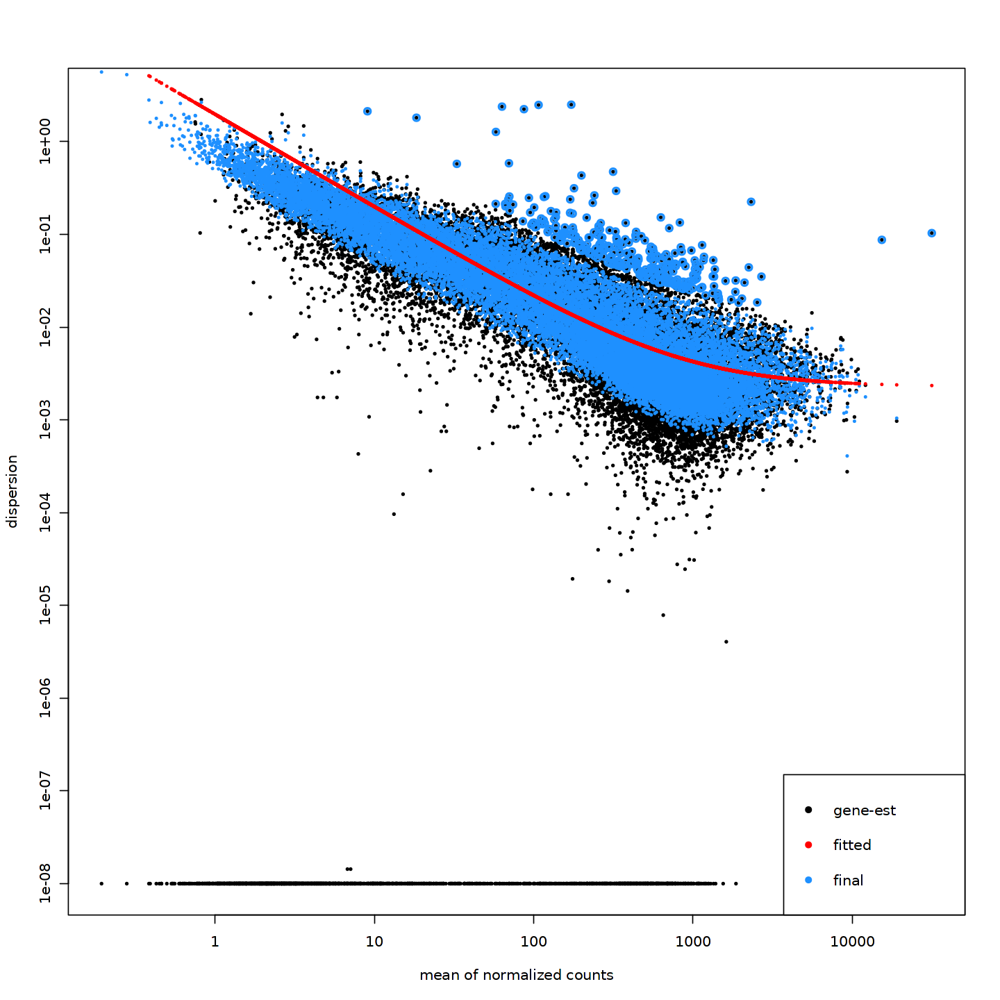

In [217]:
# Plot dispersion estimates
options(repr.plot.width=12, repr.plot.height=12)
plotDispEsts(dds)

##### 3.1.2.1 Early/Ctrl

In [218]:
condition1 = "Early"
condition2 = "Ctrl"

In [219]:
contrast <- c("group_id", condition1, condition2)

# resultsNames(dds)
res <- results(dds, contrast = contrast, alpha = 0.05)

In [220]:
summary(res)


out of 21788 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 996, 4.6%
LFC < 0 (down)     : 550, 2.5%
outliers [1]       : 2, 0.0092%
low counts [2]     : 3800, 17%
(mean count < 17)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



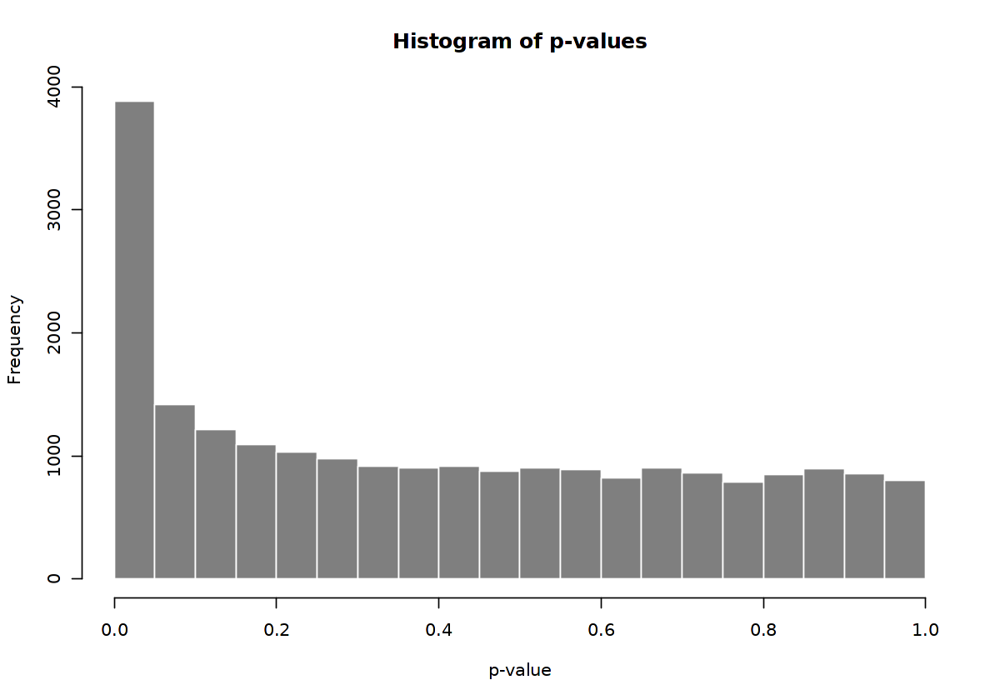

In [221]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$pvalue, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of p-values", xlab="p-value")

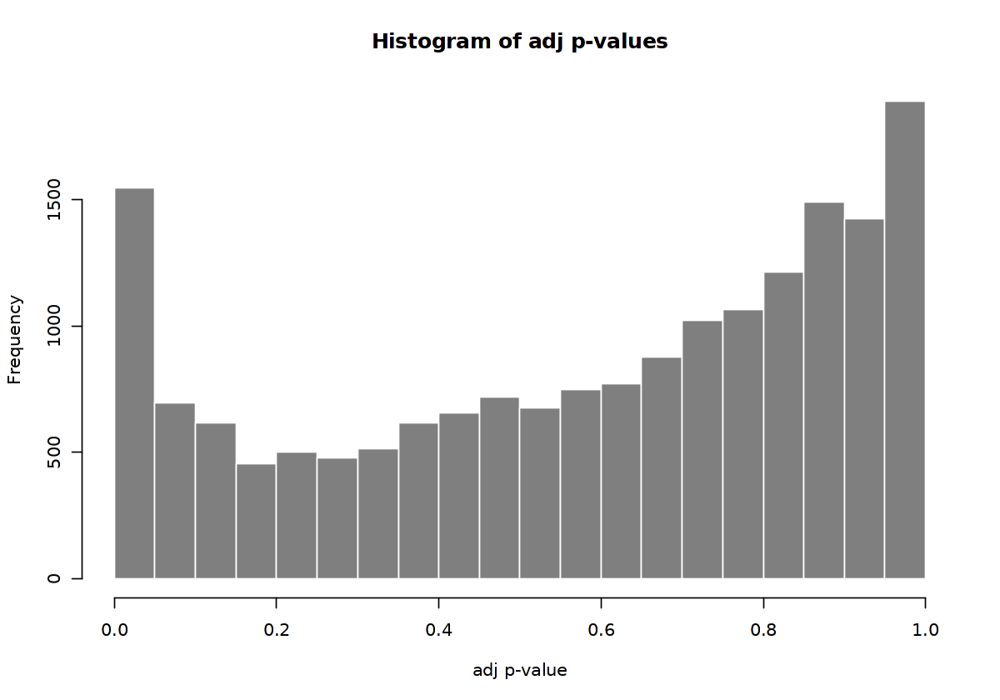

In [222]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$padj, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of adj p-values", xlab="adj p-value")

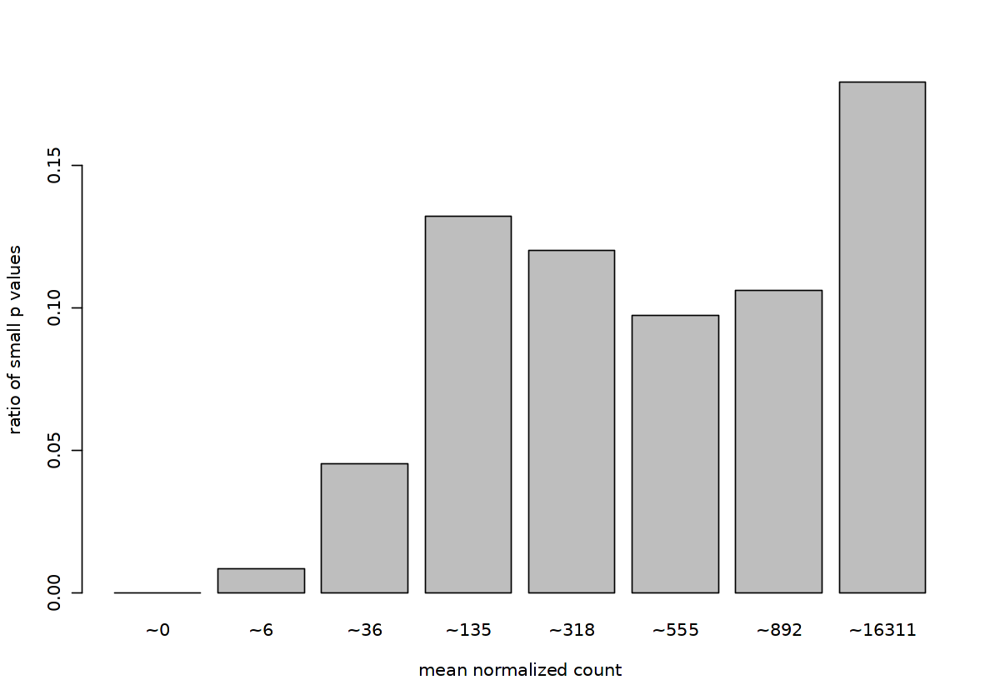

In [223]:
options(repr.plot.width=10, repr.plot.height=7)
qs <- c(0, quantile(res$baseMean[res$baseMean > 0], 0:7/7))
# cut the genes into the bins
bins <- cut(res$baseMean, qs)
# rename the levels of the bins using the middle point
levels(bins) <- paste0("~",round(.5*qs[-1] + .5*qs[-length(qs)]))
# calculate the ratio of $p$ values less than .01 for each bin
ratios <- tapply(res$pvalue, bins, function(p) mean(p < .01, na.rm=TRUE))
# plot these ratios
barplot(ratios, xlab="mean normalized count", ylab="ratio of small p values")

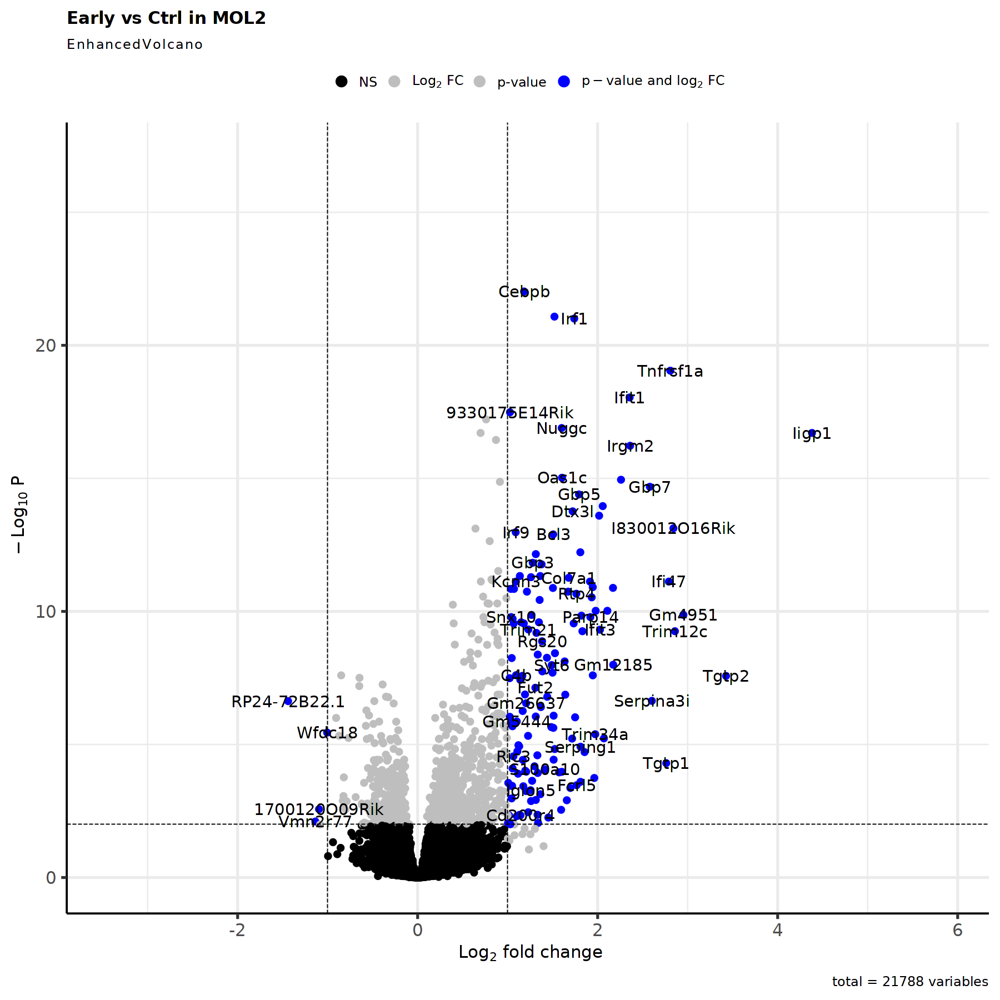

In [224]:
options(repr.plot.width=15, repr.plot.height=15)
#padj<0.001
EnhancedVolcano(res,
    lab = rownames(res),
    x = 'log2FoldChange',
    y = 'padj',
    title = paste0(condition1,' vs ',condition2,' in ', cluster_choice),
    pCutoff = 0.01,
    FCcutoff = 1,
    pointSize = 3.0,
    labSize = 6.0,
    col=c('black', 'grey', 'grey', 'blue'),
    colAlpha = 1)

In [225]:
res <- res[complete.cases(res$padj),]

In [226]:
res_filtered <- res[(res$padj < 0.01 & abs(res$log2FoldChange) > 1 & res$baseMean > 1),]

In [227]:
res_filtered[order(abs(res_filtered$log2FoldChange), decreasing=TRUE),]

log2 fold change (MLE): group_id Early vs Ctrl 
Wald test p-value: group id Early vs Ctrl 
DataFrame with 146 rows and 6 columns
               baseMean log2FoldChange     lfcSE      stat      pvalue        padj
              <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
Iigp1          169.1999        4.38159  0.469368   9.33508 1.00917e-20 1.96367e-17
Tgtp2           33.4235        3.42615  0.535580   6.39708 1.58373e-10 2.66215e-08
Gm4951         138.2805        2.95227  0.407660   7.24198 4.42192e-13 1.34801e-10
Trim12c        100.7192        2.85852  0.407629   7.01256 2.33989e-12 5.53753e-10
I830012O16Rik  115.5258        2.84169  0.341539   8.32025 8.77804e-17 7.51818e-14
...                 ...            ...       ...       ...         ...         ...
Plvap          302.5246        1.02232  0.160656   6.36341 1.97326e-10 3.22646e-08
Klk7            89.0560        1.01569  0.272067   3.73323 1.89041e-04 4.60717e-03
C9              65.7274        1.00706  0

In [228]:
nrow(res_filtered)

[1] 146

In [229]:
HVGs.list[[cluster_choice]][[paste0(condition1,"_",condition2)]] <- rownames(res_filtered)

##### 3.1.2.2 Peak/Early

In [230]:
condition1 = "Peak"
condition2 = "Early"

In [231]:
contrast <- c("group_id", condition1, condition2)

# resultsNames(dds)
res <- results(dds, contrast = contrast, alpha = 0.05)

In [232]:
summary(res)


out of 21788 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 3986, 18%
LFC < 0 (down)     : 2545, 12%
outliers [1]       : 2, 0.0092%
low counts [2]     : 1268, 5.8%
(mean count < 4)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



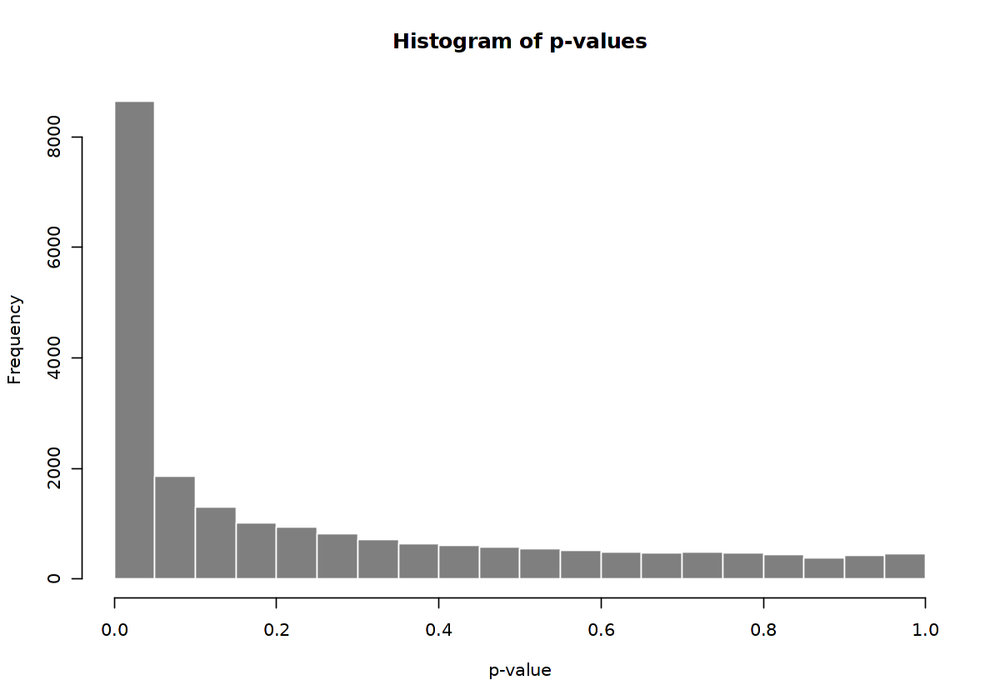

In [233]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$pvalue, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of p-values", xlab="p-value")

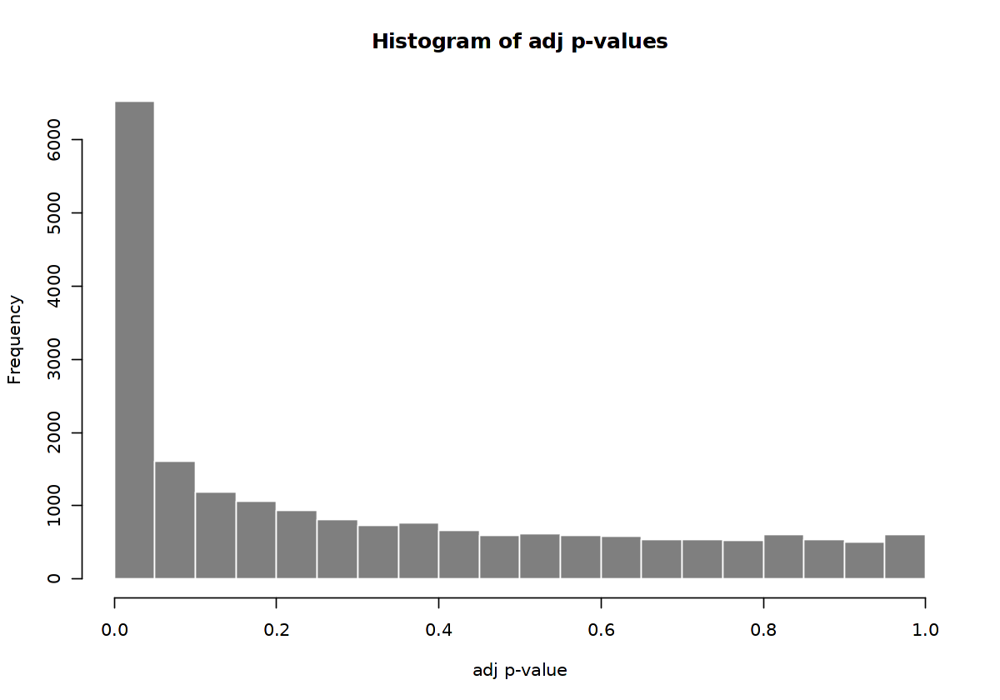

In [234]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$padj, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of adj p-values", xlab="adj p-value")

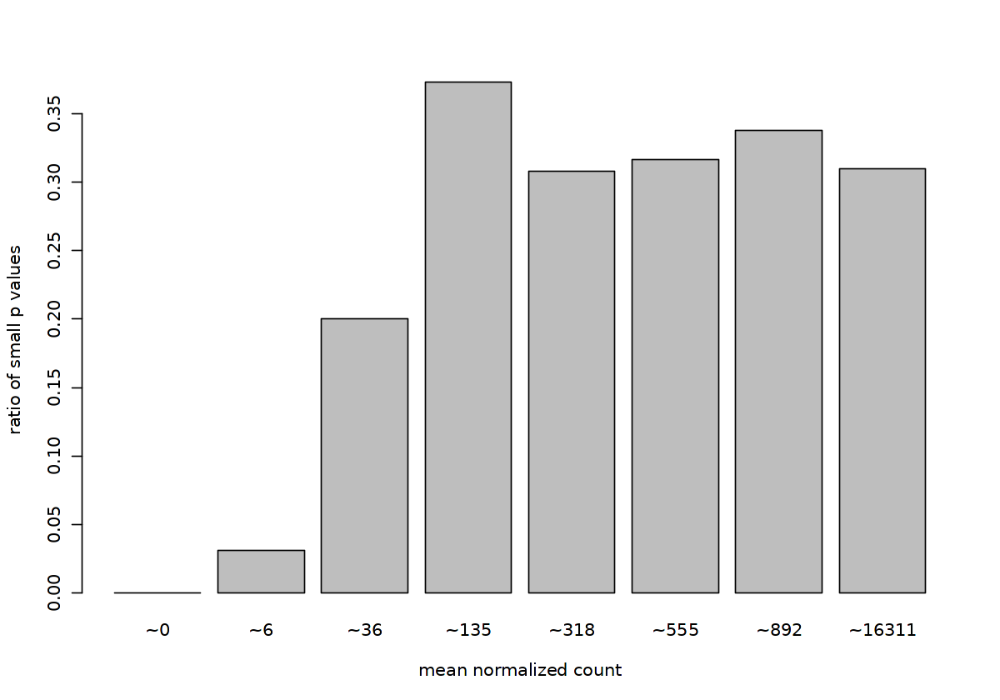

In [235]:
options(repr.plot.width=10, repr.plot.height=7)
qs <- c(0, quantile(res$baseMean[res$baseMean > 0], 0:7/7))
# cut the genes into the bins
bins <- cut(res$baseMean, qs)
# rename the levels of the bins using the middle point
levels(bins) <- paste0("~",round(.5*qs[-1] + .5*qs[-length(qs)]))
# calculate the ratio of $p$ values less than .01 for each bin
ratios <- tapply(res$pvalue, bins, function(p) mean(p < .01, na.rm=TRUE))
# plot these ratios
barplot(ratios, xlab="mean normalized count", ylab="ratio of small p values")

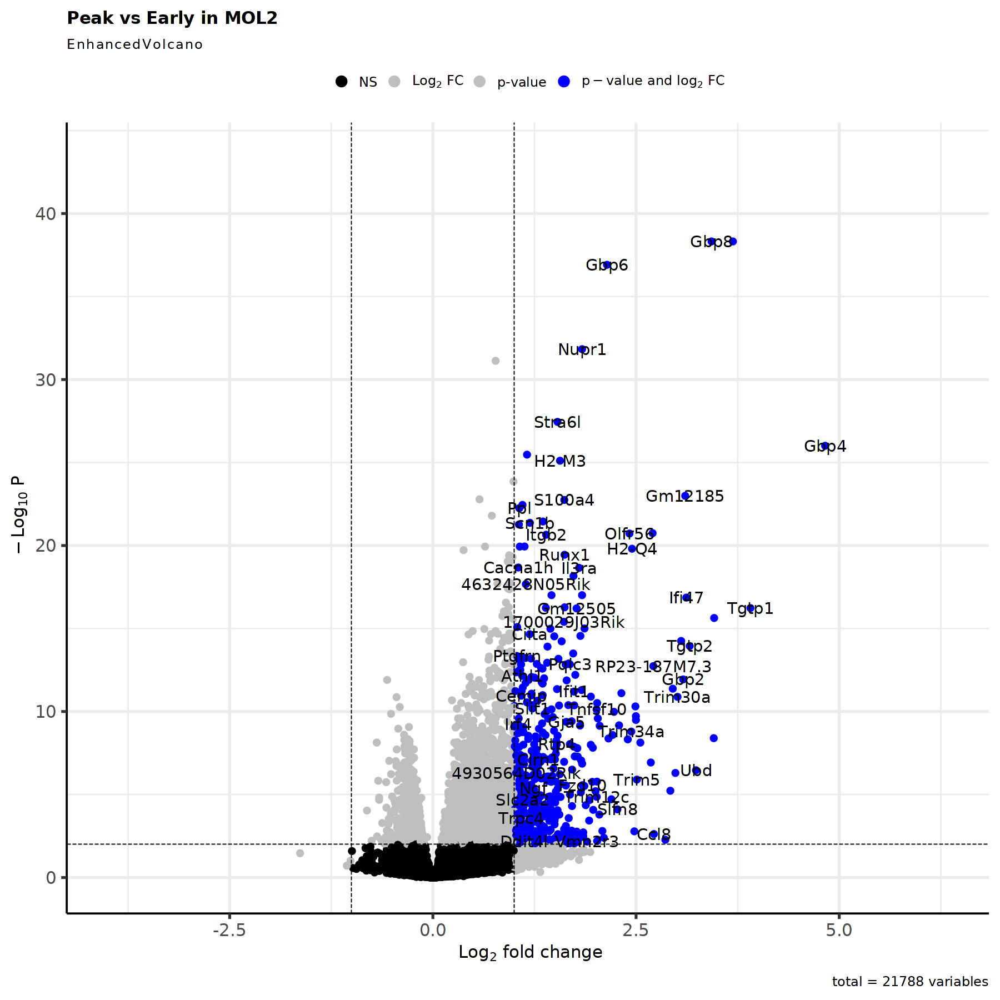

In [236]:
options(repr.plot.width=15, repr.plot.height=15)
#padj<0.001
EnhancedVolcano(res,
    lab = rownames(res),
    x = 'log2FoldChange',
    y = 'padj',
    title = paste0(condition1,' vs ',condition2,' in ', cluster_choice),
    pCutoff = 0.01,
    FCcutoff = 1,
    pointSize = 3.0,
    labSize = 6.0,
    col=c('black', 'grey', 'grey', 'blue'),
    colAlpha = 1)

In [237]:
res <- res[complete.cases(res$padj),]

In [238]:
res_filtered <- res[(res$padj < 0.01 & abs(res$log2FoldChange) > 1 & res$baseMean > 1),]

In [239]:
res_filtered[order(abs(res_filtered$log2FoldChange), decreasing=TRUE),]

log2 fold change (MLE): group_id Peak vs Early 
Wald test p-value: group_id Peak vs Early 
DataFrame with 513 rows and 6 columns
               baseMean log2FoldChange     lfcSE      stat      pvalue        padj
              <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
Gbp4            51.6975        4.82594  0.422598  11.41969 3.33408e-30 9.77266e-27
Tgtp1           32.0498        3.90733  0.431763   9.04971 1.43348e-19 5.88244e-17
Gbp9           121.0515        3.69142  0.268347  13.75613 4.67892e-43 4.80010e-39
Iigp1          169.1999        3.46092  0.389383   8.88823 6.20909e-19 2.31633e-16
F830016B08Rik   12.7609        3.45598  0.528235   6.54250 6.04981e-11 4.02034e-09
...                 ...            ...       ...       ...         ...         ...
Crhr2           90.6361        1.00197  0.230222   4.35218 1.34789e-05 1.79431e-04
4933402J07Rik   53.2919        1.00162  0.272998   3.66895 2.43547e-04 1.89715e-03
Itga5          212.0606        1.00071  0

In [240]:
nrow(res_filtered)

[1] 513

In [241]:
HVGs.list[[cluster_choice]][[paste0(condition1,"_",condition2)]] <- rownames(res_filtered)

##### 3.1.2.3 Late/Early

In [242]:
condition1 = "Late"
condition2 = "Early"

In [243]:
contrast <- c("group_id", condition1, condition2)

# resultsNames(dds)
res <- results(dds, contrast = contrast, alpha = 0.05)

In [244]:
summary(res)


out of 21788 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 1614, 7.4%
LFC < 0 (down)     : 1055, 4.8%
outliers [1]       : 2, 0.0092%
low counts [2]     : 3800, 17%
(mean count < 17)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



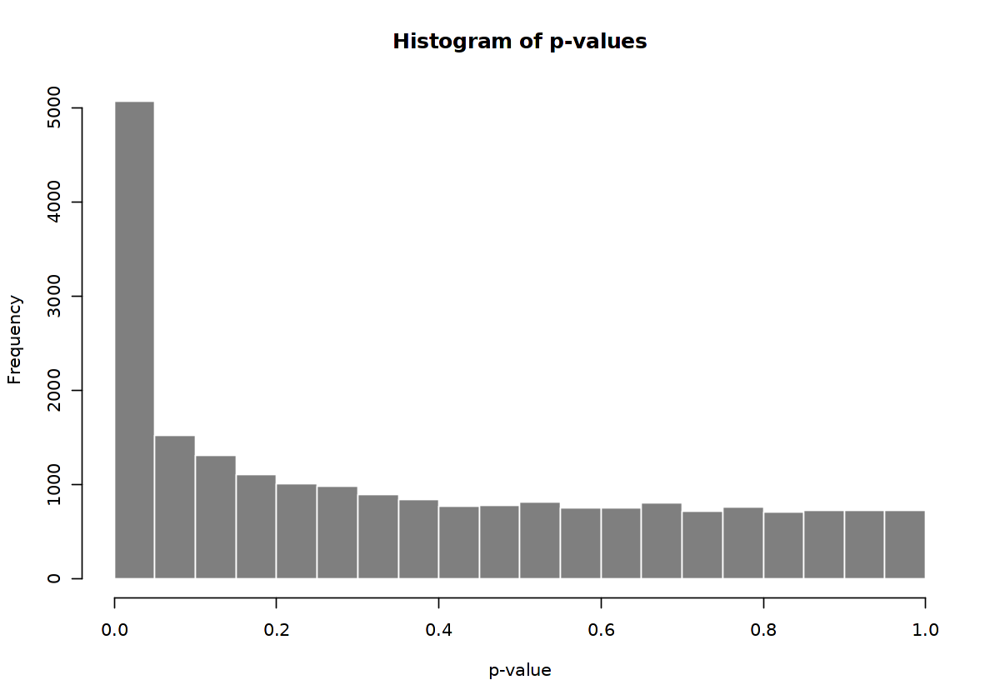

In [245]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$pvalue, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of p-values", xlab="p-value")

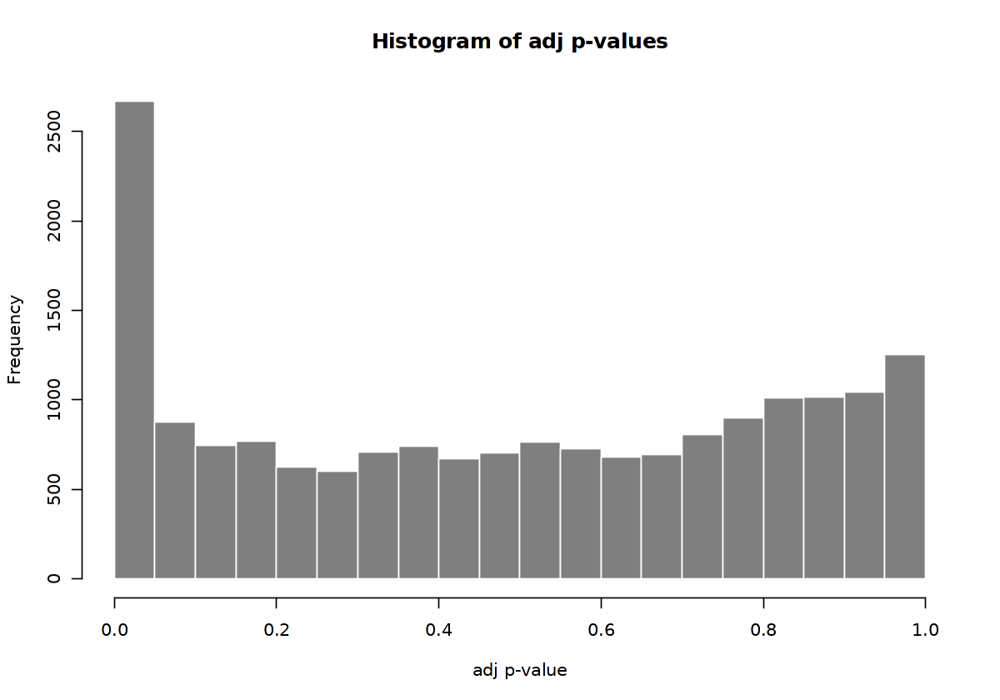

In [246]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$padj, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of adj p-values", xlab="adj p-value")

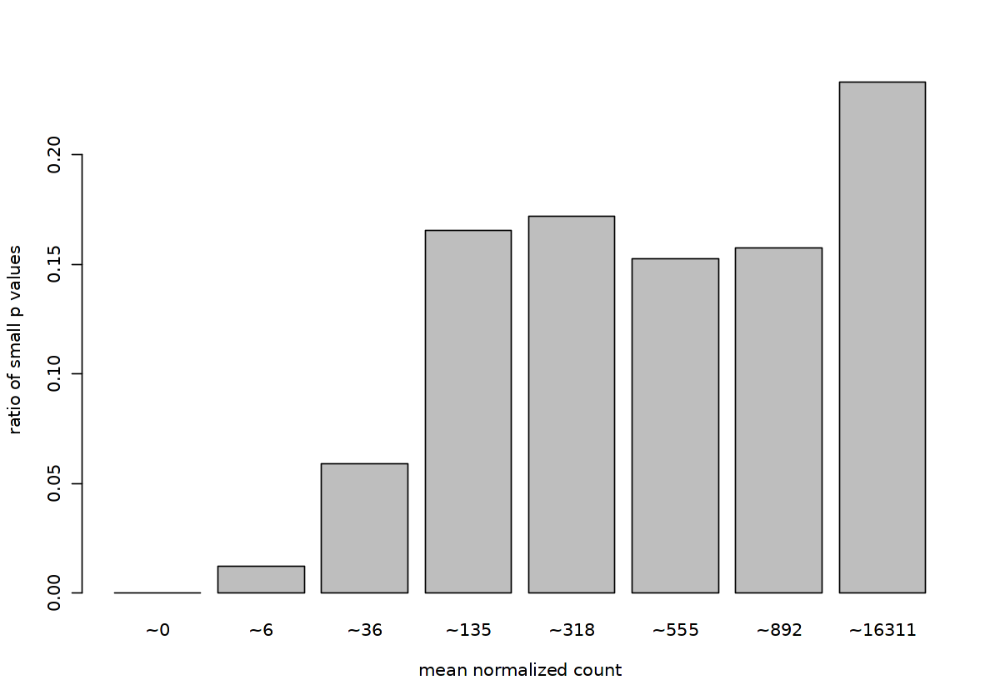

In [247]:
options(repr.plot.width=10, repr.plot.height=7)
qs <- c(0, quantile(res$baseMean[res$baseMean > 0], 0:7/7))
# cut the genes into the bins
bins <- cut(res$baseMean, qs)
# rename the levels of the bins using the middle point
levels(bins) <- paste0("~",round(.5*qs[-1] + .5*qs[-length(qs)]))
# calculate the ratio of $p$ values less than .01 for each bin
ratios <- tapply(res$pvalue, bins, function(p) mean(p < .01, na.rm=TRUE))
# plot these ratios
barplot(ratios, xlab="mean normalized count", ylab="ratio of small p values")

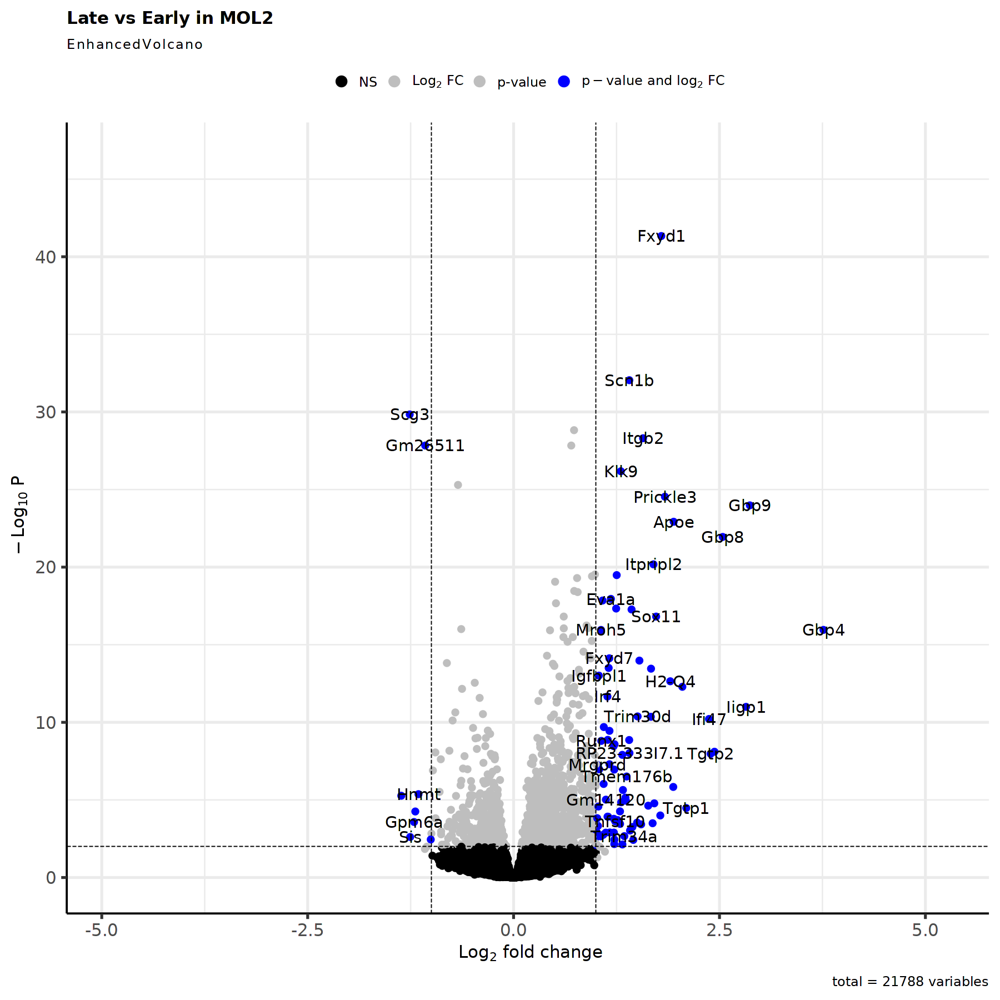

In [248]:
options(repr.plot.width=15, repr.plot.height=15)
#padj<0.001
EnhancedVolcano(res,
    lab = rownames(res),
    x = 'log2FoldChange',
    y = 'padj',
    title = paste0(condition1,' vs ',condition2,' in ', cluster_choice),
    pCutoff = 0.01,
    FCcutoff = 1,
    pointSize = 3.0,
    labSize = 6.0,
    col=c('black', 'grey', 'grey', 'blue'),
    colAlpha = 1)

In [249]:
res <- res[complete.cases(res$padj),]

In [250]:
res_filtered <- res[(res$padj < 0.01 & abs(res$log2FoldChange) > 1 & res$baseMean > 1),]

In [251]:
res_filtered[order(abs(res_filtered$log2FoldChange), decreasing=TRUE),]

log2 fold change (MLE): group_id Late vs Early 
Wald test p-value: group_id Late vs Early 
DataFrame with 94 rows and 6 columns
         baseMean log2FoldChange     lfcSE      stat      pvalue        padj
        <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
Gbp4      51.6975        3.76236  0.417492   9.01180 2.02709e-19 1.10482e-16
Gbp9     121.0515        2.86831  0.261870  10.95318 6.41571e-28 1.04903e-24
Iigp1    169.1999        2.82258  0.373958   7.54787 4.42450e-14 1.00733e-11
Gbp8     143.4010        2.53905  0.241699  10.50499 8.19329e-26 1.13357e-22
Gm4951   138.2805        2.43924  0.372659   6.54549 5.92991e-11 7.84230e-09
...           ...            ...       ...       ...         ...         ...
Mrgprd   165.0396        1.01529  0.163524   6.20882 5.33853e-10 5.48679e-08
Plekhg6   87.3682        1.01228  0.253101   3.99948 6.34805e-05 1.26301e-03
Gprc5c    51.7847        1.01128  0.297783   3.39602 6.83726e-04 8.47519e-03
Hspb8    145.3581        

In [252]:
nrow(res_filtered)

[1] 94

In [253]:
HVGs.list[[cluster_choice]][[paste0(condition1,"_",condition2)]] <- rownames(res_filtered)

##### 3.1.2.4 Peak/Late

In [254]:
condition1 = "Peak"
condition2 = "Late"

In [255]:
contrast <- c("group_id", condition1, condition2)

# resultsNames(dds)
res <- results(dds, contrast = contrast, alpha = 0.05)

In [256]:
summary(res)


out of 21788 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 4824, 22%
LFC < 0 (down)     : 2936, 13%
outliers [1]       : 2, 0.0092%
low counts [2]     : 845, 3.9%
(mean count < 3)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



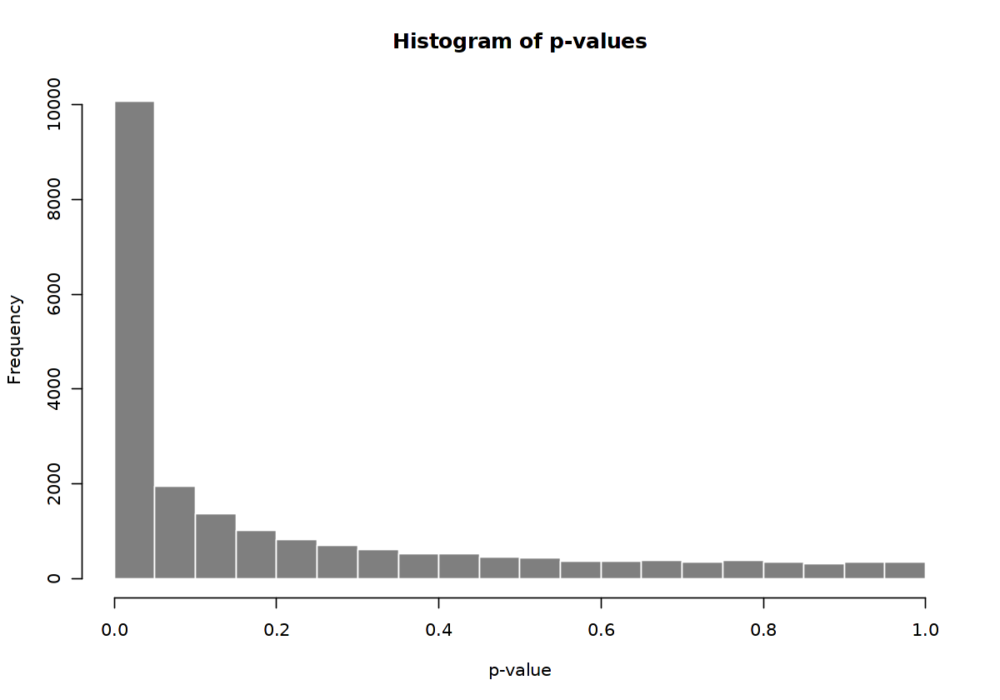

In [257]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$pvalue, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of p-values", xlab="p-value")

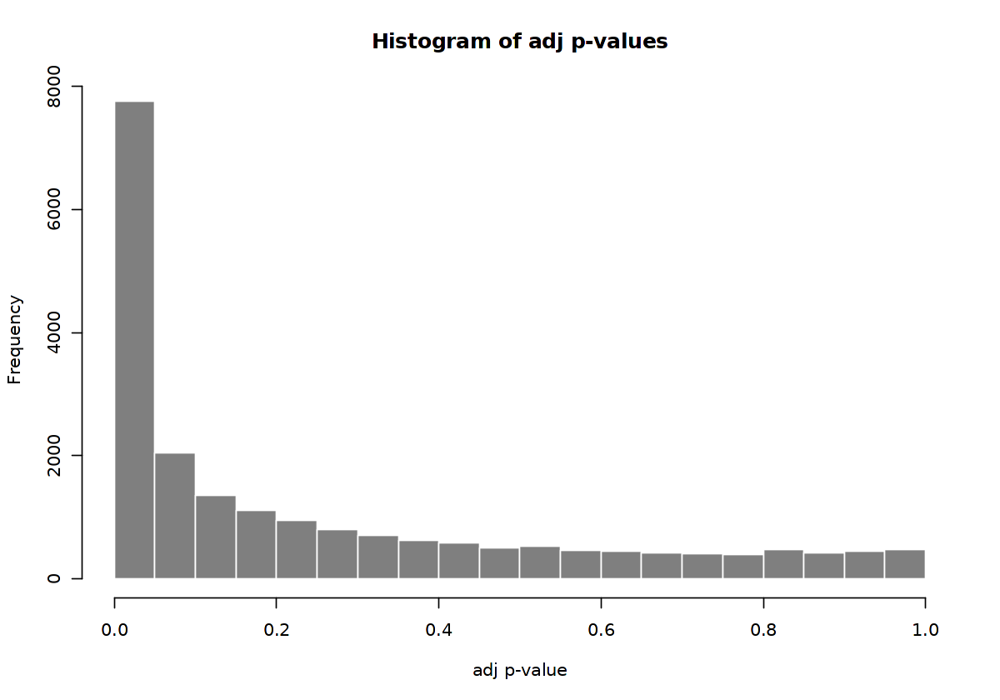

In [258]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$padj, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of adj p-values", xlab="adj p-value")

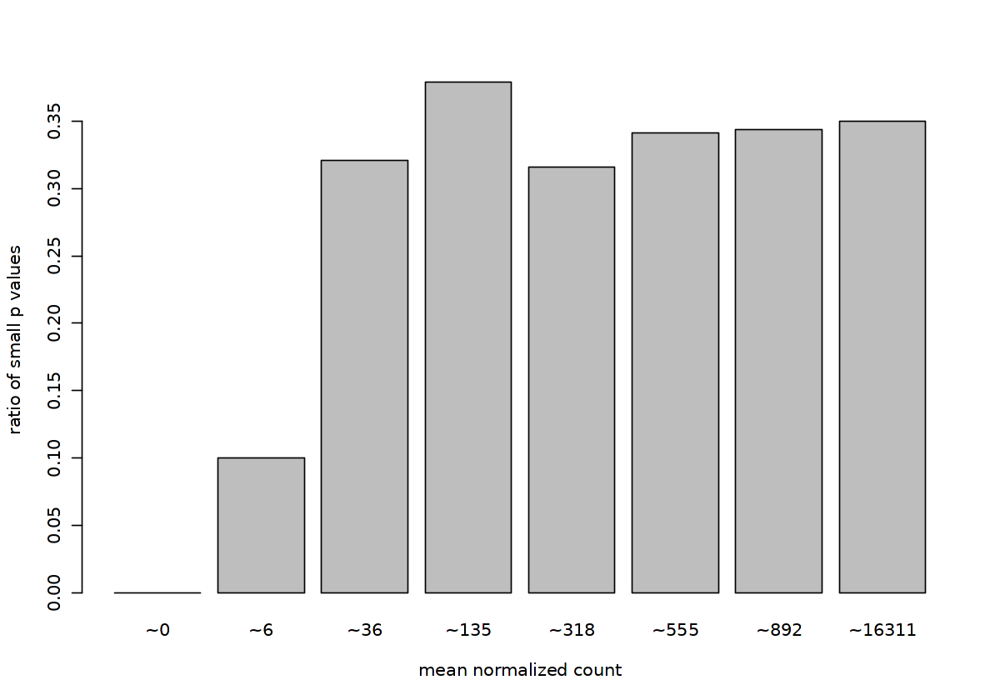

In [259]:
options(repr.plot.width=10, repr.plot.height=7)
qs <- c(0, quantile(res$baseMean[res$baseMean > 0], 0:7/7))
# cut the genes into the bins
bins <- cut(res$baseMean, qs)
# rename the levels of the bins using the middle point
levels(bins) <- paste0("~",round(.5*qs[-1] + .5*qs[-length(qs)]))
# calculate the ratio of $p$ values less than .01 for each bin
ratios <- tapply(res$pvalue, bins, function(p) mean(p < .01, na.rm=TRUE))
# plot these ratios
barplot(ratios, xlab="mean normalized count", ylab="ratio of small p values")

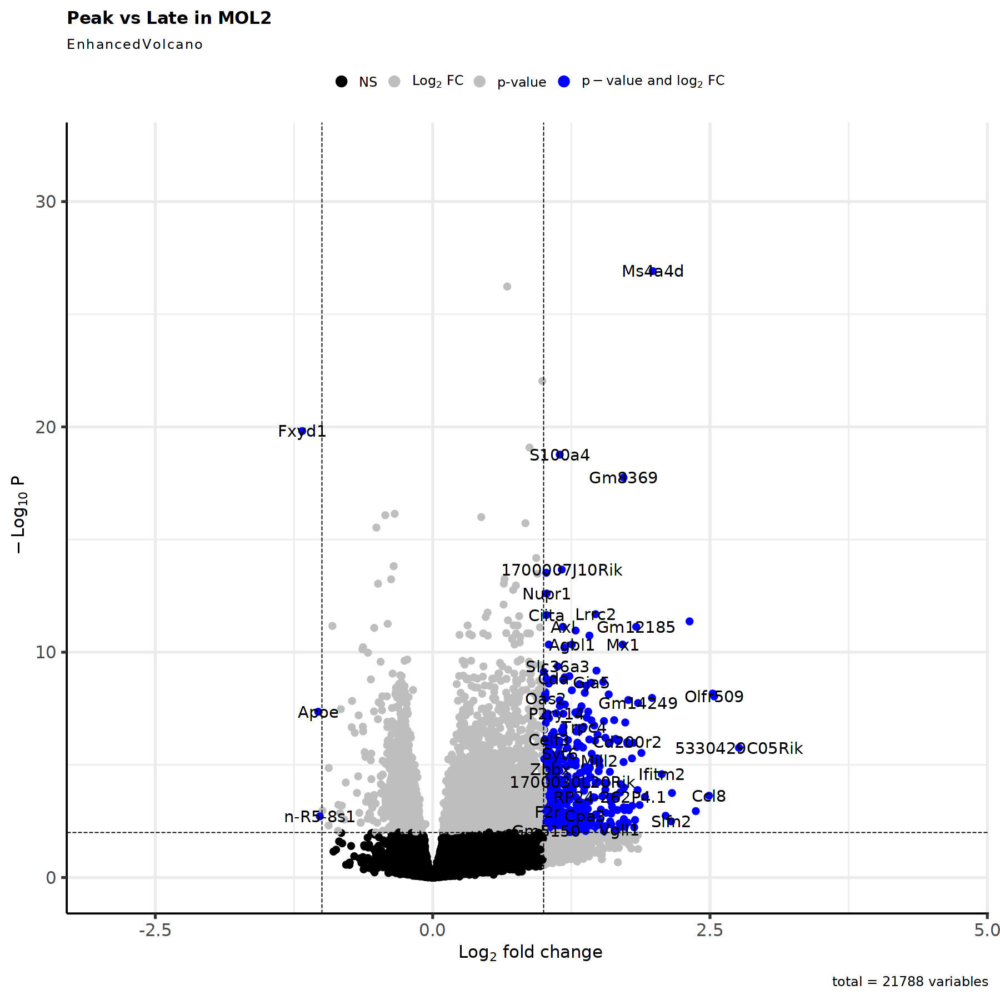

In [260]:
options(repr.plot.width=15, repr.plot.height=15)
#padj<0.001
EnhancedVolcano(res,
    lab = rownames(res),
    x = 'log2FoldChange',
    y = 'padj',
    title = paste0(condition1,' vs ',condition2,' in ', cluster_choice),
    pCutoff = 0.01,
    FCcutoff = 1,
    pointSize = 3.0,
    labSize = 6.0,
    col=c('black', 'grey', 'grey', 'blue'),
    colAlpha = 1)

In [261]:
res <- res[complete.cases(res$padj),]

In [262]:
res_filtered <- res[(res$padj < 0.01 & abs(res$log2FoldChange) > 1 & res$baseMean > 1),]

In [263]:
res_filtered[order(abs(res_filtered$log2FoldChange), decreasing=TRUE),]

log2 fold change (MLE): group_id Peak vs Late 
Wald test p-value: group_id Peak vs Late 
DataFrame with 464 rows and 6 columns
               baseMean log2FoldChange     lfcSE      stat      pvalue        padj
              <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
5330429C05Rik   8.30037        2.76141  0.504043   5.47852 4.28901e-08 1.74400e-06
Olfr509         5.82339        2.53755  0.389706   6.51144 7.44323e-11 9.11513e-09
Ubd             8.31747        2.52392  0.384414   6.56564 5.18091e-11 6.82976e-09
Ccl8            4.43370        2.49120  0.581135   4.28678 1.81283e-05 2.34771e-04
4833407H14Rik   2.70409        2.37215  0.620349   3.82389 1.31361e-04 1.12785e-03
...                 ...            ...       ...       ...         ...         ...
Gm5532          15.0809        1.00526  0.298670   3.36578 7.63282e-04 4.47853e-03
Slitrk1         32.5747        1.00434  0.320382   3.13481 1.71963e-03 8.37069e-03
Als2cr11        27.9222        1.00194  0.2

In [264]:
nrow(res_filtered)

[1] 464

In [265]:
HVGs.list[[cluster_choice]][[paste0(condition1,"_",condition2)]] <- rownames(res_filtered)

##### 3.1.2.5 Summary

In [266]:
listInput_upset <- HVGs.list[[cluster_choice]]
listInput_upset[sapply(listInput_upset, is.null)] <- NULL

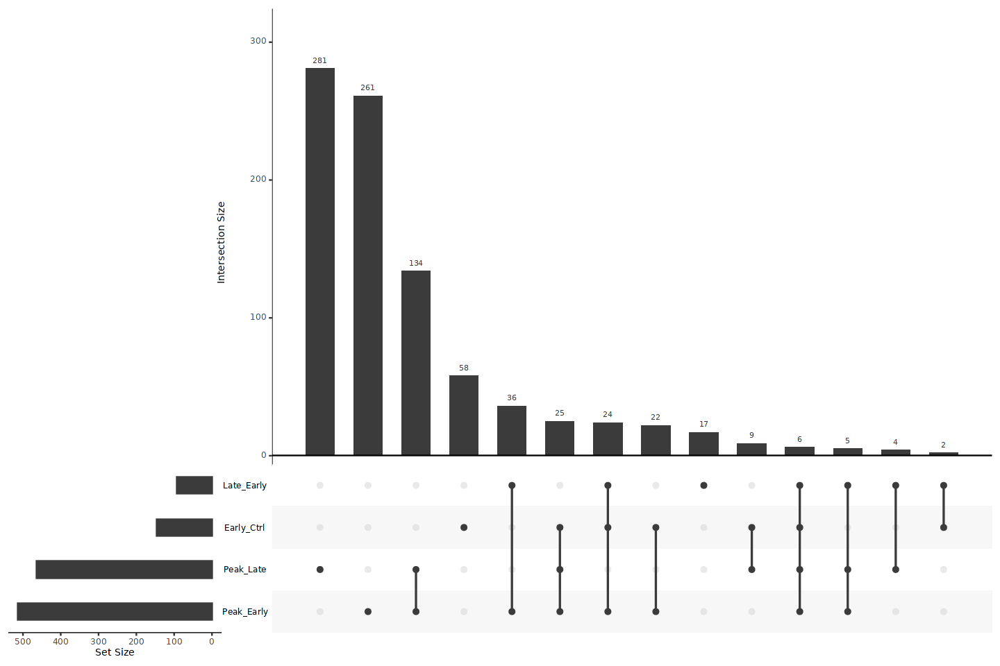

In [267]:
options(repr.plot.width=12, repr.plot.height=8)
upset(fromList(listInput_upset), order.by = "freq")

In [268]:
HVG <- unique(unlist(HVGs.list[[cluster_choice]]))

In [269]:
tmp <- subset(MORNAATACCOL, subset = cellType_OL_merge == cluster_choice)

In [270]:
#Remove sample with low number of cells
keepcells <- rownames(tmp@meta.data[!tmp$orig.ident %in% (names(table_sample_low)),])
tmp <- subset(tmp, cells=keepcells)

In [271]:
#Remove timepoint with low number of cells
keepcells <- rownames(tmp@meta.data[!tmp$orig.ident_merge %in% (names(table_group_low)),])
tmp <- subset(tmp, cells=keepcells)

In [272]:
DefaultAssay(tmp) <- "GenePromAcc"

In [273]:
tmp <- NormalizeData(tmp, normalization.method = "LogNormalize", scale.factor = 10000, margin = 1, verbose = TRUE)

Performing log-normalization
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|


In [274]:
tmp <- ScaleData(tmp, features=rownames(tmp))

Centering and scaling data matrix

  |==========================================================================================| 100%


In [275]:
DefaultAssay(tmp) <- "RNA"

In [276]:
tmp <- NormalizeData(tmp, normalization.method = "LogNormalize", scale.factor = 10000, margin = 1, verbose = TRUE)

Performing log-normalization
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|


In [277]:
DefaultAssay(tmp) <- "GenePromAcc"

In [278]:
tmp$orig.ident <- factor(x = tmp$orig.ident, levels = names(orig.ident_colors)[!names(orig.ident_colors) %in% names(table_sample_low)])
tmp$orig.ident_merge <- factor(x = tmp$orig.ident_merge, levels = names(orig.ident_merge_colors)[!names(orig.ident_merge_colors) %in% names(table_group_low)])

In [279]:
Idents(object = tmp) <- "orig.ident_merge"

Warning message:
"CombinePlots is being deprecated. Plots should now be combined using the patchwork system."


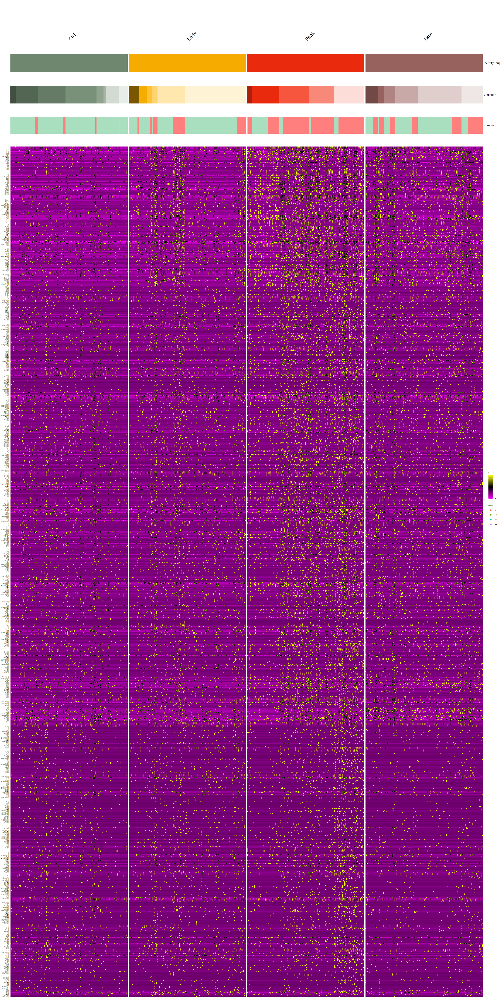

In [280]:
options(repr.plot.width=25, repr.plot.height=50)
DoMultiBarHeatmap(
    subset(tmp, downsample = 200),
    features = HVG,
    cells = NULL,
    group.by = "orig.ident_merge",
    additional.group.by = c("orig.ident", "Immune"),
    additional.group.sort.by = c("orig.ident", "Immune"),
    cols.use = list(orig.ident_merge=orig.ident_merge_colors, orig.ident=orig.ident_colors, Immune=immune_colors),
    group.bar = TRUE,
    disp.min = -2.5,
    disp.max = NULL,
    layer = "scale.data",
    assay = "GenePromAcc",
    label = TRUE,
    size = 5.5,
    hjust = 0,
    angle = 45,
    raster = TRUE,
    draw.lines = TRUE,
    lines.width = NULL,
    group.bar.height = 0.02,
    combine = TRUE
    ) + theme(text = element_text(size = 4))

In [281]:
gene_list <- HVG

In [282]:
Idents(object = tmp) <- "orig.ident_merge"

In [283]:
sample_names <- levels(tmp$orig.ident)

In [284]:
tmp_sample_markers <- as.data.frame(AggregateExpression(tmp, assays = "GenePromAcc", group.by = "orig.ident", normalization.method = "LogNormalize", scale.factor = 10000, return.seurat = TRUE)[["GenePromAcc"]]$data[gene_list,])

Centering and scaling data matrix

  |==========================================================================================| 100%
  |==========================================================================================| 100%


In [285]:
tmp_sample_markers_RNA <- data.frame(matrix(0L, ncol=length(sample_names), nrow=length(gene_list), dimnames=list(gene_list, sample_names)))

In [286]:
gene_list_RNA <- gene_list[gene_list %in% rownames(tmp[['RNA']])]

In [287]:
genes0 <- names(rowSums(tmp[['RNA']]@counts[gene_list_RNA,])[rowSums(tmp[['RNA']]@counts[gene_list_RNA,]) == 0])

In [288]:
gene_list_RNA <- gene_list_RNA[!gene_list_RNA %in% genes0]

In [289]:
tmp_sample_markers_RNA_sub <- as.data.frame(AggregateExpression(tmp, assays = "RNA", group.by = "orig.ident", normalization.method = "LogNormalize", scale.factor = 10000, return.seurat = TRUE)[["RNA"]]$data[gene_list_RNA,])

  |==========================================================================================| 100%


In [290]:
matrix <- tmp_sample_markers/do.call(pmax, tmp_sample_markers)

In [291]:
paletteLength <- 50
myColor <- colorRampPalette(c("#FFBCB5", "#432371"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

In [292]:
plot_height <- ifelse(as.integer(nrow(matrix)/20)<=5, 5, as.integer(nrow(matrix)/20))

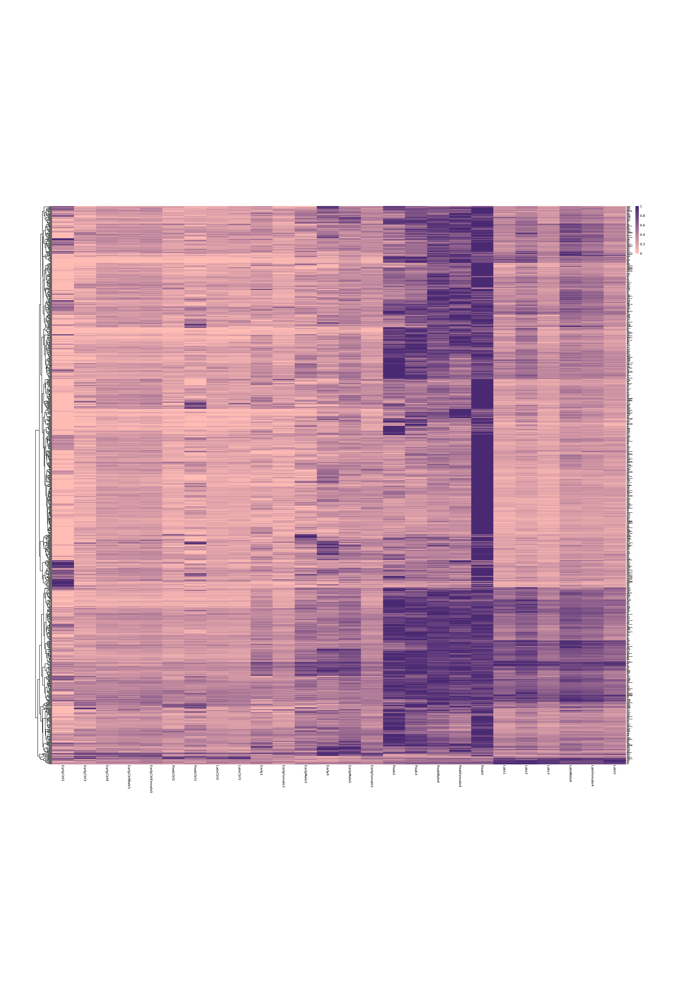

In [293]:
options(repr.plot.width=30, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=TRUE)
ph

In [294]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_",cluster_choice,"_sep_pseudobulk.pdf"), width=30, height=plot_height)

png 
  2

In [295]:
gene_list <- gene_list[ph$tree_row$order]

In [296]:
tmp_sample_markers_mean <- data.frame(matrix(0L, ncol=1, nrow=length(gene_list), dimnames=list(gene_list, "Mean_Log2Acc")))

In [297]:
tmp_sample_markers_mean[rownames(tmp_sample_markers),"Mean_Log2Acc"] <- rowMeans(tmp_sample_markers)

In [298]:
matrix <- tmp_sample_markers_mean

In [299]:
paletteLength <- 50
myColor <- colorRampPalette(c("white", "black"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

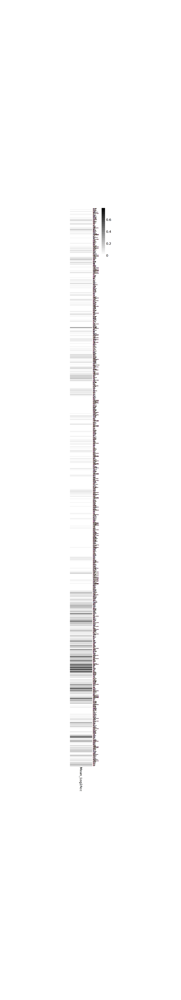

In [300]:
options(repr.plot.width=8, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [301]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_",cluster_choice,"_sep_pseudobulk_mean.pdf"), width=7, height=plot_height)

png 
  2

In [302]:
tmp_sample_markers_zscore <- t(apply(tmp_sample_markers[gene_list,], 1, scale))
colnames(tmp_sample_markers_zscore) <- paste0("zscore_", sample_names)
matrix <- tmp_sample_markers_zscore

In [303]:
paletteLength <- 100
myColor <- colorRampPalette(c("blue", "white", "red"))(paletteLength/2)
myBreaks <- c(seq(-max(abs(matrix)), max(abs(matrix)), length.out=floor(paletteLength/2)))
myColor[(paletteLength/4):((paletteLength/4)+1)] <- c("#FFFFFF", "#FFFFFF")

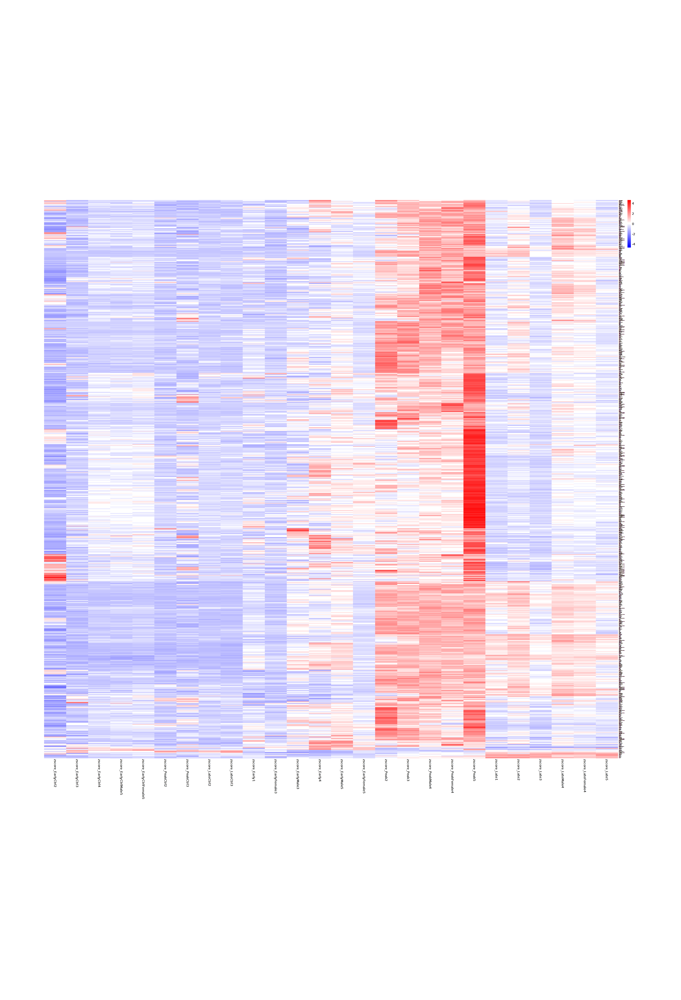

In [304]:
options(repr.plot.width=30, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [305]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_",cluster_choice,"_sep_pseudobulk_zscore.pdf"), width=30, height=plot_height)

png 
  2

In [306]:
matrix <- tmp_sample_markers_RNA
matrix_sub <- tmp_sample_markers_RNA_sub

In [307]:
matrix_sub <- matrix_sub/do.call(pmax, matrix_sub)

In [308]:
is.nan.data.frame <- function(x)
do.call(cbind, lapply(x, is.nan))

matrix_sub[is.nan.data.frame(matrix_sub)] <- 0

In [309]:
matrix[rownames(matrix_sub),] <- matrix_sub
matrix <- matrix[gene_list,]

In [310]:
paletteLength <- 50
myColor <- colorRampPalette(c("#FFFFB3", "#5E3719"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

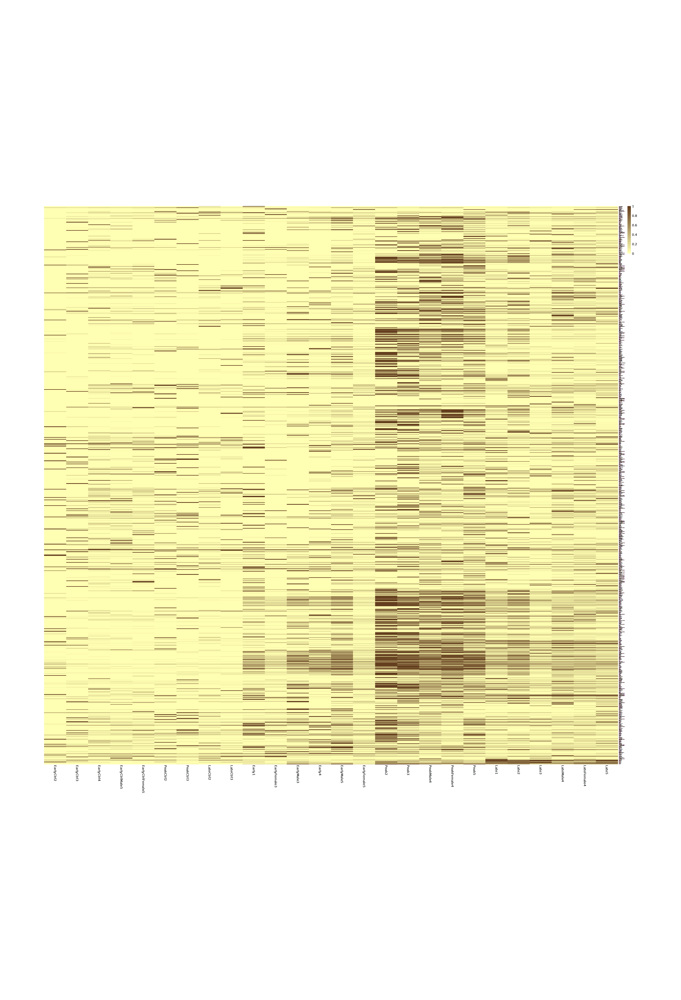

In [311]:
options(repr.plot.width=30, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [312]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_Exp_",cluster_choice,"_sep_pseudobulk.pdf"), width=30, height=plot_height)

png 
  2

In [313]:
tmp_sample_markers_RNA_mean <- data.frame(matrix(0L, ncol=1, nrow=length(gene_list), dimnames=list(gene_list, "Mean_Log2Exp")))

In [314]:
tmp_sample_markers_RNA_mean[rownames(tmp_sample_markers_RNA_sub),"Mean_Log2Exp"] <- rowMeans(tmp_sample_markers_RNA_sub)

In [315]:
matrix <- tmp_sample_markers_RNA_mean

In [316]:
is.nan.data.frame <- function(x)
do.call(cbind, lapply(x, is.na))

matrix[is.na.data.frame(matrix)] <- 0

In [317]:
paletteLength <- 50
myColor <- colorRampPalette(c("white", "black"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

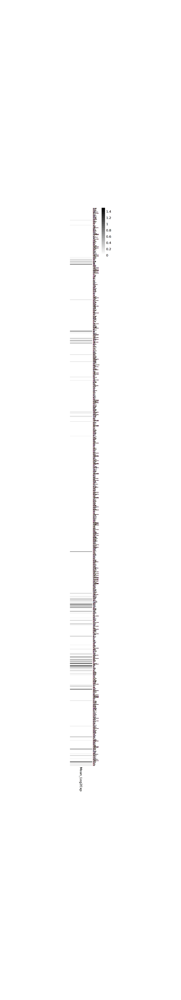

In [318]:
options(repr.plot.width=8, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [319]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_Exp_",cluster_choice,"_sep_pseudobulk_mean.pdf"), width=7, height=plot_height)

png 
  2

In [320]:
tmp_sample_markers_RNA[rownames(tmp_sample_markers_RNA_sub),] <- tmp_sample_markers_RNA_sub

In [321]:
tmp_sample_markers_RNA_zscore <- t(apply(tmp_sample_markers_RNA[gene_list,], 1, scale))
colnames(tmp_sample_markers_RNA_zscore) <- paste0("zscore_", sample_names)
matrix <- tmp_sample_markers_RNA_zscore

In [322]:
is.nan.data.frame <- function(x)
do.call(cbind, lapply(x, is.na))

matrix[is.na.data.frame(matrix)] <- 0

In [323]:
paletteLength <- 100
myColor <- colorRampPalette(c("blue", "white", "red"))(paletteLength/2)
myBreaks <- c(seq(-max(abs(matrix)), max(abs(matrix)), length.out=floor(paletteLength/2)))
myColor[(paletteLength/4):((paletteLength/4)+1)] <- c("#FFFFFF", "#FFFFFF")

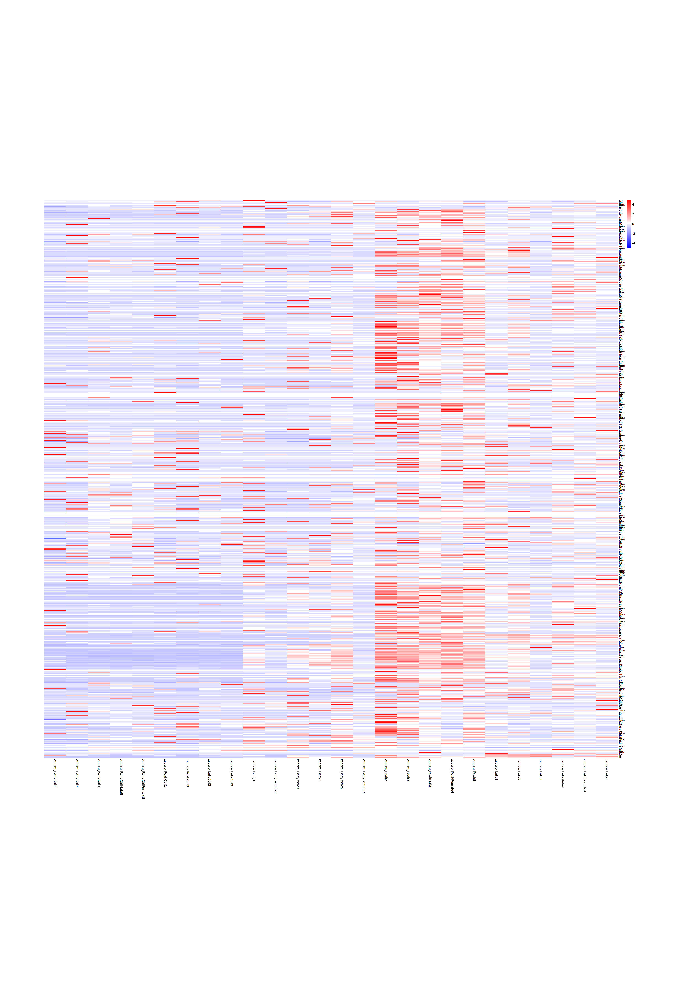

In [324]:
options(repr.plot.width=30, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [325]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_Exp_",cluster_choice,"_sep_pseudobulk_zscore.pdf"), width=30, height=plot_height)

png 
  2

In [326]:
gene_list <- HVG

In [327]:
sample_names <- levels(tmp$orig.ident_merge)

In [328]:
tmp_sample_markers <- as.data.frame(AggregateExpression(tmp, assays = "GenePromAcc", group.by = "orig.ident_merge", normalization.method = "LogNormalize", scale.factor = 10000, return.seurat = TRUE)[["GenePromAcc"]]$data[gene_list,])

Centering and scaling data matrix

  |==========================================================================================| 100%
  |==========================================================================================| 100%


In [329]:
tmp_sample_markers_RNA <- data.frame(matrix(0L, ncol=length(sample_names), nrow=length(gene_list), dimnames=list(gene_list, sample_names)))

In [330]:
gene_list_RNA <- gene_list[gene_list %in% rownames(tmp[['RNA']])]

In [331]:
genes0 <- names(rowSums(tmp[['RNA']]@counts[gene_list_RNA,])[rowSums(tmp[['RNA']]@counts[gene_list_RNA,]) == 0])

In [332]:
gene_list_RNA <- gene_list_RNA[!gene_list_RNA %in% genes0]

In [333]:
tmp_sample_markers_RNA_sub <- as.data.frame(AggregateExpression(tmp, assays = "RNA", group.by = "orig.ident_merge", normalization.method = "LogNormalize", scale.factor = 10000, return.seurat = TRUE)[["RNA"]]$data[gene_list_RNA,])

  |==========================================================================================| 100%


In [334]:
matrix <- tmp_sample_markers/do.call(pmax, tmp_sample_markers)

In [335]:
paletteLength <- 50
myColor <- colorRampPalette(c("#FFBCB5", "#432371"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

In [336]:
plot_height <- ifelse(as.integer(nrow(matrix)/20)<=5, 5, as.integer(nrow(matrix)/20))

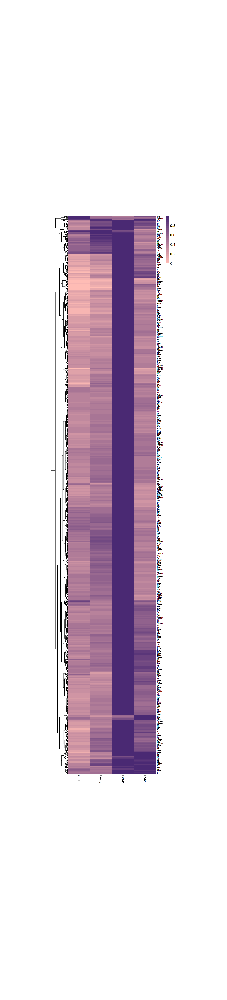

In [337]:
options(repr.plot.width=10, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=TRUE)
ph

In [338]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_",cluster_choice,"_pseudobulk.pdf"), width=10, height=plot_height)

png 
  2

In [339]:
gene_list <- gene_list[ph$tree_row$order]

In [340]:
tmp_sample_markers_mean <- data.frame(matrix(0L, ncol=1, nrow=length(gene_list), dimnames=list(gene_list, "Mean_Log2Acc")))

In [341]:
tmp_sample_markers_mean[rownames(tmp_sample_markers),"Mean_Log2Acc"] <- rowMeans(tmp_sample_markers)

In [342]:
matrix <- tmp_sample_markers_mean

In [343]:
paletteLength <- 50
myColor <- colorRampPalette(c("white", "black"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

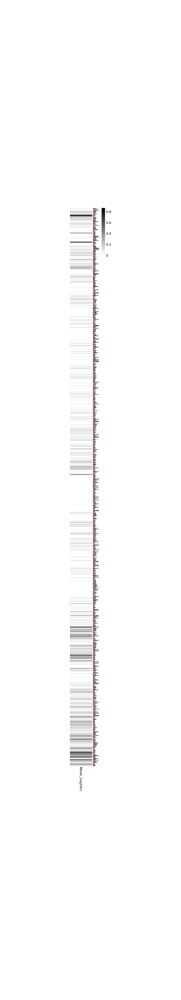

In [344]:
options(repr.plot.width=8, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [345]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_",cluster_choice,"_pseudobulk_mean.pdf"), width=8, height=plot_height)

png 
  2

In [346]:
tmp_sample_markers_zscore <- t(apply(tmp_sample_markers[gene_list,], 1, scale))
colnames(tmp_sample_markers_zscore) <- paste0("zscore_", sample_names)
matrix <- tmp_sample_markers_zscore

In [347]:
paletteLength <- 100
myColor <- colorRampPalette(c("blue", "white", "red"))(paletteLength/2)
myBreaks <- c(seq(-max(abs(matrix)), max(abs(matrix)), length.out=floor(paletteLength/2)))
myColor[(paletteLength/4):((paletteLength/4)+1)] <- c("#FFFFFF", "#FFFFFF")

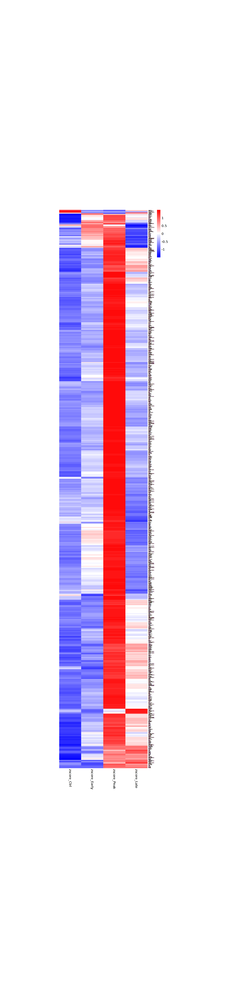

In [348]:
options(repr.plot.width=10, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [349]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_",cluster_choice,"_pseudobulk_zscore.pdf"), width=10, height=plot_height)

png 
  2

In [350]:
matrix <- tmp_sample_markers_RNA
matrix_sub <- tmp_sample_markers_RNA_sub

In [351]:
matrix_sub <- matrix_sub/do.call(pmax, matrix_sub)

In [352]:
is.nan.data.frame <- function(x)
do.call(cbind, lapply(x, is.nan))

matrix_sub[is.nan.data.frame(matrix_sub)] <- 0

In [353]:
matrix[rownames(matrix_sub),] <- matrix_sub
matrix <- matrix[gene_list,]

In [354]:
paletteLength <- 50
myColor <- colorRampPalette(c("#FFFFB3", "#5E3719"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

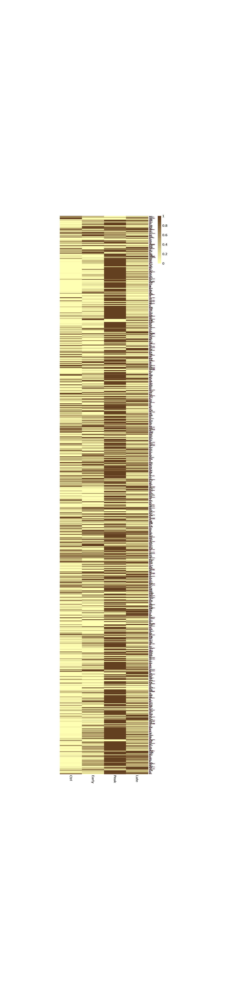

In [355]:
options(repr.plot.width=10, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [356]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_Exp_",cluster_choice,"_pseudobulk.pdf"), width=10, height=plot_height)

png 
  2

In [357]:
tmp_sample_markers_RNA_mean <- data.frame(matrix(0L, ncol=1, nrow=length(gene_list), dimnames=list(gene_list, "Mean_Log2Exp")))

In [358]:
tmp_sample_markers_RNA_mean[rownames(tmp_sample_markers_RNA_sub),"Mean_Log2Exp"] <- rowMeans(tmp_sample_markers_RNA_sub)

In [359]:
matrix <- tmp_sample_markers_RNA_mean

In [360]:
is.nan.data.frame <- function(x)
do.call(cbind, lapply(x, is.na))

matrix[is.na.data.frame(matrix)] <- 0

In [361]:
paletteLength <- 50
myColor <- colorRampPalette(c("white", "black"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

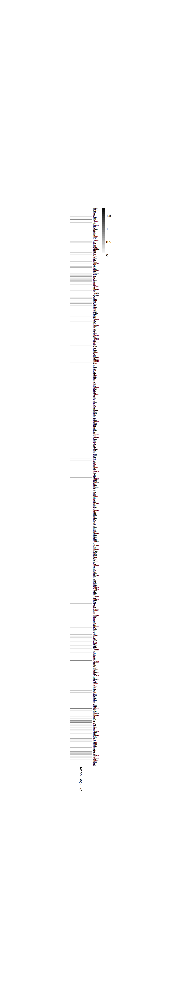

In [362]:
options(repr.plot.width=8, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [363]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_Exp_",cluster_choice,"_pseudobulk_mean.pdf"), width=7, height=plot_height)

png 
  2

In [364]:
tmp_sample_markers_RNA[rownames(tmp_sample_markers_RNA_sub),] <- tmp_sample_markers_RNA_sub

In [365]:
tmp_sample_markers_RNA_zscore <- t(apply(tmp_sample_markers_RNA[gene_list,], 1, scale))
colnames(tmp_sample_markers_RNA_zscore) <- paste0("zscore_", sample_names)
matrix <- tmp_sample_markers_RNA_zscore

In [366]:
is.nan.data.frame <- function(x)
do.call(cbind, lapply(x, is.na))

matrix[is.na.data.frame(matrix)] <- 0

In [367]:
paletteLength <- 100
myColor <- colorRampPalette(c("blue", "white", "red"))(paletteLength/2)
myBreaks <- c(seq(-max(abs(matrix)), max(abs(matrix)), length.out=floor(paletteLength/2)))
myColor[(paletteLength/4):((paletteLength/4)+1)] <- c("#FFFFFF", "#FFFFFF")

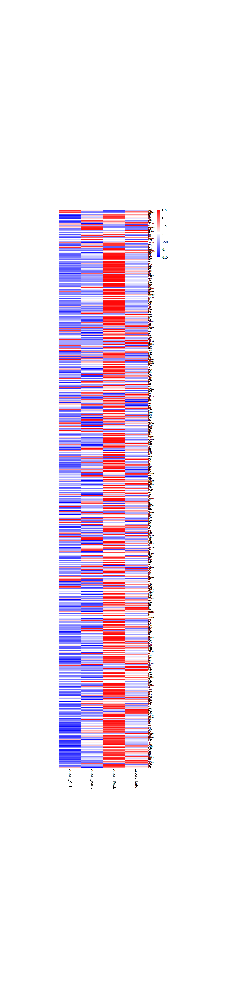

In [368]:
options(repr.plot.width=10, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [369]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_Exp_",cluster_choice,"_pseudobulk_zscore.pdf"), width=10, height=plot_height)

png 
  2

#### 3.1.3 OPC

In [370]:
cluster_choice <- "OPC"

In [371]:
HVGs.list[[cluster_choice]] <- list()

In [372]:
table_sample_low <- table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$sample_id)[cluster_choice,][table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$sample_id)[cluster_choice,] <= 5]
table_sample_low

sample_keep <- names(orig.ident_colors)[!names(orig.ident_colors) %in% names(table_sample_low)]

EarlyCtrl2   EarlyCtrl3    PeakCtrl3 EarlyFemale3 
           1            2            4            1

In [373]:
table_group_low <-table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$group_id)[cluster_choice,][table(MORNAATACCOL_sce$cluster_id, MORNAATACCOL_sce$group_id)[cluster_choice,] <= 30]
table_group_low

group_keep <- names(orig.ident_merge_colors)[!names(orig.ident_merge_colors) %in% names(table_group_low)]

named integer(0)

In [374]:
cluster_metadata <- metadata[which(metadata$cluster_id == cluster_choice), ]

# Assign the rownames of the metadata to be the sample IDs
rownames(cluster_metadata) <- cluster_metadata$sample_id

In [376]:
#Remove sample and timepoint with low counts (sample<=5, timepoint<=30)
cluster_metadata <- cluster_metadata[(cluster_metadata$sample_id %in% sample_keep & cluster_metadata$group_id %in% group_keep),]

new_group_levels <- levels(cluster_metadata$group_id)[levels(cluster_metadata$group_id) %in% group_keep]
cluster_metadata$group_id <- droplevels(cluster_metadata$group_id)
levels(cluster_metadata$group_id) <- new_group_levels

In [377]:
# Subset the counts to only this cluster
counts <- pb[[cluster_choice]]

cluster_counts <- data.frame(counts[, which(colnames(counts) %in% rownames(cluster_metadata))])

# Check that all of the row names of the metadata are the same and in the same order as the column names of the counts in order to use as input to DESeq2
all(rownames(cluster_metadata) == colnames(cluster_counts))

[1] TRUE

In [378]:
dds <- DESeqDataSetFromMatrix(cluster_counts, colData = cluster_metadata, design = ~ group_id + debris_id)

converting counts to integer mode

Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


In [379]:
# Transform counts for data visualization
rld <- rlog(dds, blind=TRUE)

using ntop=500 top features by variance



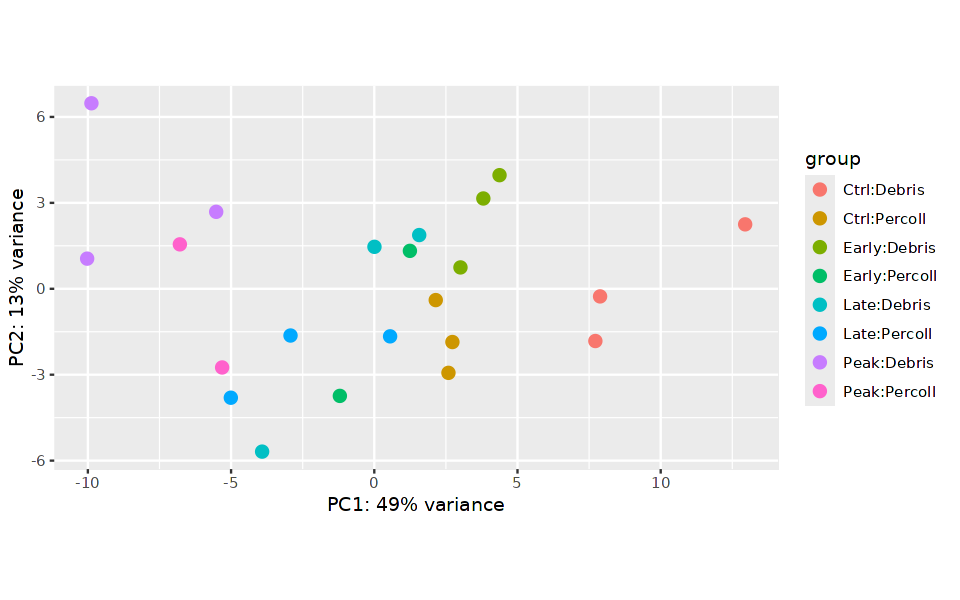

In [380]:
# Plot PCA
options(repr.plot.width=8, repr.plot.height=5)
DESeq2::plotPCA(rld, intgroup = c("group_id", "debris_id"))

In [381]:
# Extract the rlog matrix from the object and compute pairwise correlation values
rld_mat <- assay(rld)
rld_cor <- cor(rld_mat)

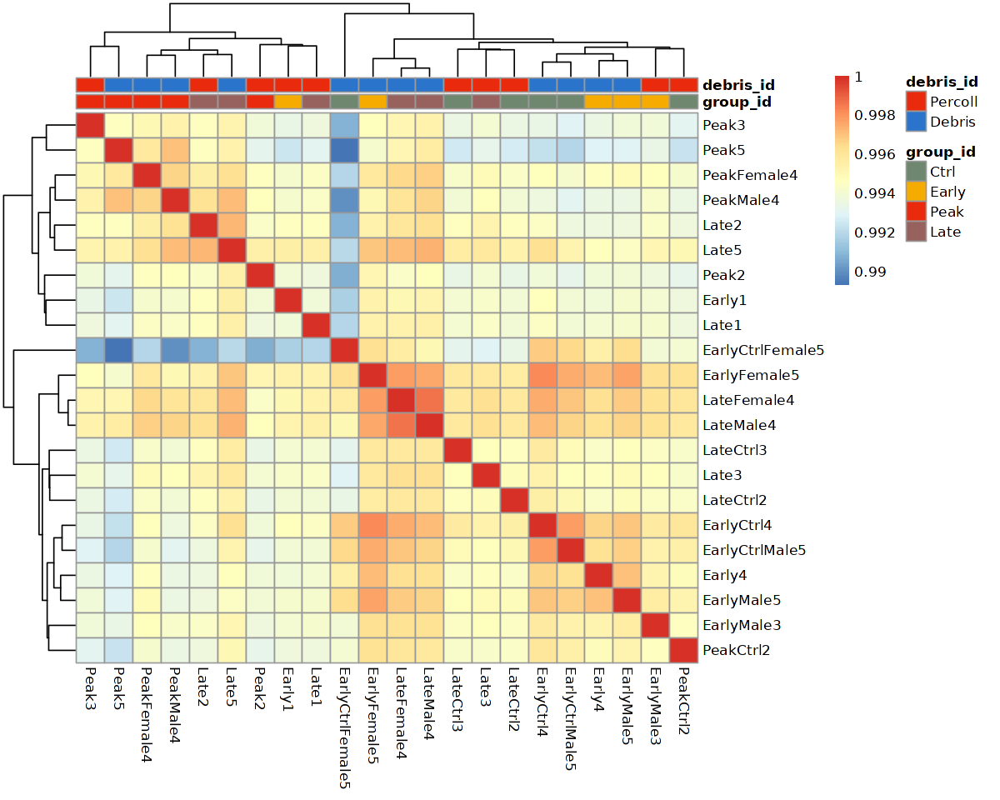

In [382]:
# Plot heatmap
options(repr.plot.width=10, repr.plot.height=8)
pheatmap(rld_cor, annotation = cluster_metadata[, c("group_id","debris_id"), drop=F], annotation_colors = list(group_id=orig.ident_merge_colors, debris_id=debris_colors))

In [383]:
# Run DESeq2 differential expression analysis
dds <- DESeq(dds)

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



In [384]:
libsize = data.frame(x=sizeFactors(dds), y=colSums(assay(dds)))

`geom_smooth()` using formula = 'y ~ x'


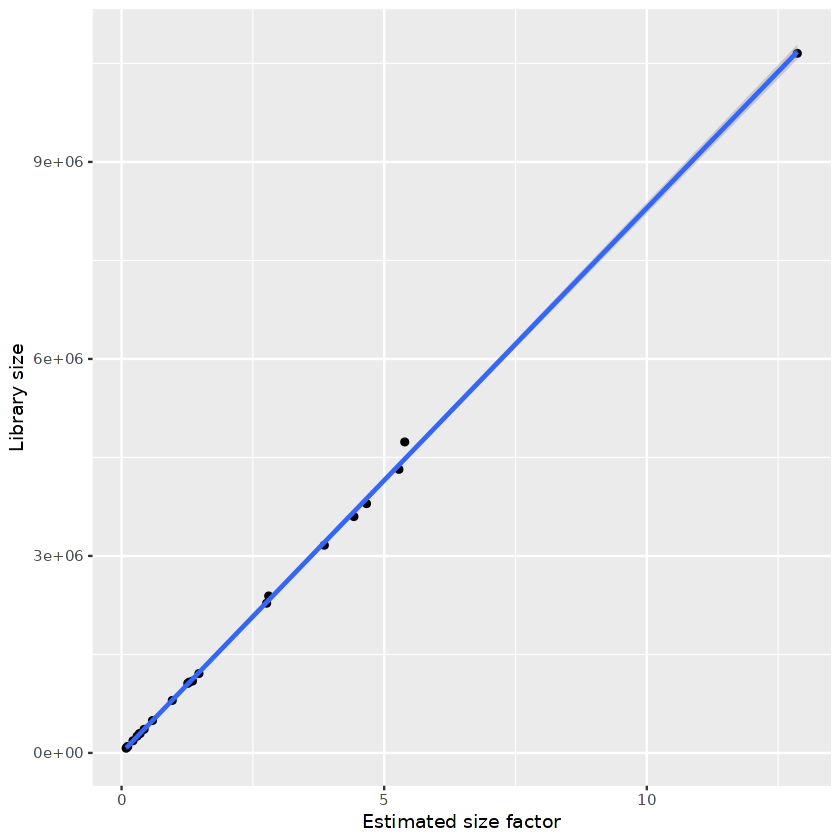

In [385]:
options(repr.plot.width=7, repr.plot.height=7)
ggplot(data=libsize, aes(x=x, y=y)) + geom_point() + geom_smooth(method="lm") + xlab("Estimated size factor") + ylab("Library size")

In [386]:
data.frame(colData(dds))

,cluster_id,sample_id,group_id,debris_id,sizeFactor
,<chr>,<chr>,<fct>,<fct>,<dbl>
Early1,OPC,Early1,Early,Percoll,0.21781131
Early4,OPC,Early4,Early,Debris,0.96555623
EarlyCtrl4,OPC,EarlyCtrl4,Ctrl,Debris,4.42356077
EarlyCtrlFemale5,OPC,EarlyCtrlFemale5,Ctrl,Debris,1.35045587
EarlyCtrlMale5,OPC,EarlyCtrlMale5,Ctrl,Debris,1.47340921
EarlyFemale5,OPC,EarlyFemale5,Early,Debris,5.28050544
EarlyMale3,OPC,EarlyMale3,Early,Percoll,0.08709793
EarlyMale5,OPC,EarlyMale5,Early,Debris,2.76261242
Late1,OPC,Late1,Late,Percoll,0.10303724


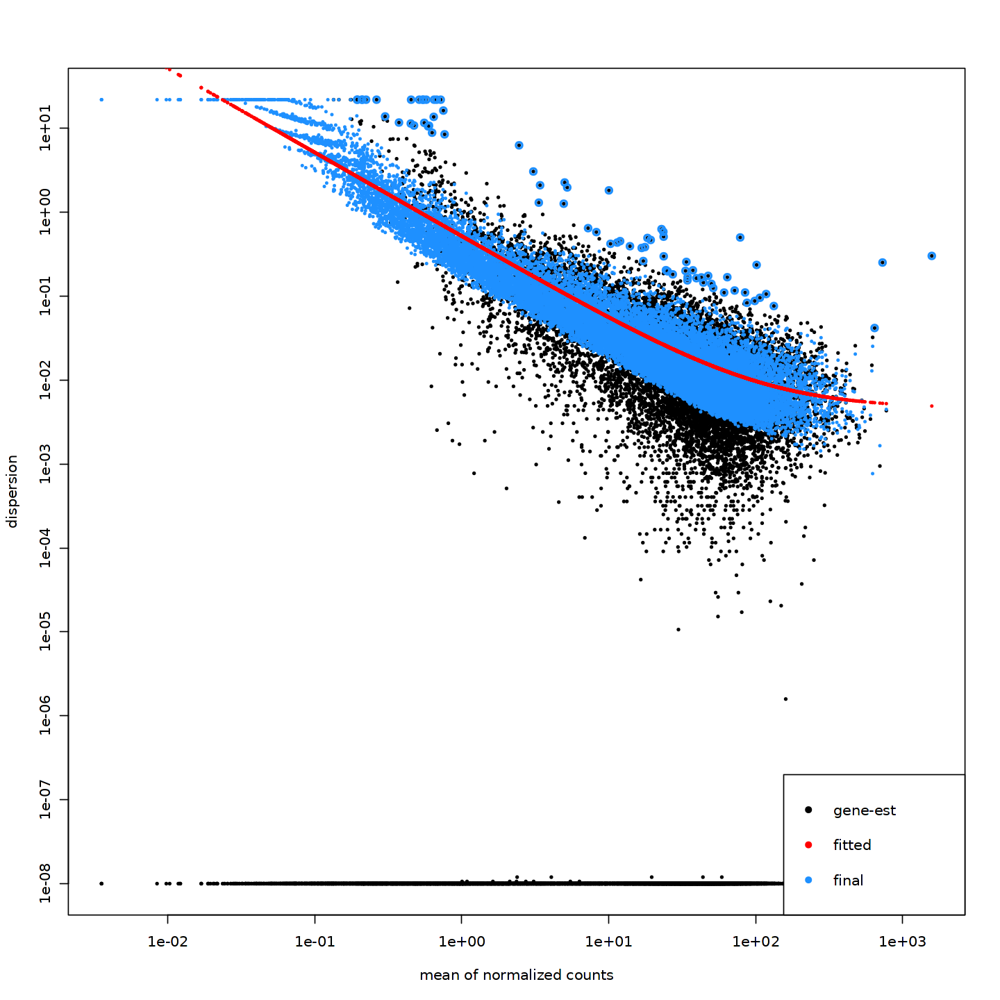

In [387]:
# Plot dispersion estimates
options(repr.plot.width=12, repr.plot.height=12)
plotDispEsts(dds)

##### 3.1.3.1 Early/Ctrl

In [388]:
condition1 = "Early"
condition2 = "Ctrl"

In [389]:
contrast <- c("group_id", condition1, condition2)

# resultsNames(dds)
res <- results(dds, contrast = contrast, alpha = 0.05)

In [390]:
summary(res)


out of 21784 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 144, 0.66%
LFC < 0 (down)     : 2, 0.0092%
outliers [1]       : 0, 0%
low counts [2]     : 3801, 17%
(mean count < 2)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



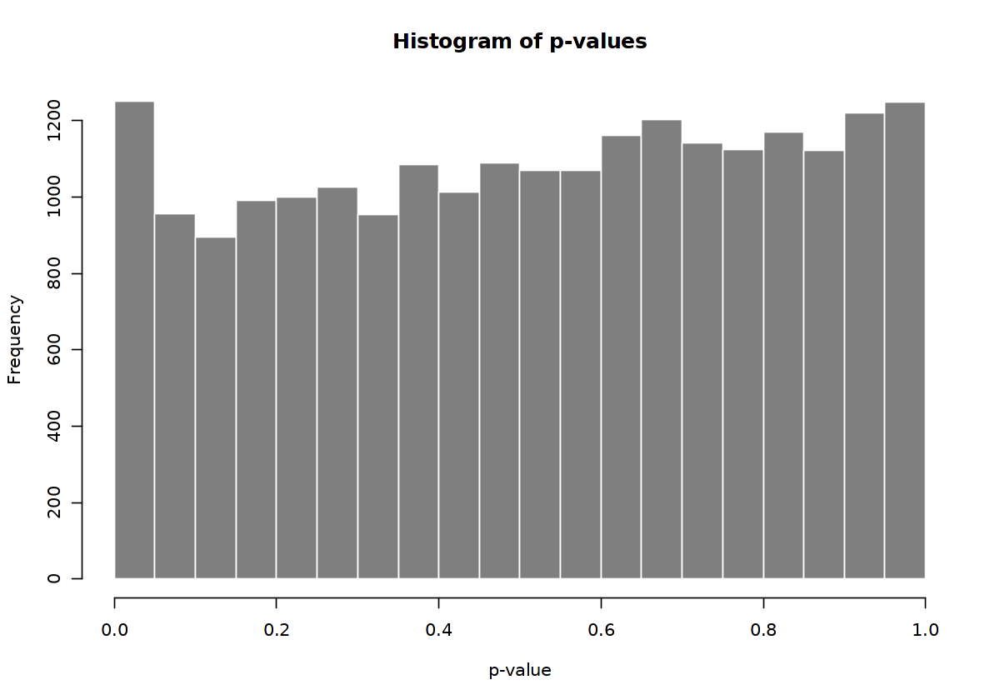

In [391]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$pvalue, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of p-values", xlab="p-value")

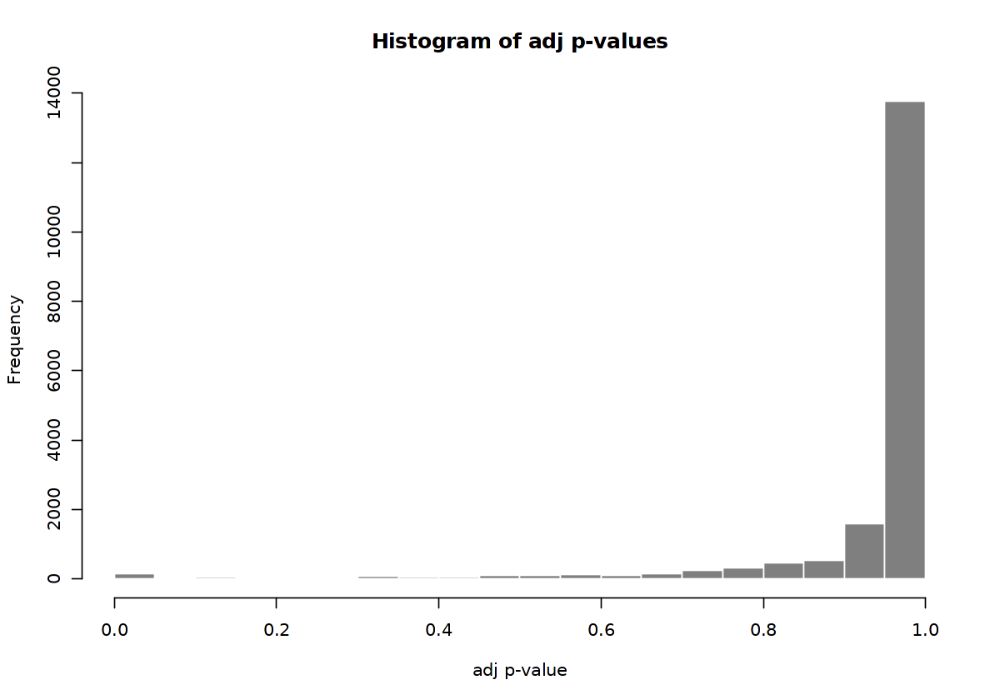

In [392]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$padj, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of adj p-values", xlab="adj p-value")

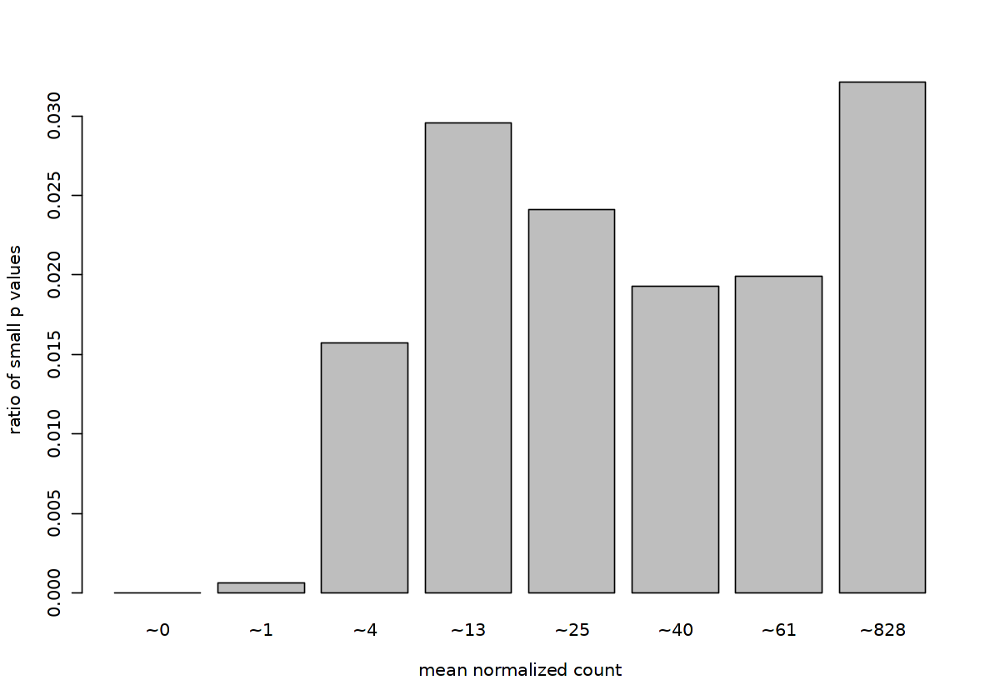

In [393]:
options(repr.plot.width=10, repr.plot.height=7)
qs <- c(0, quantile(res$baseMean[res$baseMean > 0], 0:7/7))
# cut the genes into the bins
bins <- cut(res$baseMean, qs)
# rename the levels of the bins using the middle point
levels(bins) <- paste0("~",round(.5*qs[-1] + .5*qs[-length(qs)]))
# calculate the ratio of $p$ values less than .01 for each bin
ratios <- tapply(res$pvalue, bins, function(p) mean(p < .01, na.rm=TRUE))
# plot these ratios
barplot(ratios, xlab="mean normalized count", ylab="ratio of small p values")

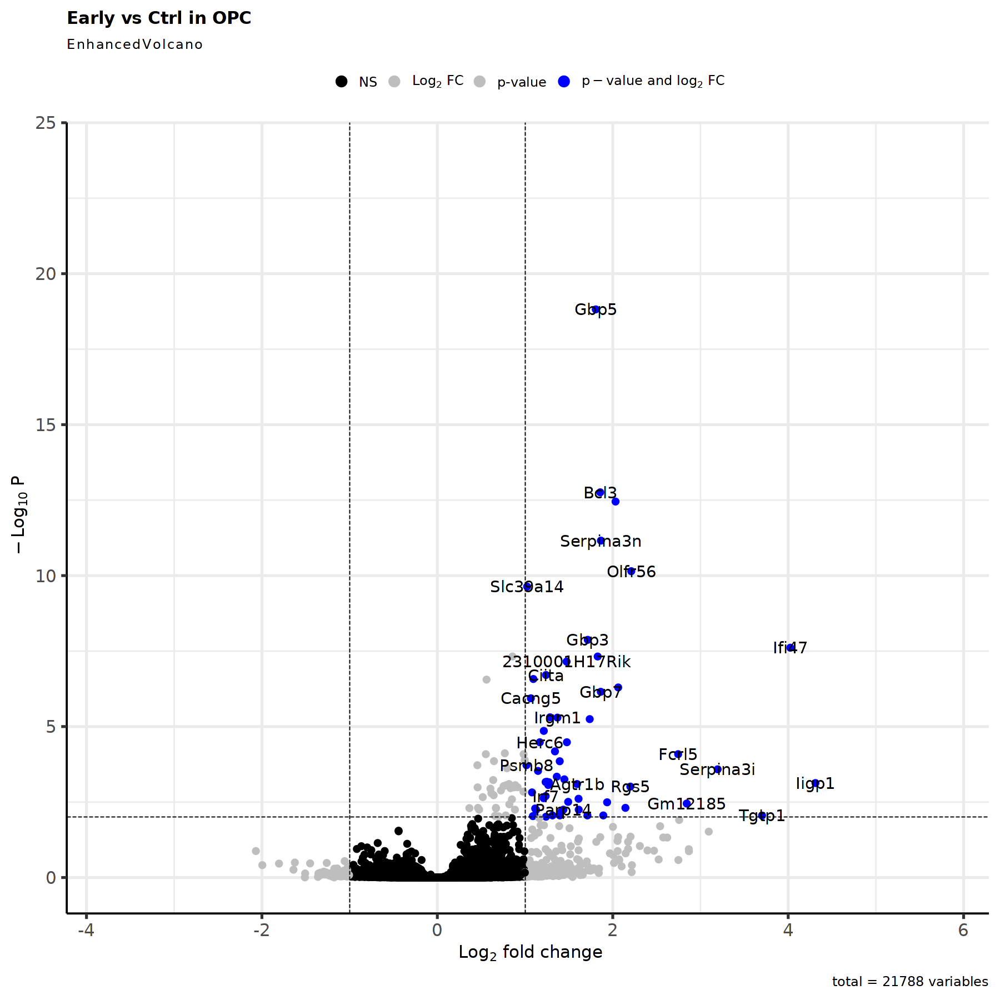

In [394]:
options(repr.plot.width=15, repr.plot.height=15)
#padj<0.001
EnhancedVolcano(res,
    lab = rownames(res),
    x = 'log2FoldChange',
    y = 'padj',
    title = paste0(condition1,' vs ',condition2,' in ', cluster_choice),
    pCutoff = 0.01,
    FCcutoff = 1,
    pointSize = 3.0,
    labSize = 6.0,
    col=c('black', 'grey', 'grey', 'blue'),
    colAlpha = 1)

In [395]:
res <- res[complete.cases(res$padj),]

In [396]:
res_filtered <- res[(res$padj < 0.01 & abs(res$log2FoldChange) > 1 & res$baseMean > 1),]

In [397]:
res_filtered[order(abs(res_filtered$log2FoldChange), decreasing=TRUE),]

log2 fold change (MLE): group_id Early vs Ctrl 
Wald test p-value: group id Early vs Ctrl 
DataFrame with 57 rows and 6 columns
           baseMean log2FoldChange     lfcSE      stat      pvalue        padj
          <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
Iigp1      10.88109        4.31078  0.903202   4.77278 1.81702e-06 7.42625e-04
Ifi47      17.42794        4.02433  0.592312   6.79427 1.08864e-11 2.44713e-08
Tgtp1       3.92091        3.70199  0.905406   4.08876 4.33687e-05 8.86249e-03
Serpina3i   7.57105        3.19621  0.636213   5.02380 5.06583e-07 2.60282e-04
Gm12185     4.92770        2.84325  0.653598   4.35014 1.36049e-05 3.54575e-03
...             ...            ...       ...       ...         ...         ...
Oas1c       12.3333        1.08922  0.267395   4.07343 4.63258e-05 9.25641e-03
Ermard      27.9529        1.07955  0.236439   4.56585 4.97470e-06 1.51627e-03
Cacng5      50.3659        1.06594  0.174891   6.09486 1.09534e-09 1.15868e-06
Slc

In [398]:
nrow(res_filtered)

[1] 57

In [399]:
HVGs.list[[cluster_choice]][[paste0(condition1,"_",condition2)]] <- rownames(res_filtered)

##### 3.1.3.2 Peak/Early

In [400]:
condition1 = "Peak"
condition2 = "Early"

In [401]:
contrast <- c("group_id", condition1, condition2)

# resultsNames(dds)
res <- results(dds, contrast = contrast, alpha = 0.05)

In [402]:
summary(res)


out of 21784 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 1782, 8.2%
LFC < 0 (down)     : 503, 2.3%
outliers [1]       : 0, 0%
low counts [2]     : 3379, 16%
(mean count < 2)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



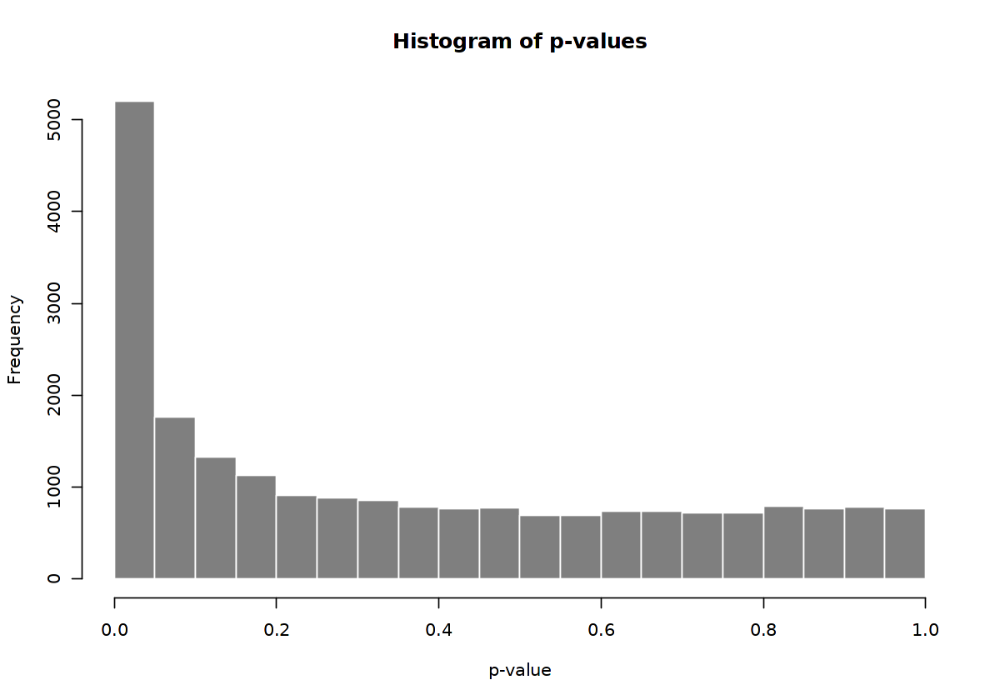

In [403]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$pvalue, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of p-values", xlab="p-value")

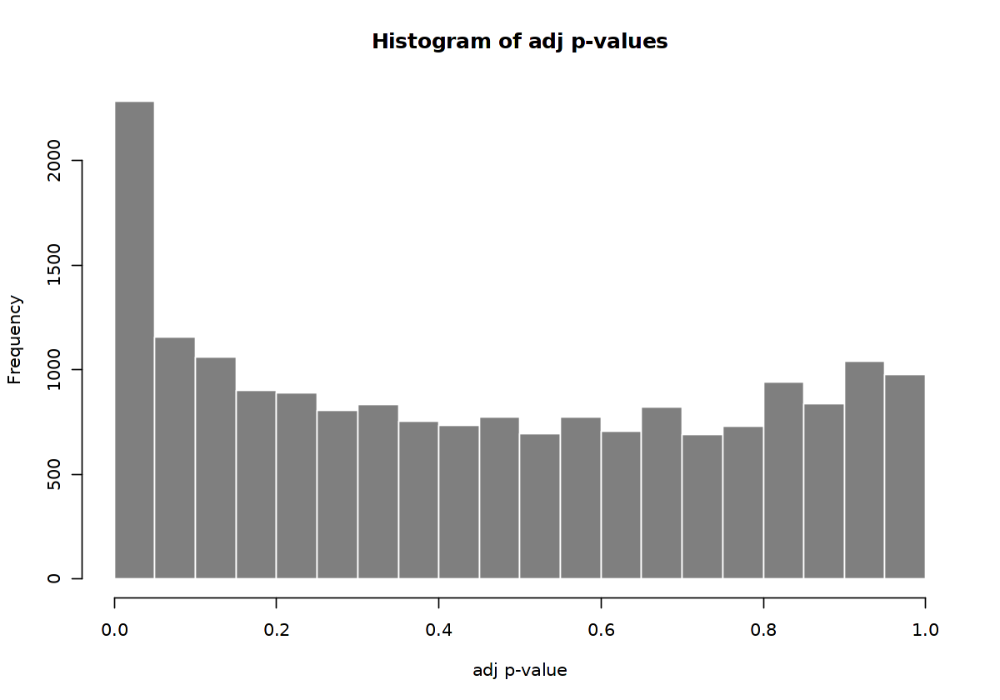

In [404]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$padj, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of adj p-values", xlab="adj p-value")

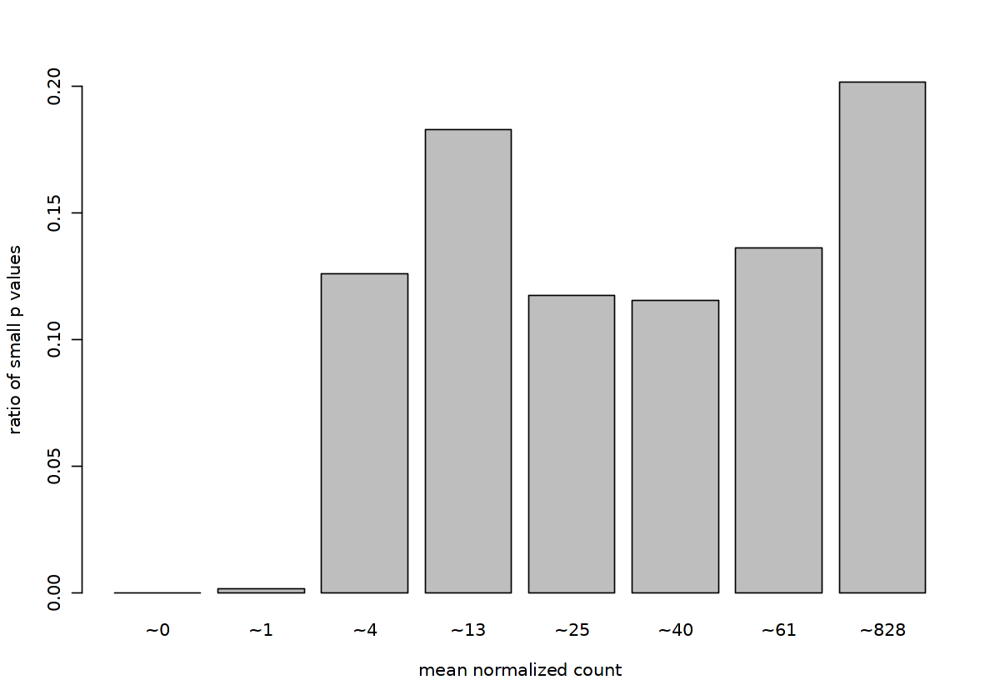

In [405]:
options(repr.plot.width=10, repr.plot.height=7)
qs <- c(0, quantile(res$baseMean[res$baseMean > 0], 0:7/7))
# cut the genes into the bins
bins <- cut(res$baseMean, qs)
# rename the levels of the bins using the middle point
levels(bins) <- paste0("~",round(.5*qs[-1] + .5*qs[-length(qs)]))
# calculate the ratio of $p$ values less than .01 for each bin
ratios <- tapply(res$pvalue, bins, function(p) mean(p < .01, na.rm=TRUE))
# plot these ratios
barplot(ratios, xlab="mean normalized count", ylab="ratio of small p values")

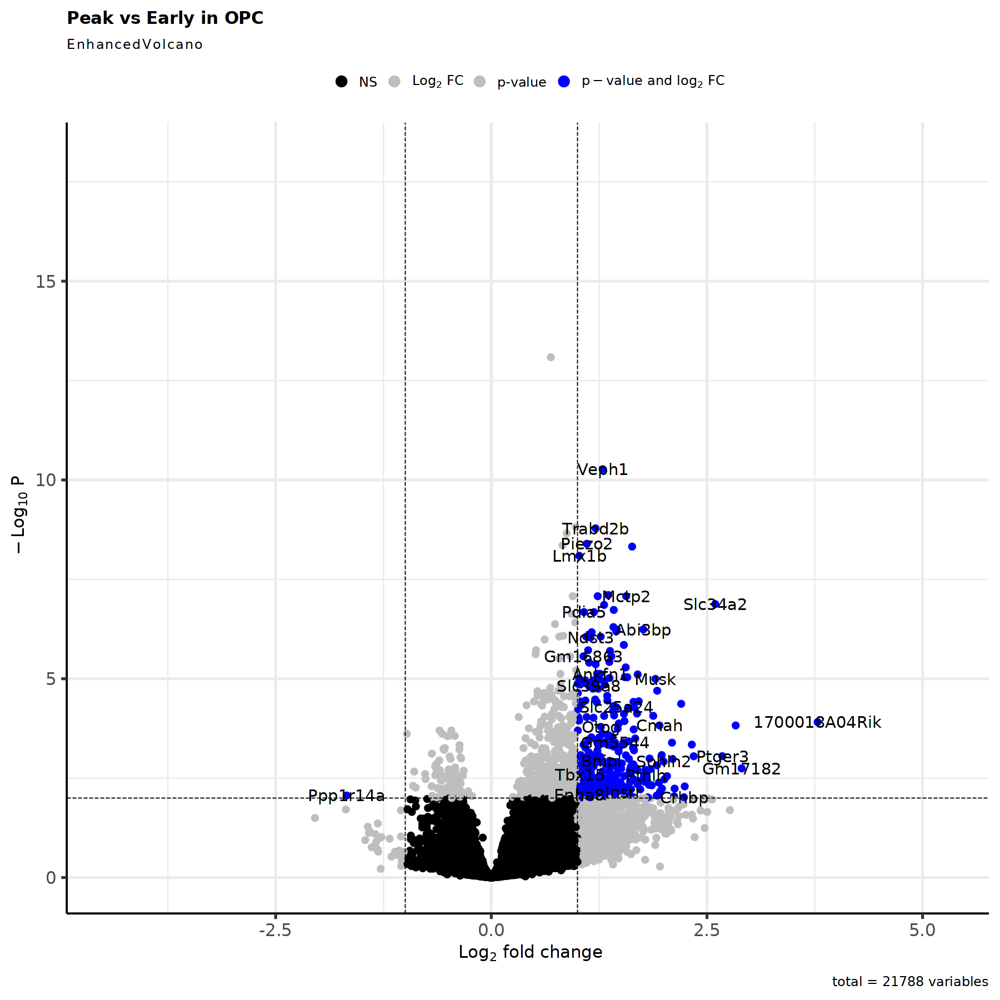

In [406]:
options(repr.plot.width=15, repr.plot.height=15)
#padj<0.001
EnhancedVolcano(res,
    lab = rownames(res),
    x = 'log2FoldChange',
    y = 'padj',
    title = paste0(condition1,' vs ',condition2,' in ', cluster_choice),
    pCutoff = 0.01,
    FCcutoff = 1,
    pointSize = 3.0,
    labSize = 6.0,
    col=c('black', 'grey', 'grey', 'blue'),
    colAlpha = 1)

In [407]:
res <- res[complete.cases(res$padj),]

In [408]:
res_filtered <- res[(res$padj < 0.01 & abs(res$log2FoldChange) > 1 & res$baseMean > 1),]

In [409]:
res_filtered[order(abs(res_filtered$log2FoldChange), decreasing=TRUE),]

log2 fold change (MLE): group_id Peak vs Early 
Wald test p-value: group_id Peak vs Early 
DataFrame with 332 rows and 6 columns
               baseMean log2FoldChange     lfcSE      stat      pvalue        padj
              <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
1700018A04Rik   2.55088        3.78342  0.771202   4.90587 9.30123e-07 1.23158e-04
Gm17182         2.23966        2.90240  0.702624   4.13080 3.61496e-05 1.80307e-03
Cyp19a1         3.93557        2.83341  0.582970   4.86029 1.17211e-06 1.49504e-04
Ptger3          3.82592        2.67823  0.613599   4.36478 1.27252e-05 8.87146e-04
Slc34a2         8.13769        2.59590  0.402143   6.45517 1.08098e-10 1.32636e-07
...                 ...            ...       ...       ...         ...         ...
Cd44            36.9109        1.00647  0.197737   5.08996 3.58138e-07 5.78204e-05
Erg             54.6950        1.00466  0.188226   5.33753 9.42225e-08 2.28180e-05
Fam20a          19.4263        1.00342  0

In [410]:
nrow(res_filtered)

[1] 332

In [411]:
HVGs.list[[cluster_choice]][[paste0(condition1,"_",condition2)]] <- rownames(res_filtered)

##### 3.1.3.3 Late/Early

In [412]:
condition1 = "Late"
condition2 = "Early"

In [413]:
contrast <- c("group_id", condition1, condition2)

# resultsNames(dds)
res <- results(dds, contrast = contrast, alpha = 0.05)

In [414]:
summary(res)


out of 21784 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 199, 0.91%
LFC < 0 (down)     : 103, 0.47%
outliers [1]       : 0, 0%
low counts [2]     : 5068, 23%
(mean count < 4)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



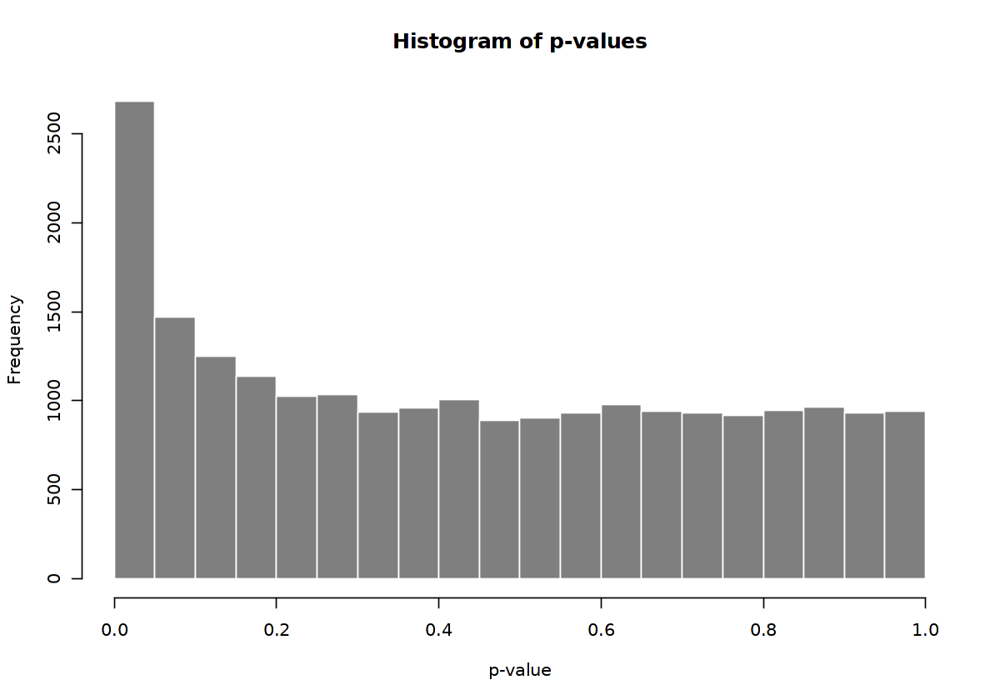

In [415]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$pvalue, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of p-values", xlab="p-value")

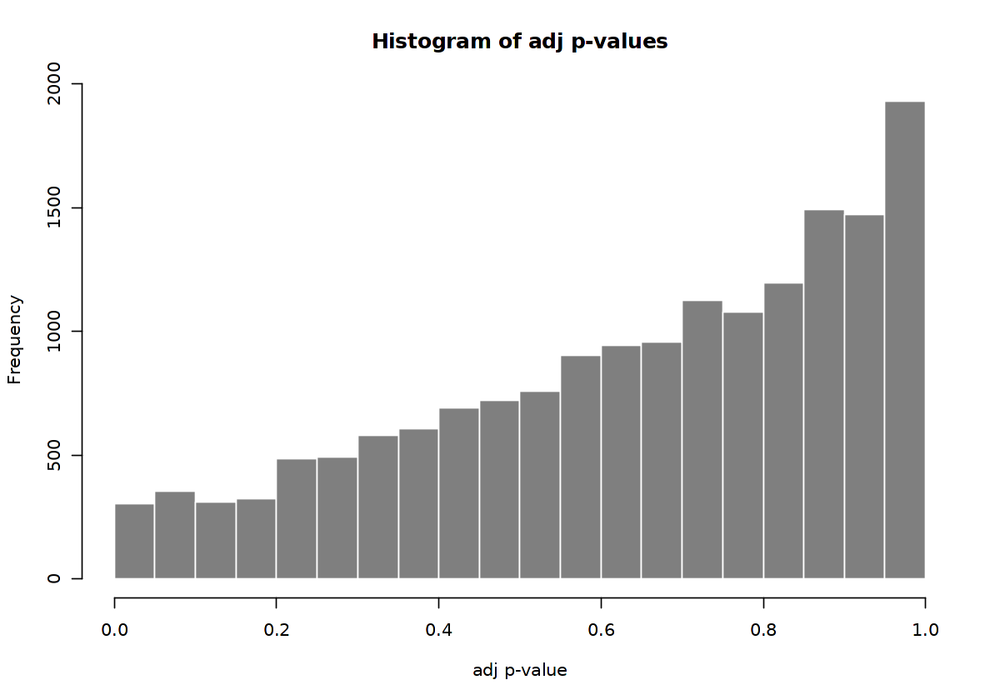

In [416]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$padj, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of adj p-values", xlab="adj p-value")

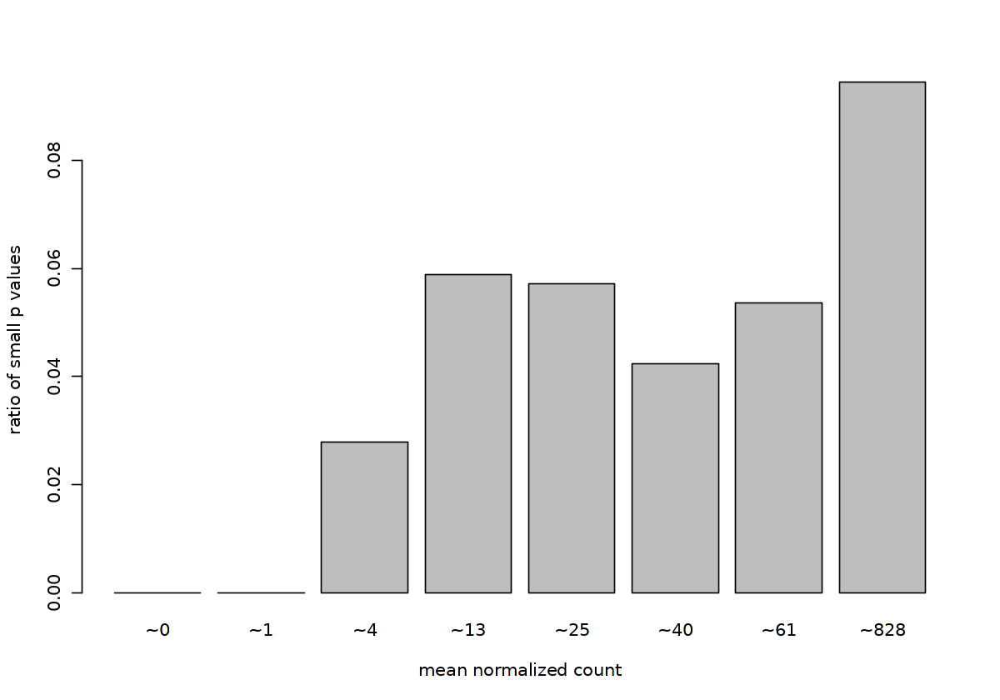

In [417]:
options(repr.plot.width=10, repr.plot.height=7)
qs <- c(0, quantile(res$baseMean[res$baseMean > 0], 0:7/7))
# cut the genes into the bins
bins <- cut(res$baseMean, qs)
# rename the levels of the bins using the middle point
levels(bins) <- paste0("~",round(.5*qs[-1] + .5*qs[-length(qs)]))
# calculate the ratio of $p$ values less than .01 for each bin
ratios <- tapply(res$pvalue, bins, function(p) mean(p < .01, na.rm=TRUE))
# plot these ratios
barplot(ratios, xlab="mean normalized count", ylab="ratio of small p values")

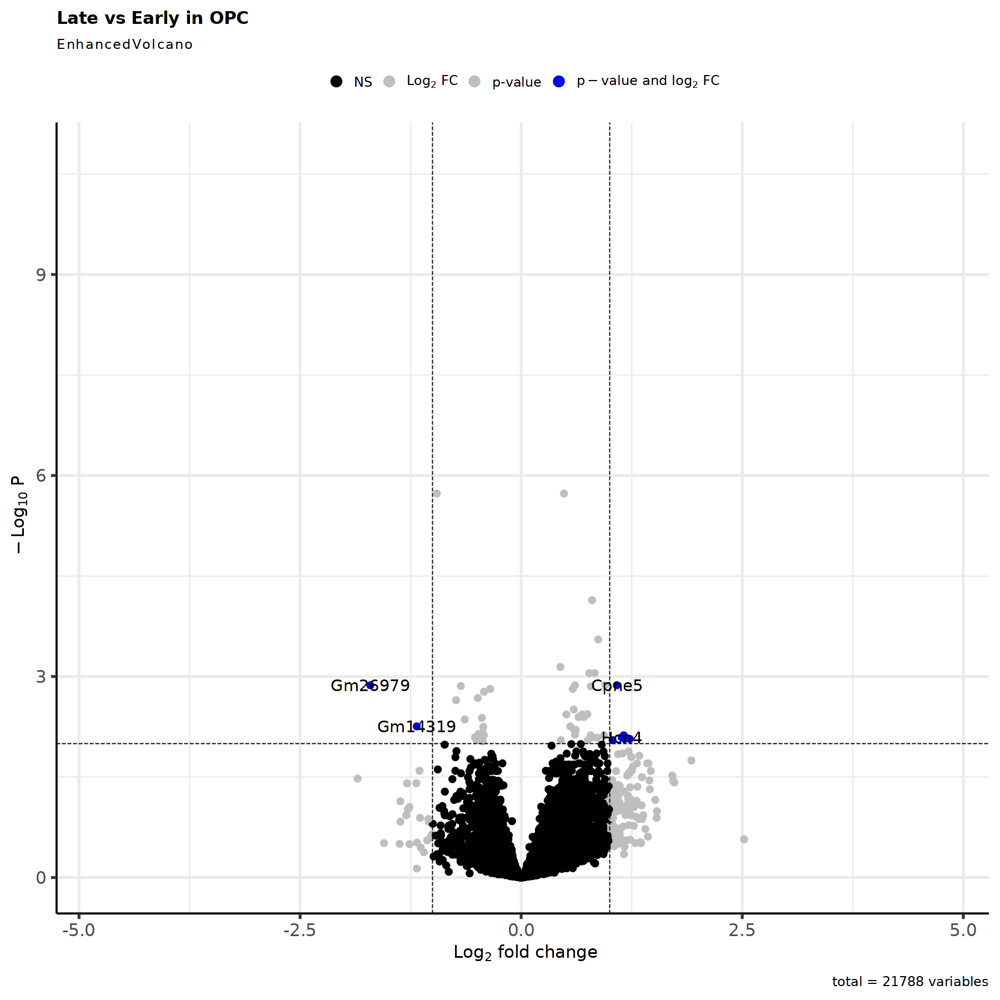

In [418]:
options(repr.plot.width=15, repr.plot.height=15)
#padj<0.001
EnhancedVolcano(res,
    lab = rownames(res),
    x = 'log2FoldChange',
    y = 'padj',
    title = paste0(condition1,' vs ',condition2,' in ', cluster_choice),
    pCutoff = 0.01,
    FCcutoff = 1,
    pointSize = 3.0,
    labSize = 6.0,
    col=c('black', 'grey', 'grey', 'blue'),
    colAlpha = 1)

In [419]:
res <- res[complete.cases(res$padj),]

In [420]:
res_filtered <- res[(res$padj < 0.01 & abs(res$log2FoldChange) > 1 & res$baseMean > 1),]

In [421]:
res_filtered[order(abs(res_filtered$log2FoldChange), decreasing=TRUE),]

log2 fold change (MLE): group_id Late vs Early 
Wald test p-value: group_id Late vs Early 
DataFrame with 8 rows and 6 columns
               baseMean log2FoldChange     lfcSE      stat      pvalue       padj
              <numeric>      <numeric> <numeric> <numeric>   <numeric>  <numeric>
Gm26979         8.07671       -1.70595  0.342903  -4.97504 6.52357e-07 0.00135082
Olfr94         12.17040        1.22804  0.290081   4.23344 2.30145e-05 0.00854913
Gm14319        20.79114       -1.18093  0.266397  -4.43297 9.29444e-06 0.00554878
5930412G12Rik  18.09764        1.17003  0.276089   4.23786 2.25663e-05 0.00854913
Pla2g4e        18.82248        1.15939  0.269118   4.30811 1.64659e-05 0.00754763
Hcn4           21.57095        1.13696  0.266840   4.26081 2.03685e-05 0.00810667
Cpne5          24.10986        1.08200  0.220153   4.91476 8.88909e-07 0.00135082
Crb1           23.72931        1.03386  0.245680   4.20817 2.57449e-05 0.00890506

In [422]:
nrow(res_filtered)

[1] 8

In [423]:
HVGs.list[[cluster_choice]][[paste0(condition1,"_",condition2)]] <- rownames(res_filtered)

##### 3.1.3.4 Peak/Late

In [424]:
condition1 = "Peak"
condition2 = "Late"

In [425]:
contrast <- c("group_id", condition1, condition2)

# resultsNames(dds)
res <- results(dds, contrast = contrast, alpha = 0.05)

In [426]:
summary(res)


out of 21784 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)       : 500, 2.3%
LFC < 0 (down)     : 26, 0.12%
outliers [1]       : 0, 0%
low counts [2]     : 2534, 12%
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



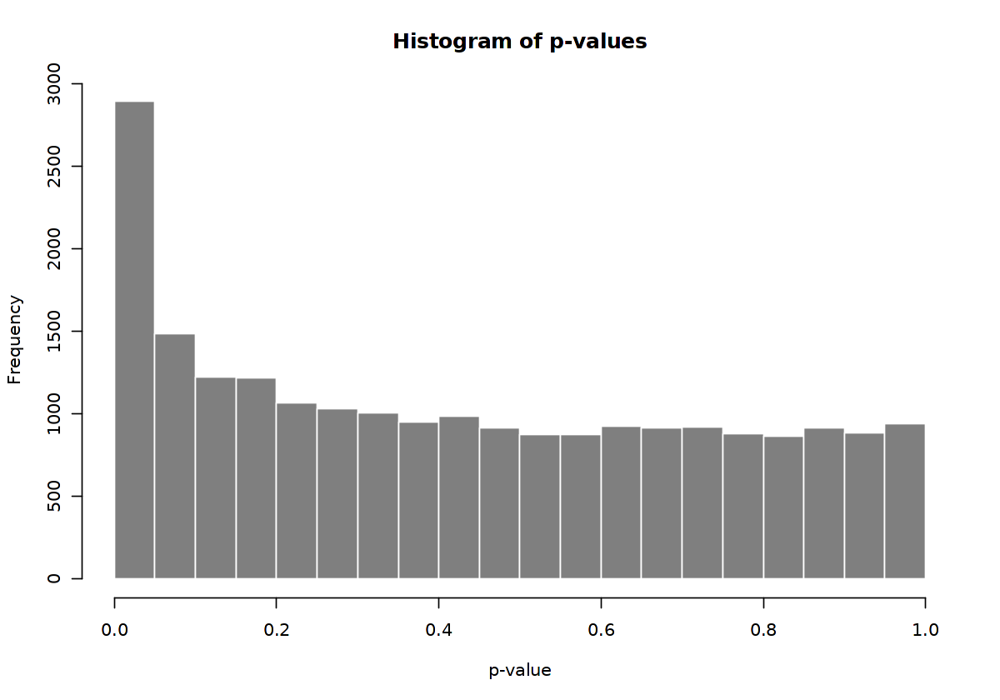

In [427]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$pvalue, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of p-values", xlab="p-value")

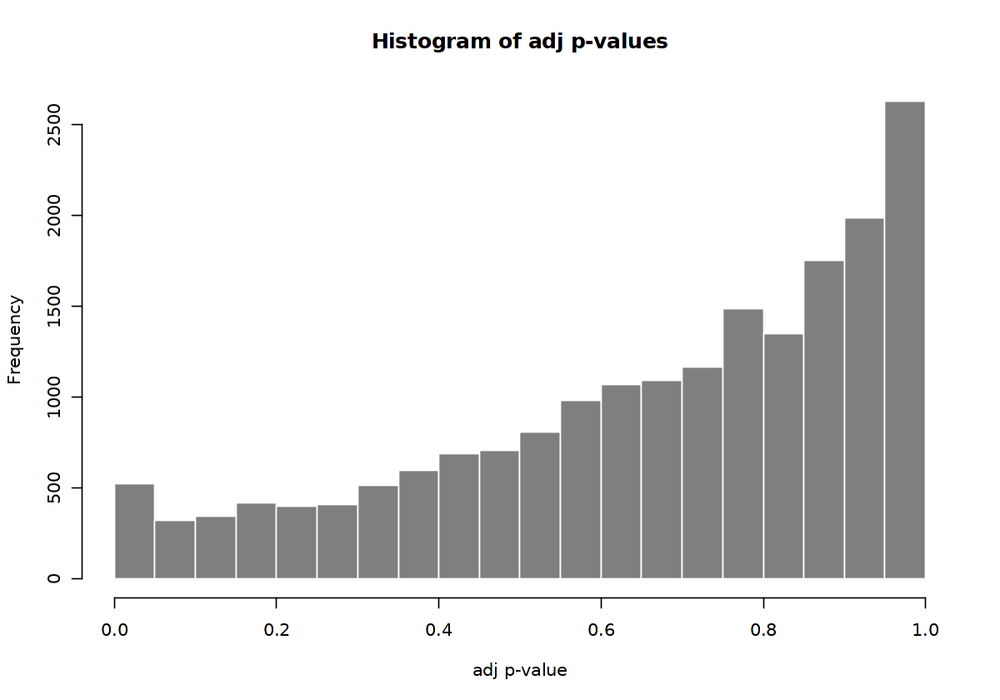

In [428]:
options(repr.plot.width=10, repr.plot.height=7)
hist(res$padj, breaks=0:20/20, col="grey50", border="white", xlim=c(0,1), main="Histogram of adj p-values", xlab="adj p-value")

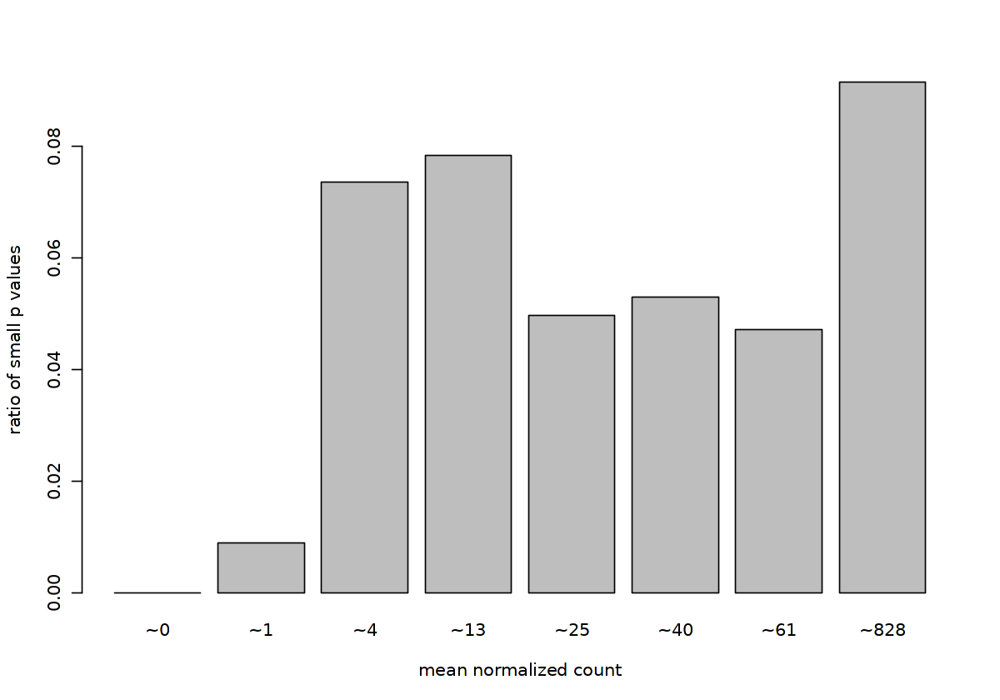

In [429]:
options(repr.plot.width=10, repr.plot.height=7)
qs <- c(0, quantile(res$baseMean[res$baseMean > 0], 0:7/7))
# cut the genes into the bins
bins <- cut(res$baseMean, qs)
# rename the levels of the bins using the middle point
levels(bins) <- paste0("~",round(.5*qs[-1] + .5*qs[-length(qs)]))
# calculate the ratio of $p$ values less than .01 for each bin
ratios <- tapply(res$pvalue, bins, function(p) mean(p < .01, na.rm=TRUE))
# plot these ratios
barplot(ratios, xlab="mean normalized count", ylab="ratio of small p values")

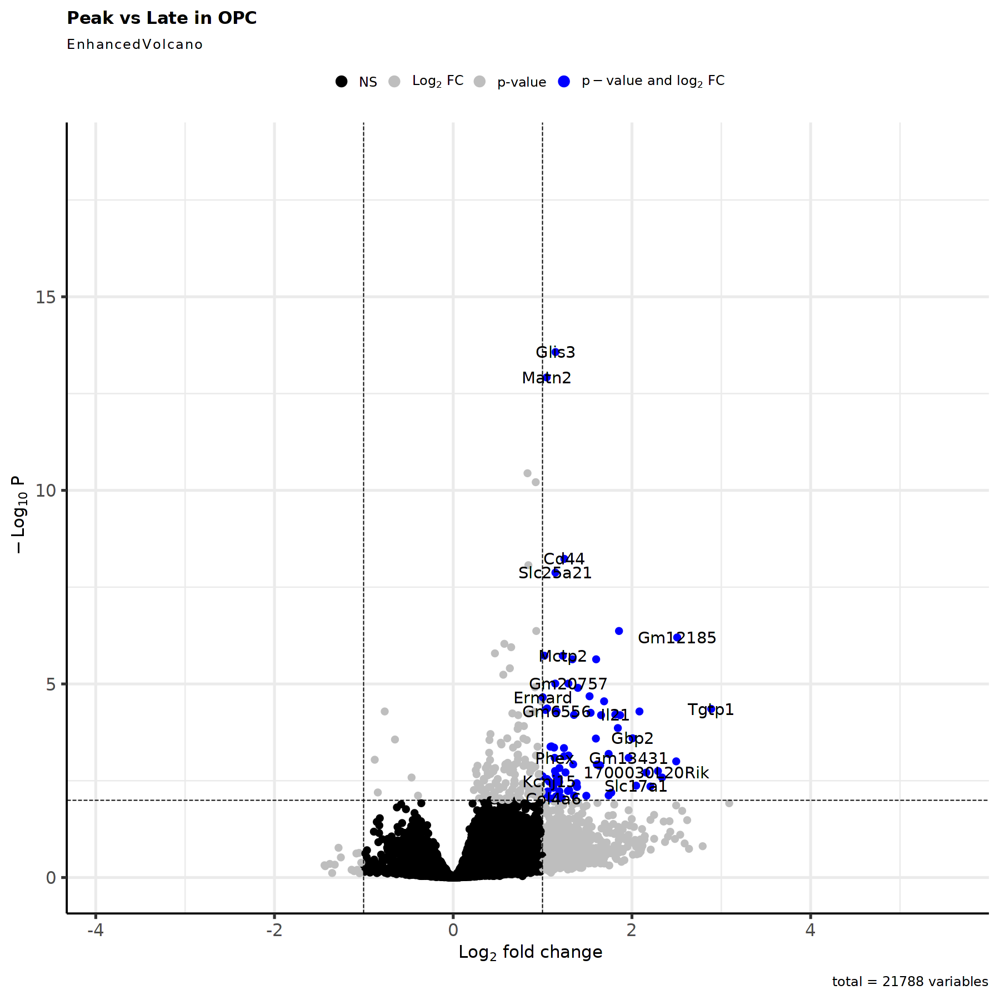

In [430]:
options(repr.plot.width=15, repr.plot.height=15)
#padj<0.001
EnhancedVolcano(res,
    lab = rownames(res),
    x = 'log2FoldChange',
    y = 'padj',
    title = paste0(condition1,' vs ',condition2,' in ', cluster_choice),
    pCutoff = 0.01,
    FCcutoff = 1,
    pointSize = 3.0,
    labSize = 6.0,
    col=c('black', 'grey', 'grey', 'blue'),
    colAlpha = 1)

In [431]:
res <- res[complete.cases(res$padj),]

In [432]:
res_filtered <- res[(res$padj < 0.01 & abs(res$log2FoldChange) > 1 & res$baseMean > 1),]

In [433]:
res_filtered[order(abs(res_filtered$log2FoldChange), decreasing=TRUE),]

log2 fold change (MLE): group_id Peak vs Late 
Wald test p-value: group_id Peak vs Late 
DataFrame with 76 rows and 6 columns
               baseMean log2FoldChange     lfcSE      stat      pvalue        padj
              <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
Tgtp1           3.92091        2.88707  0.534630   5.40012 6.65959e-08 4.42059e-05
Gm12185         4.92770        2.50593  0.398692   6.28538 3.27052e-10 6.29576e-07
Tas2r137        2.05951        2.49533  0.541404   4.60899 4.04638e-06 9.98626e-04
Gm20497         1.88019        2.33704  0.542860   4.30504 1.66953e-05 2.61128e-03
Gm17182         2.23966        2.29125  0.518340   4.42035 9.85397e-06 1.78086e-03
...                 ...            ...       ...       ...         ...         ...
Ofcc1           8.51048        1.03425  0.258815   3.99612 6.43900e-05 6.96353e-03
Gldn           14.26345        1.03263  0.191826   5.38318 7.31802e-08 4.69573e-05
2310001H17Rik  26.31470        1.02043  0.16

In [434]:
nrow(res_filtered)

[1] 76

In [435]:
HVGs.list[[cluster_choice]][[paste0(condition1,"_",condition2)]] <- rownames(res_filtered)

##### 3.1.3.5 Summary

In [436]:
listInput_upset <- HVGs.list[[cluster_choice]]
listInput_upset[sapply(listInput_upset, is.null)] <- NULL

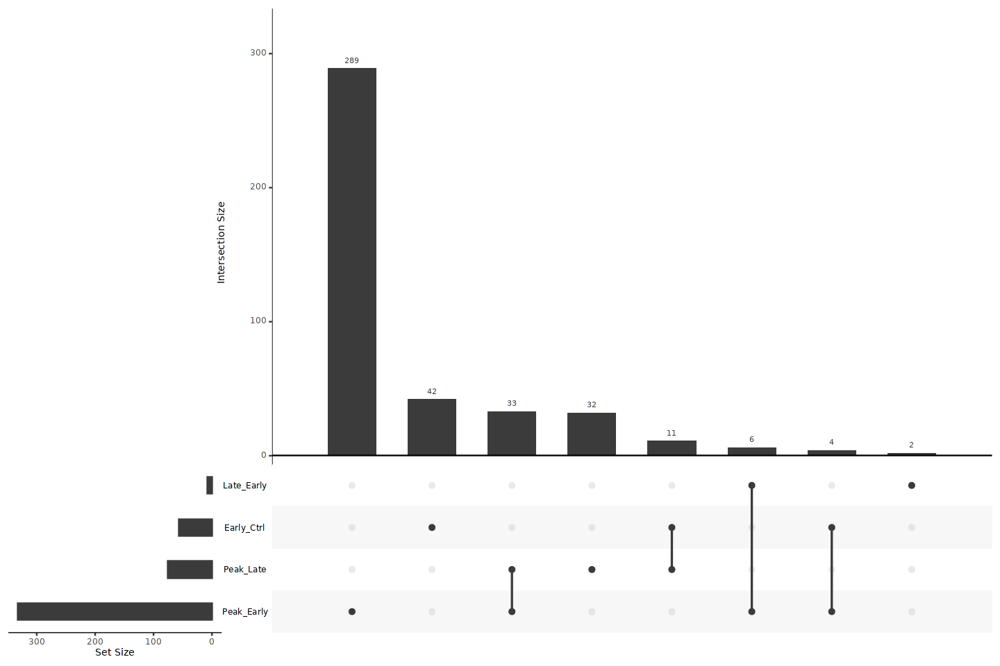

In [437]:
options(repr.plot.width=12, repr.plot.height=8)
upset(fromList(listInput_upset), order.by = "freq")

In [438]:
HVG <- unique(unlist(HVGs.list[[cluster_choice]]))

In [439]:
tmp <- subset(MORNAATACCOL, subset = cellType_OL_merge == cluster_choice)

In [440]:
#Remove sample with low number of cells
keepcells <- rownames(tmp@meta.data[!tmp$orig.ident %in% (names(table_sample_low)),])
tmp <- subset(tmp, cells=keepcells)

In [441]:
#Remove timepoint with low number of cells
keepcells <- rownames(tmp@meta.data[!tmp$orig.ident_merge %in% (names(table_group_low)),])
tmp <- subset(tmp, cells=keepcells)

In [442]:
DefaultAssay(tmp) <- "GenePromAcc"

In [443]:
tmp <- NormalizeData(tmp, normalization.method = "LogNormalize", scale.factor = 10000, margin = 1, verbose = TRUE)

Performing log-normalization
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|


In [444]:
tmp <- ScaleData(tmp, features=rownames(tmp))

Centering and scaling data matrix

  |==========================================================================================| 100%


In [445]:
DefaultAssay(tmp) <- "RNA"

In [446]:
tmp <- NormalizeData(tmp, normalization.method = "LogNormalize", scale.factor = 10000, margin = 1, verbose = TRUE)

Performing log-normalization
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|


In [447]:
DefaultAssay(tmp) <- "GenePromAcc"

In [448]:
tmp$orig.ident <- factor(x = tmp$orig.ident, levels = names(orig.ident_colors)[!names(orig.ident_colors) %in% names(table_sample_low)])
tmp$orig.ident_merge <- factor(x = tmp$orig.ident_merge, levels = names(orig.ident_merge_colors)[!names(orig.ident_merge_colors) %in% names(table_group_low)])

In [449]:
Idents(object = tmp) <- "orig.ident_merge"

Warning message:
"CombinePlots is being deprecated. Plots should now be combined using the patchwork system."


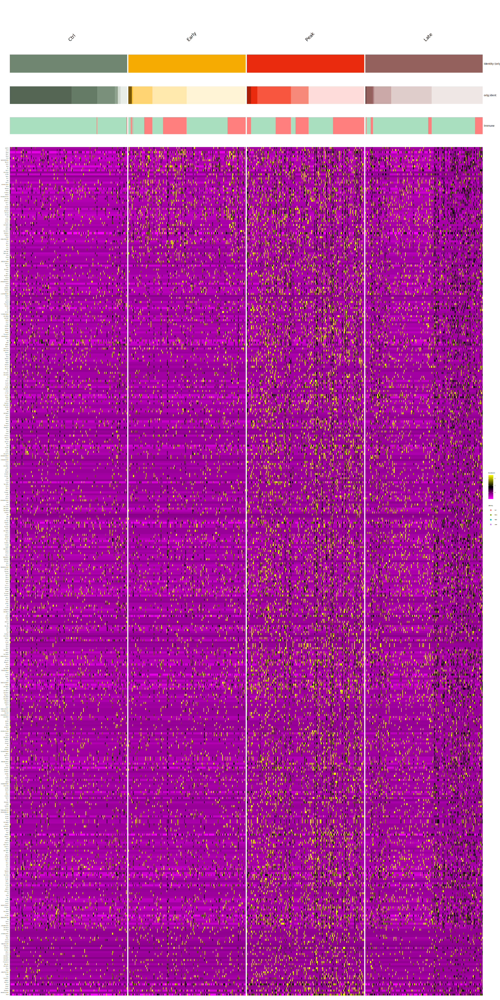

In [450]:
options(repr.plot.width=25, repr.plot.height=50)
DoMultiBarHeatmap(
    subset(tmp, downsample = 200),
    features = HVG,
    cells = NULL,
    group.by = "orig.ident_merge",
    additional.group.by = c("orig.ident", "Immune"),
    additional.group.sort.by = c("orig.ident", "Immune"),
    cols.use = list(orig.ident_merge=orig.ident_merge_colors, orig.ident=orig.ident_colors, Immune=immune_colors),
    group.bar = TRUE,
    disp.min = -2.5,
    disp.max = NULL,
    layer = "scale.data",
    assay = "GenePromAcc",
    label = TRUE,
    size = 5.5,
    hjust = 0,
    angle = 45,
    raster = TRUE,
    draw.lines = TRUE,
    lines.width = NULL,
    group.bar.height = 0.02,
    combine = TRUE
    ) + theme(text = element_text(size = 4))

In [451]:
gene_list <- HVG

In [452]:
Idents(object = tmp) <- "orig.ident_merge"

In [453]:
sample_names <- levels(tmp$orig.ident)

In [454]:
tmp_sample_markers <- as.data.frame(AggregateExpression(tmp, assays = "GenePromAcc", group.by = "orig.ident", normalization.method = "LogNormalize", scale.factor = 10000, return.seurat = TRUE)[["GenePromAcc"]]$data[gene_list,])

Centering and scaling data matrix

  |==========================================================================================| 100%
  |==========================================================================================| 100%


In [455]:
tmp_sample_markers_RNA <- data.frame(matrix(0L, ncol=length(sample_names), nrow=length(gene_list), dimnames=list(gene_list, sample_names)))

In [456]:
gene_list_RNA <- gene_list[gene_list %in% rownames(tmp[['RNA']])]

In [457]:
genes0 <- names(rowSums(tmp[['RNA']]@counts[gene_list_RNA,])[rowSums(tmp[['RNA']]@counts[gene_list_RNA,]) == 0])

In [458]:
gene_list_RNA <- gene_list_RNA[!gene_list_RNA %in% genes0]

In [459]:
tmp_sample_markers_RNA_sub <- as.data.frame(AggregateExpression(tmp, assays = "RNA", group.by = "orig.ident", normalization.method = "LogNormalize", scale.factor = 10000, return.seurat = TRUE)[["RNA"]]$data[gene_list_RNA,])

  |==========================================================================================| 100%


In [460]:
matrix <- tmp_sample_markers/do.call(pmax, tmp_sample_markers)

In [461]:
paletteLength <- 50
myColor <- colorRampPalette(c("#FFBCB5", "#432371"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

In [462]:
plot_height <- ifelse(as.integer(nrow(matrix)/20)<=5, 5, as.integer(nrow(matrix)/20))

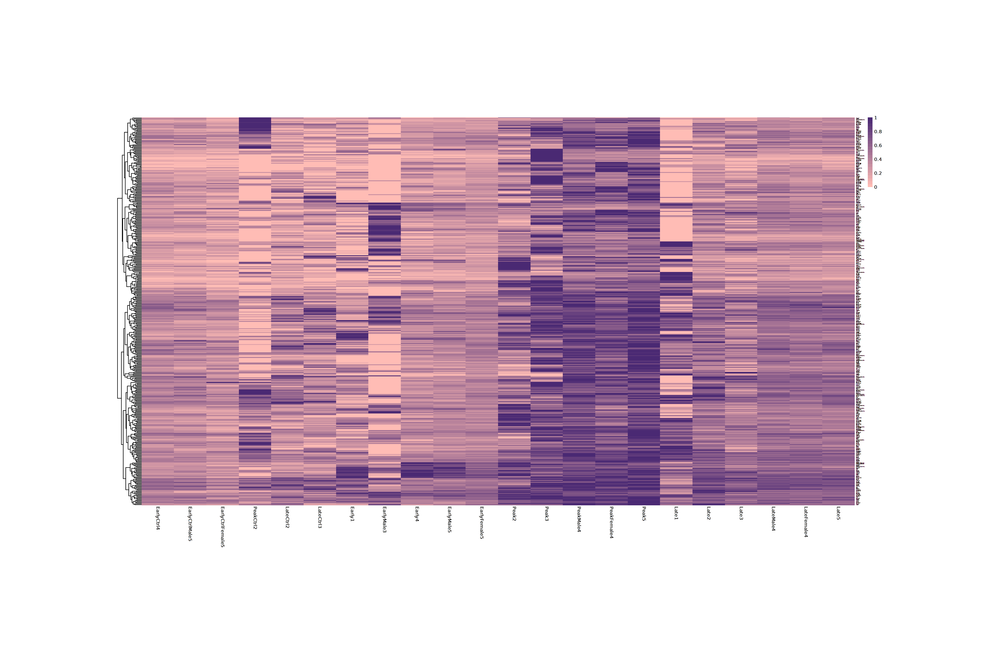

In [463]:
options(repr.plot.width=30, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=TRUE)
ph

In [464]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_",cluster_choice,"_sep_pseudobulk.pdf"), width=30, height=plot_height)

png 
  2

In [465]:
gene_list <- gene_list[ph$tree_row$order]

In [466]:
tmp_sample_markers_mean <- data.frame(matrix(0L, ncol=1, nrow=length(gene_list), dimnames=list(gene_list, "Mean_Log2Acc")))

In [467]:
tmp_sample_markers_mean[rownames(tmp_sample_markers),"Mean_Log2Acc"] <- rowMeans(tmp_sample_markers)

In [468]:
matrix <- tmp_sample_markers_mean

In [469]:
paletteLength <- 50
myColor <- colorRampPalette(c("white", "black"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

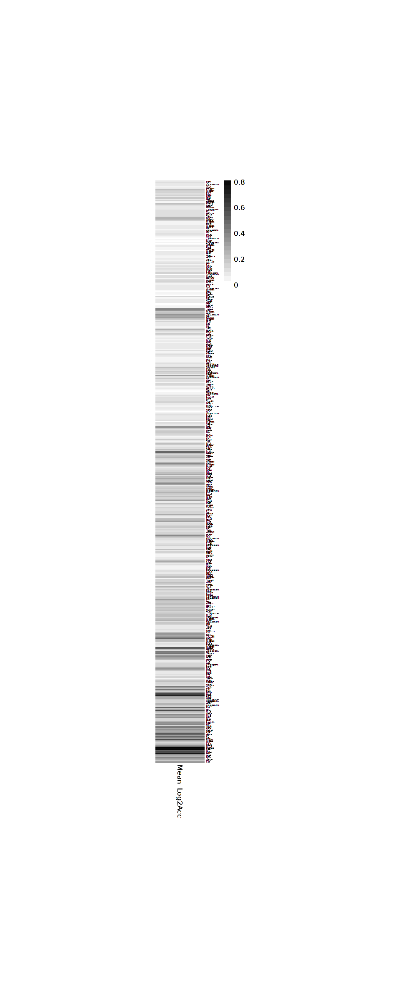

In [470]:
options(repr.plot.width=8, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [471]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_",cluster_choice,"_sep_pseudobulk_mean.pdf"), width=7, height=plot_height)

png 
  2

In [472]:
tmp_sample_markers_zscore <- t(apply(tmp_sample_markers[gene_list,], 1, scale))
colnames(tmp_sample_markers_zscore) <- paste0("zscore_", sample_names)
matrix <- tmp_sample_markers_zscore

In [473]:
paletteLength <- 100
myColor <- colorRampPalette(c("blue", "white", "red"))(paletteLength/2)
myBreaks <- c(seq(-max(abs(matrix)), max(abs(matrix)), length.out=floor(paletteLength/2)))
myColor[(paletteLength/4):((paletteLength/4)+1)] <- c("#FFFFFF", "#FFFFFF")

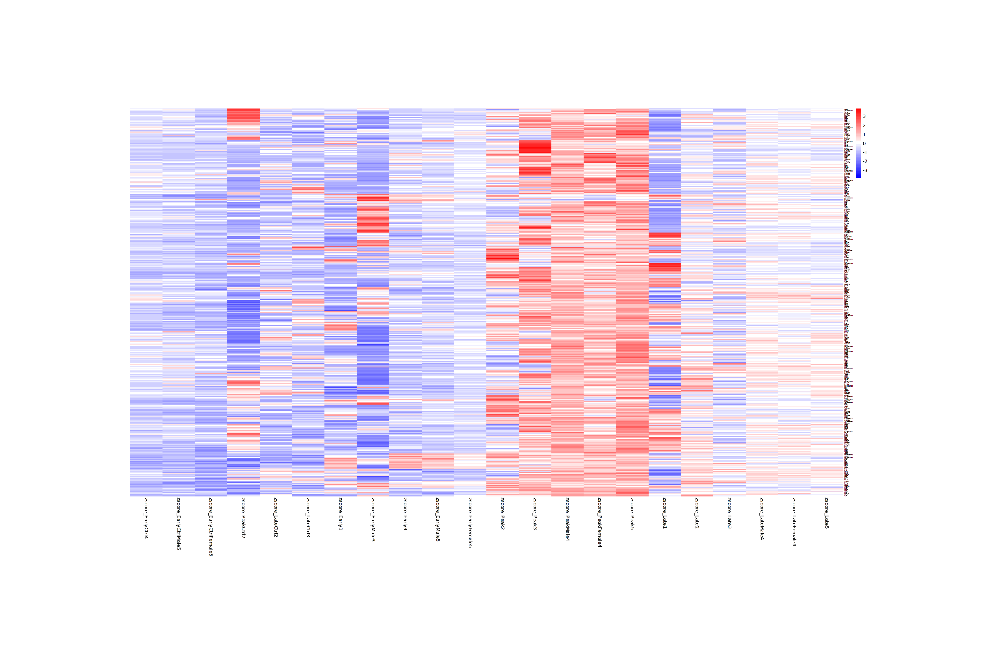

In [474]:
options(repr.plot.width=30, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [475]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_",cluster_choice,"_sep_pseudobulk_zscore.pdf"), width=30, height=plot_height)

png 
  2

In [476]:
matrix <- tmp_sample_markers_RNA
matrix_sub <- tmp_sample_markers_RNA_sub

In [477]:
matrix_sub <- matrix_sub/do.call(pmax, matrix_sub)

In [478]:
is.nan.data.frame <- function(x)
do.call(cbind, lapply(x, is.nan))

matrix_sub[is.nan.data.frame(matrix_sub)] <- 0

In [479]:
matrix[rownames(matrix_sub),] <- matrix_sub
matrix <- matrix[gene_list,]

In [480]:
paletteLength <- 50
myColor <- colorRampPalette(c("#FFFFB3", "#5E3719"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

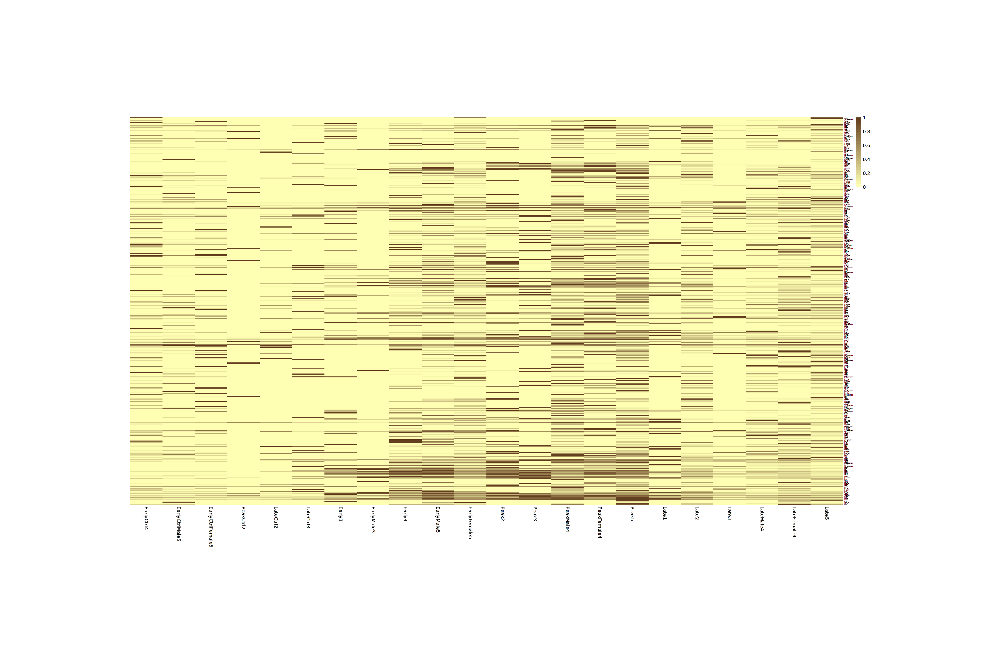

In [481]:
options(repr.plot.width=30, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [482]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_Exp_",cluster_choice,"_sep_pseudobulk.pdf"), width=30, height=plot_height)

png 
  2

In [483]:
tmp_sample_markers_RNA_mean <- data.frame(matrix(0L, ncol=1, nrow=length(gene_list), dimnames=list(gene_list, "Mean_Log2Exp")))

In [484]:
tmp_sample_markers_RNA_mean[rownames(tmp_sample_markers_RNA_sub),"Mean_Log2Exp"] <- rowMeans(tmp_sample_markers_RNA_sub)

In [485]:
matrix <- tmp_sample_markers_RNA_mean

In [486]:
is.nan.data.frame <- function(x)
do.call(cbind, lapply(x, is.na))

matrix[is.na.data.frame(matrix)] <- 0

In [487]:
paletteLength <- 50
myColor <- colorRampPalette(c("white", "black"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

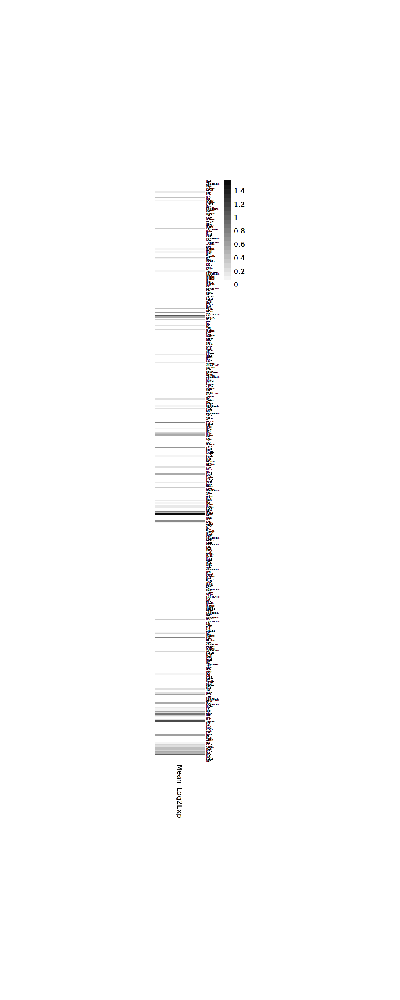

In [488]:
options(repr.plot.width=8, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [489]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_Exp_",cluster_choice,"_sep_pseudobulk_mean.pdf"), width=7, height=plot_height)

png 
  2

In [490]:
tmp_sample_markers_RNA[rownames(tmp_sample_markers_RNA_sub),] <- tmp_sample_markers_RNA_sub

In [491]:
tmp_sample_markers_RNA_zscore <- t(apply(tmp_sample_markers_RNA[gene_list,], 1, scale))
colnames(tmp_sample_markers_RNA_zscore) <- paste0("zscore_", sample_names)
matrix <- tmp_sample_markers_RNA_zscore

In [492]:
is.nan.data.frame <- function(x)
do.call(cbind, lapply(x, is.na))

matrix[is.na.data.frame(matrix)] <- 0

In [493]:
paletteLength <- 100
myColor <- colorRampPalette(c("blue", "white", "red"))(paletteLength/2)
myBreaks <- c(seq(-max(abs(matrix)), max(abs(matrix)), length.out=floor(paletteLength/2)))
myColor[(paletteLength/4):((paletteLength/4)+1)] <- c("#FFFFFF", "#FFFFFF")

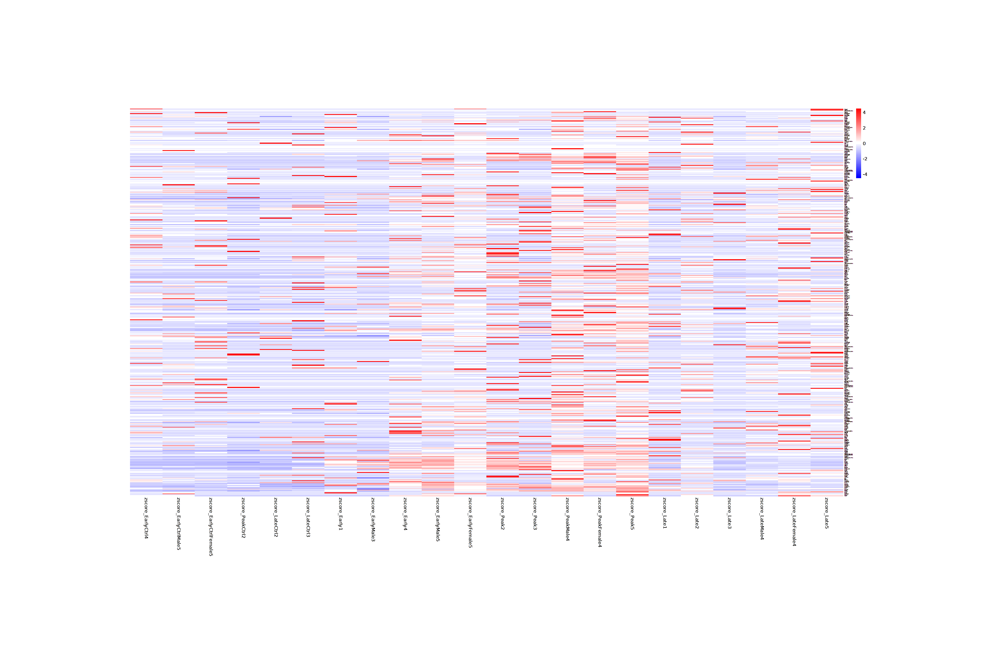

In [494]:
options(repr.plot.width=30, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [495]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_Exp_",cluster_choice,"_sep_pseudobulk_zscore.pdf"), width=30, height=plot_height)

png 
  2

In [496]:
gene_list <- HVG

In [497]:
sample_names <- levels(tmp$orig.ident_merge)

In [498]:
tmp_sample_markers <- as.data.frame(AggregateExpression(tmp, assays = "GenePromAcc", group.by = "orig.ident_merge", normalization.method = "LogNormalize", scale.factor = 10000, return.seurat = TRUE)[["GenePromAcc"]]$data[gene_list,])

Centering and scaling data matrix

  |==========================================================================================| 100%
  |==========================================================================================| 100%


In [499]:
tmp_sample_markers_RNA <- data.frame(matrix(0L, ncol=length(sample_names), nrow=length(gene_list), dimnames=list(gene_list, sample_names)))

In [500]:
gene_list_RNA <- gene_list[gene_list %in% rownames(tmp[['RNA']])]

In [501]:
genes0 <- names(rowSums(tmp[['RNA']]@counts[gene_list_RNA,])[rowSums(tmp[['RNA']]@counts[gene_list_RNA,]) == 0])

In [502]:
gene_list_RNA <- gene_list_RNA[!gene_list_RNA %in% genes0]

In [503]:
tmp_sample_markers_RNA_sub <- as.data.frame(AggregateExpression(tmp, assays = "RNA", group.by = "orig.ident_merge", normalization.method = "LogNormalize", scale.factor = 10000, return.seurat = TRUE)[["RNA"]]$data[gene_list_RNA,])

  |==========================================================================================| 100%


In [504]:
matrix <- tmp_sample_markers/do.call(pmax, tmp_sample_markers)

In [505]:
paletteLength <- 50
myColor <- colorRampPalette(c("#FFBCB5", "#432371"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

In [506]:
plot_height <- ifelse(as.integer(nrow(matrix)/20)<=5, 5, as.integer(nrow(matrix)/20))

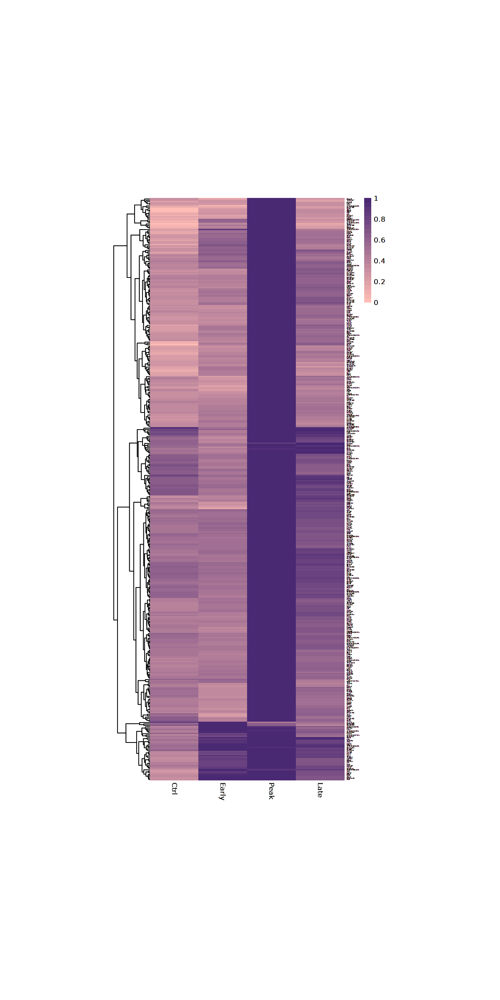

In [507]:
options(repr.plot.width=10, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=TRUE)
ph

In [508]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_",cluster_choice,"_pseudobulk.pdf"), width=10, height=plot_height)

png 
  2

In [509]:
gene_list <- gene_list[ph$tree_row$order]

In [510]:
tmp_sample_markers_mean <- data.frame(matrix(0L, ncol=1, nrow=length(gene_list), dimnames=list(gene_list, "Mean_Log2Acc")))

In [511]:
tmp_sample_markers_mean[rownames(tmp_sample_markers),"Mean_Log2Acc"] <- rowMeans(tmp_sample_markers)

In [512]:
matrix <- tmp_sample_markers_mean

In [513]:
paletteLength <- 50
myColor <- colorRampPalette(c("white", "black"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

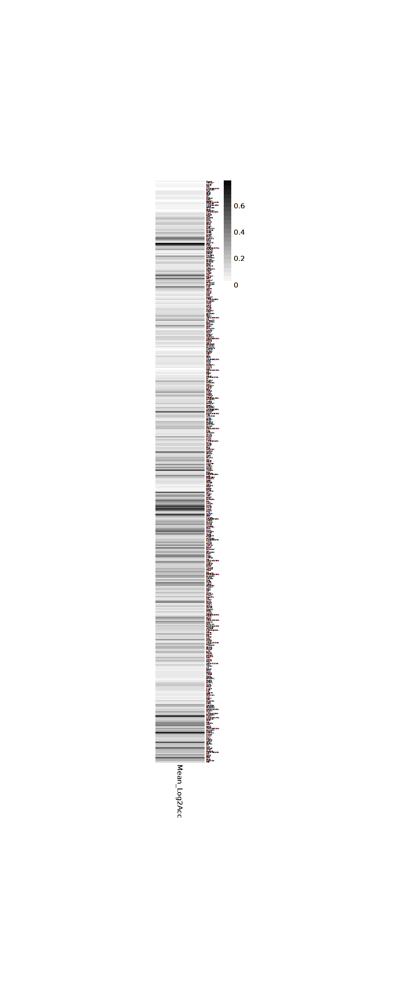

In [514]:
options(repr.plot.width=8, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [515]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_",cluster_choice,"_pseudobulk_mean.pdf"), width=8, height=plot_height)

png 
  2

In [516]:
tmp_sample_markers_zscore <- t(apply(tmp_sample_markers[gene_list,], 1, scale))
colnames(tmp_sample_markers_zscore) <- paste0("zscore_", sample_names)
matrix <- tmp_sample_markers_zscore

In [517]:
paletteLength <- 100
myColor <- colorRampPalette(c("blue", "white", "red"))(paletteLength/2)
myBreaks <- c(seq(-max(abs(matrix)), max(abs(matrix)), length.out=floor(paletteLength/2)))
myColor[(paletteLength/4):((paletteLength/4)+1)] <- c("#FFFFFF", "#FFFFFF")

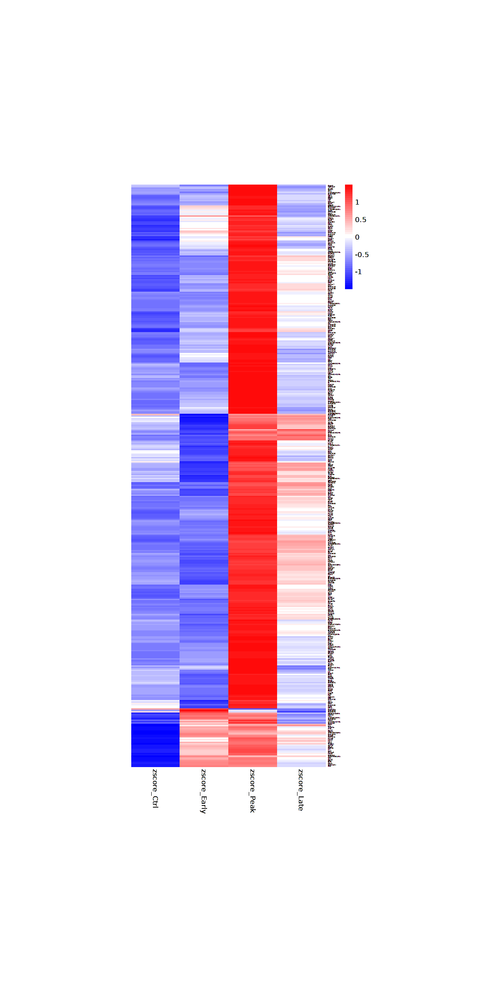

In [518]:
options(repr.plot.width=10, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [519]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_",cluster_choice,"_pseudobulk_zscore.pdf"), width=10, height=plot_height)

png 
  2

In [520]:
matrix <- tmp_sample_markers_RNA
matrix_sub <- tmp_sample_markers_RNA_sub

In [521]:
matrix_sub <- matrix_sub/do.call(pmax, matrix_sub)

In [522]:
is.nan.data.frame <- function(x)
do.call(cbind, lapply(x, is.nan))

matrix_sub[is.nan.data.frame(matrix_sub)] <- 0

In [523]:
matrix[rownames(matrix_sub),] <- matrix_sub
matrix <- matrix[gene_list,]

In [524]:
paletteLength <- 50
myColor <- colorRampPalette(c("#FFFFB3", "#5E3719"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

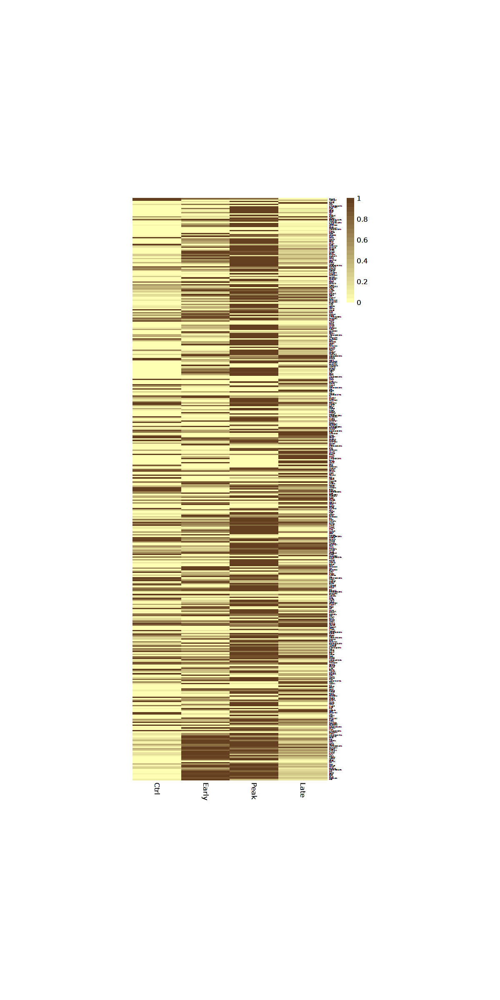

In [525]:
options(repr.plot.width=10, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [526]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_Exp_",cluster_choice,"_pseudobulk.pdf"), width=10, height=plot_height)

png 
  2

In [527]:
tmp_sample_markers_RNA_mean <- data.frame(matrix(0L, ncol=1, nrow=length(gene_list), dimnames=list(gene_list, "Mean_Log2Exp")))

In [528]:
tmp_sample_markers_RNA_mean[rownames(tmp_sample_markers_RNA_sub),"Mean_Log2Exp"] <- rowMeans(tmp_sample_markers_RNA_sub)

In [529]:
matrix <- tmp_sample_markers_RNA_mean

In [530]:
is.nan.data.frame <- function(x)
do.call(cbind, lapply(x, is.na))

matrix[is.na.data.frame(matrix)] <- 0

In [531]:
paletteLength <- 50
myColor <- colorRampPalette(c("white", "black"))(paletteLength/2)
myBreaks <- c(seq(0, max(matrix), length.out=floor(paletteLength/2)))

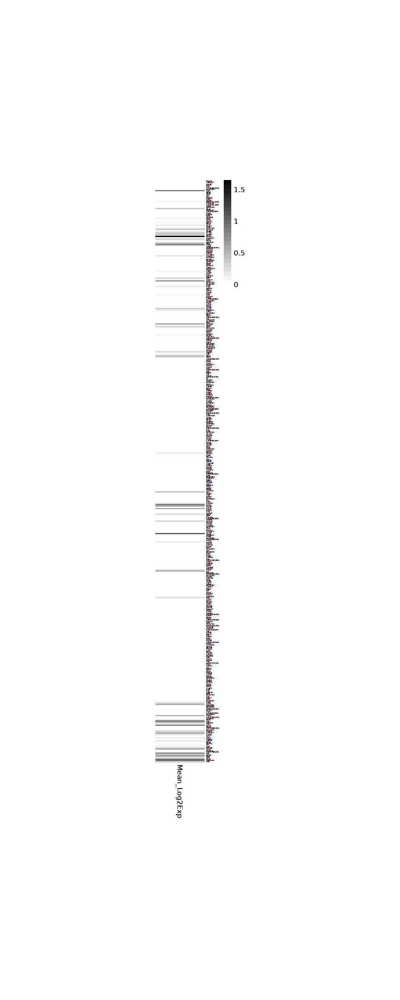

In [532]:
options(repr.plot.width=8, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [533]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_Exp_",cluster_choice,"_pseudobulk_mean.pdf"), width=7, height=plot_height)

png 
  2

In [534]:
tmp_sample_markers_RNA[rownames(tmp_sample_markers_RNA_sub),] <- tmp_sample_markers_RNA_sub

In [535]:
tmp_sample_markers_RNA_zscore <- t(apply(tmp_sample_markers_RNA[gene_list,], 1, scale))
colnames(tmp_sample_markers_RNA_zscore) <- paste0("zscore_", sample_names)
matrix <- tmp_sample_markers_RNA_zscore

In [536]:
is.nan.data.frame <- function(x)
do.call(cbind, lapply(x, is.na))

matrix[is.na.data.frame(matrix)] <- 0

In [537]:
paletteLength <- 100
myColor <- colorRampPalette(c("blue", "white", "red"))(paletteLength/2)
myBreaks <- c(seq(-max(abs(matrix)), max(abs(matrix)), length.out=floor(paletteLength/2)))
myColor[(paletteLength/4):((paletteLength/4)+1)] <- c("#FFFFFF", "#FFFFFF")

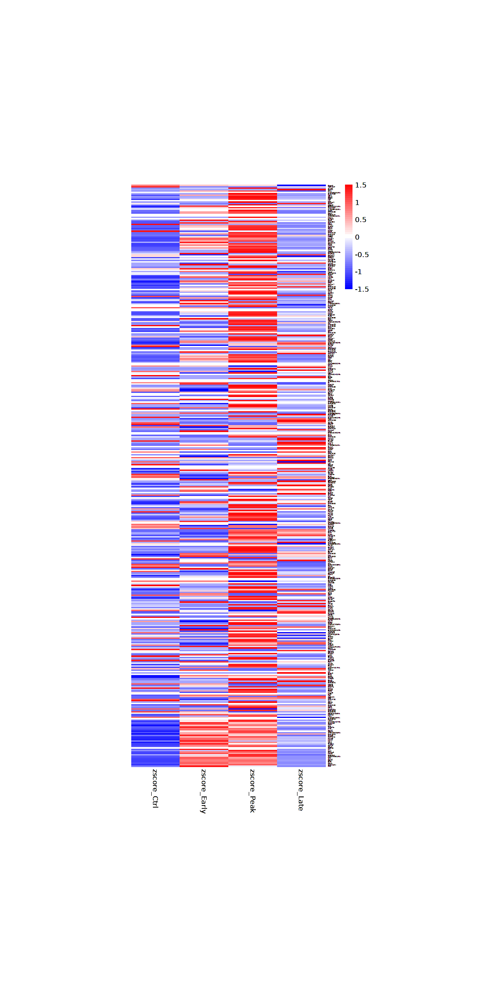

In [538]:
options(repr.plot.width=10, repr.plot.height=plot_height)
ph <- pheatmap(matrix, cellheight = 2, cellwidth = 70, fontsize_number = 2, fontsize_row=2, display_numbers = F, color=myColor, breaks=myBreaks, cluster_cols=FALSE, cluster_rows=FALSE)
ph

In [539]:
save_pheatmap_pdf(ph, paste0(OS_path_outputs, "DGA_Exp_",cluster_choice,"_pseudobulk_zscore.pdf"), width=10, height=plot_height)

png 
  2

## X. Checkpoints

### X.1 Savings

In [541]:
saveRDS(HVGs.list, paste0(OS_path_outputs, "DGA_OL.rds"))